#                                    E-commerce Capastone Project  - UPGRAD & IIIT B

## Problem Statement

 ElecKart is a leading e-commerce chain based in Ontario, Canada, specialising in electronic products. The brand has shown commendable growth in just a few years of its operation. However, over the last one year, ElecKart has faced a revenue dip even after spending a significant amount of money on marketing and promotions. There was a high customer churn ratio because the company was failing to understand customer demographics and cater to the needs of their customers. 
 
 Essentially, the company wants —
 * What are the  KPIs that Drive the Top Line Performance?
 * What is the quantitative impact of each commercial lever on revenue?
 * How eleckart allocate budgets on different marketing campaigns

In [1]:
#import req libraries

import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns


from IPython.core.display import display, HTML
display(HTML("<style>.container {width:100% !important;}</style>"))


import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#Using Cross validation
from sklearn.model_selection import cross_val_score



C:\Users\HP\AppData\Local\Temp\ipykernel_4744\3354056309.py:7: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
#import data

df1 = pd.read_csv("ConsumerElectronics.csv")

pd.set_option('display.float_format', '{:.2f}'.format)
pd.options.display.max_columns = None


In [3]:
df1.shape

(1648824, 20)

In [4]:
df1.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [5]:
df1.describe()

,Year,Month,order_id,order_item_id,units,sla,product_mrp,product_procurement_sla
count,1648824.00,1648824.00,1648824.00,1648824.00,1648824.00,1648824.00,1648824.00,1648824.00
mean,2015.52,6.59,2842444674146328.50,13756277530325384.00,1.02,5.69,4108.31,5.40
std,0.50,3.62,1269134332596894.25,55945981798631008.00,0.25,2.98,8510.92,53.47
min,2015.00,1.00,76331515.00,108016495.00,1.00,0.00,0.00,-1.00
25%,2015.00,3.00,1602588503969575.00,1606725138262300.00,1.00,4.00,799.00,1.00
50%,2016.00,6.00,2611824528743350.00,2619185472741150.00,1.00,6.00,1599.00,2.00
75%,2016.00,10.00,3610613539366250.00,4397705931628400.00,1.00,7.00,3499.00,3.00
max,2016.00,12.00,5395076790260600.00,300037347717704000.00,50.00,1006.00,299999.00,1000.00


In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1648824 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  object 
 9   deliverycdays                    1648824 non-null  object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

### Understanding Data

* FSN ID: The unique identification of each SKU
* Order Date: Date on which the order was placed
* Year/Month: Year and month when the order was placed
* Order ID: The unique identification number of each order
* Order Item ID: When the customer orders two different products at the same time, the system generates two different order * Item IDs under the same order ID. Note that orders are tracked using Order Item IDs.
* GMV: Gross merchandise value or revenue
* Units: Number of units of the specific product sold
* deliverybdays: Number of business days between the placement of the order and the final delivery day
* deliverycdays: Number of calendar days between the placement of the order and the final delivery day
* Order Payment Type: How the payment was made, whether prepaid or cash on delivery
* SLA: Number of days it typically takes to deliver the product
* Cust id: Unique identification of a customer
* pincode: Pin location from where the order was placed
* product_analytic_super_category: Super category to which the product belongs
* product_analytic_category: Category to which the product belongs
* product_analytic_sub_category: Sub-category to which the product belongs
* product_analytic_vertical: Assortment vertical to which the product belongs
* Product MRP: Maximum retail price of the product
* Product procurement SLA: Time typically taken to procure the product


### Data Handling and Cleaning

In [7]:
# # Here We can see that there are few coulumns where the format is different. Let us convert them first
# l =[]
# for i in df1.pincode:
#     try:
#         pd.to_numeric(i)
#     except ValueError:
#         l.append(i)
# print(l)

In [8]:
df1 = df1.replace(r'^\s*$', np.nan, regex=True)

In [9]:
#converting /n values in deliverybdays and deliverycdays to Nan

df1.loc[df1['deliverybdays'].isin(['\\N']),'deliverybdays'] = np.NaN
df1.loc[df1['deliverycdays'].isin(['\\N']),'deliverycdays'] = np.NaN
df1.loc[df1['gmv'].isin([r'^\s*$']),'gmv'] = np.NaN

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1643920 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    335852 non-null   object 
 9   deliverycdays                    335853 non-null   object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

In [11]:
#converting few Dtypes

df1['gmv'] = df1['gmv'].astype(float) 
df1['cust_id'] = df1['cust_id'].astype(float)
df1['pincode'] = df1['pincode'].astype(float)


In [12]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1643920 non-null  float64
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    335852 non-null   object 
 9   deliverycdays                    335853 non-null   object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

In [13]:
df1.describe()

,Year,Month,order_id,order_item_id,gmv,units,sla,cust_id,pincode,product_mrp,product_procurement_sla
count,1648824.00,1648824.00,1648824.00,1648824.00,1643920.00,1648824.00,1648824.00,1643920.00,1643920.00,1648824.00,1648824.00
mean,2015.52,6.59,2842444674146328.50,13756277530325384.00,2461.12,1.02,5.69,-7057686221886427.00,100212752554891296.00,4108.31,5.40
std,0.50,3.62,1269134332596894.25,55945981798631008.00,5618.84,0.25,2.98,5327063552104650752.00,5312978967974574080.00,8510.92,53.47
min,2015.00,1.00,76331515.00,108016495.00,0.00,1.00,0.00,-9223350545281059840.00,-9221830354194010112.00,0.00,-1.00
25%,2015.00,3.00,1602588503969575.00,1606725138262300.00,340.00,1.00,4.00,-4616853753330214912.00,-4414802399060830208.00,799.00,1.00
50%,2016.00,6.00,2611824528743350.00,2619185472741150.00,750.00,1.00,6.00,-17380549602964150.00,124091127596468000.00,1599.00,2.00
75%,2016.00,10.00,3610613539366250.00,4397705931628400.00,1999.00,1.00,7.00,4603580472579527680.00,4786651404994039808.00,3499.00,3.00
max,2016.00,12.00,5395076790260600.00,300037347717704000.00,226947.00,50.00,1006.00,9223362162226820096.00,9222980202332239872.00,299999.00,1000.00


#### Checking Null values


In [14]:
#Checking for Missing Values

missing_vals= round(100*df1.isnull().sum()/len(df1),2)
missing_vals


fsn_id                             0.00
order_date                         0.00
Year                               0.00
Month                              0.00
order_id                           0.00
order_item_id                      0.00
gmv                                0.30
units                              0.00
deliverybdays                     79.63
deliverycdays                     79.63
s1_fact.order_payment_type         0.00
sla                                0.00
cust_id                            0.30
pincode                            0.30
product_analytic_super_category    0.00
product_analytic_category          0.00
product_analytic_sub_category      0.00
product_analytic_vertical          0.00
product_mrp                        0.00
product_procurement_sla            0.00
dtype: float64

* deliverybdays and deliverycdays have 80% null values.Let us impute them with Value 0 assuming order delivered on same day

In [15]:
df1['deliverybdays'].fillna(0,inplace = True)
df1['deliverycdays'].fillna(0,inplace = True)

In [16]:
round(100*df1.isnull().sum()/len(df1),2)

fsn_id                            0.00
order_date                        0.00
Year                              0.00
Month                             0.00
order_id                          0.00
order_item_id                     0.00
gmv                               0.30
units                             0.00
deliverybdays                     0.00
deliverycdays                     0.00
s1_fact.order_payment_type        0.00
sla                               0.00
cust_id                           0.30
pincode                           0.30
product_analytic_super_category   0.00
product_analytic_category         0.00
product_analytic_sub_category     0.00
product_analytic_vertical         0.00
product_mrp                       0.00
product_procurement_sla           0.00
dtype: float64

In [17]:
# Dropping the rows from remaining missing cols:

df1.dropna(inplace = True)
print("Shape after dropping: ",df1.shape)

round(100*df1.isnull().sum()/len(df1),2)

Shape after dropping:  (1643920, 20)


fsn_id                            0.00
order_date                        0.00
Year                              0.00
Month                             0.00
order_id                          0.00
order_item_id                     0.00
gmv                               0.00
units                             0.00
deliverybdays                     0.00
deliverycdays                     0.00
s1_fact.order_payment_type        0.00
sla                               0.00
cust_id                           0.00
pincode                           0.00
product_analytic_super_category   0.00
product_analytic_category         0.00
product_analytic_sub_category     0.00
product_analytic_vertical         0.00
product_mrp                       0.00
product_procurement_sla           0.00
dtype: float64

In [18]:
#Dropping the columns product_analytic_super_category as it has only one value
df1.drop('product_analytic_super_category', axis = 1,inplace = True)

In [19]:
df1['deliverybdays'] = df1['deliverybdays'].astype(float)
df1['deliverycdays'] = df1['deliverycdays'].astype(float)
df1['order_date']= pd.to_datetime(df1['order_date'])

In [20]:
numerical_features=[*df1._get_numeric_data().columns]     # Selecting all Numerical variables
categorical_columns=[*set(df1.columns)-set(numerical_features)]  # Selecting all Categories variables
categorical_columns

['product_analytic_sub_category',
 'product_analytic_vertical',
 's1_fact.order_payment_type',
 'fsn_id',
 'product_analytic_category',
 'order_date']

In [21]:
categorical_columns = ['product_analytic_category',
 'product_analytic_sub_category',
 'product_analytic_vertical',
 's1_fact.order_payment_type','fsn_id']

In [22]:
#Let us check Value counts of all Categorical columns

for i in categorical_columns:
    df1[i] = df1[i].str.lower()

In [23]:
df1.head()  #Checking weather all columns used are correctly lowered..

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400.00,1,0.00,0.00,cod,5,-1012991307785880064.00,-7791755829057349632.00,cameraaccessory,cameraaccessory,cameratripod,7190,0
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900.00,1,0.00,0.00,cod,7,-8990324579055120384.00,7335411490974310400.00,cameraaccessory,cameraaccessory,cameratripod,7190,0
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990.00,1,0.00,0.00,cod,10,-1040442942046599936.00,-7477687762286570496.00,cameraaccessory,cameraaccessory,cameratripod,2099,3
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690.00,1,0.00,0.00,prepaid,4,-7604960843527140352.00,-5835931638776609792.00,cameraaccessory,cameraaccessory,cameratripod,2099,3
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618.00,1,0.00,0.00,prepaid,6,2894557208345299968.00,534735360997241984.00,cameraaccessory,cameraaccessory,cameratripod,2099,3


* Let us check the duplicate values in the Data Frame

In [24]:
#Checking duplicate values in a DF

print('Length of Duplicate Values in DF:',len(df1[df1.duplicated()]))
print('Length of  DF before dropping duplicates:',len(df1))

Length of Duplicate Values in DF: 103978
Length of  DF before dropping duplicates: 1643920


In [25]:
df1 = df1[~df1.duplicated()]

In [26]:
print('Length of Duplicate Values in DF:',len(df1[df1.duplicated()]))
print('Length of  DF after dropping duplicates:',len(df1))

Length of Duplicate Values in DF: 0
Length of  DF after dropping duplicates: 1539942


### Outlier Treatment

In [27]:
df1.describe()

,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_mrp,product_procurement_sla
count,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00,1539942.00
mean,2015.56,6.41,2837449515114298.50,9169671266320432.00,2490.07,1.02,1.00,1.14,5.68,-6928580767031623.00,99174679682807568.00,4165.84,5.35
std,0.50,3.69,1285643785863805.75,42961502633397912.00,5662.20,0.26,2.46,6.24,2.99,5327507901966493696.00,5312387931817240576.00,8607.93,52.98
min,2015.00,1.00,76331515.00,108016495.00,0.00,1.00,-98.00,-5345.00,0.00,-9223350545281059840.00,-9221830354194010112.00,0.00,-1.00
25%,2015.00,3.00,1596819777859875.00,1599337054228550.00,340.00,1.00,0.00,0.00,4.00,-4617766294311915520.00,-4414802399060830208.00,799.00,1.00
50%,2016.00,6.00,2610050785762800.00,2612853929917050.00,750.00,1.00,0.00,0.00,6.00,-17389793586512000.00,125730110649367008.00,1599.00,2.00
75%,2016.00,10.00,3615704980511675.00,3641360684888600.00,1999.00,1.00,0.00,0.00,7.00,4604108337993764864.00,4786651404994039808.00,3499.00,3.00
max,2016.00,12.00,5395076790260600.00,300037347717704000.00,226947.00,50.00,238.00,278.00,1006.00,9223362162226820096.00,9222980202332239872.00,299999.00,1000.00


* We have Negative Values in deliverybdays,deliverycdays,pincode,product_procurement_sla.
* Let us treat them by removing these rows as they cant be in negative are not relevant
* Convertinh negative vals from pincode to positive vals
* Treating outliers from all Vars

In [28]:
print('Negativelen values in deliverybdays:',len(df1['deliverybdays'][(df1['deliverybdays'])<0]))
print('Negativelen values in deliverycdays:',len(df1['deliverycdays'][(df1['deliverycdays'])<0]))
print('Negativelen values in product_procurement_sla:',len(df1['product_procurement_sla'][(df1['product_procurement_sla'])<0]))
print(df1.shape)

Negativelen values in deliverybdays: 38
Negativelen values in deliverycdays: 39
Negativelen values in product_procurement_sla: 70486
(1539942, 19)


In [29]:
#Let us drop above rows from Dataset..

df1 = df1[(df1['deliverybdays']>=0) & (df1['deliverycdays']>=0) & (df1['product_procurement_sla']>=0)]

print('Negativelen values in deliverybdays:',len(df1['deliverybdays'][(df1['deliverybdays'])<0]))
print('Negativelen values in deliverycdays:',len(df1['deliverycdays'][(df1['deliverycdays'])<0]))
print('Negativelen values in product_procurement_sla:',len(df1['product_procurement_sla'][(df1['product_procurement_sla'])<0]))
print(df1.shape)

Negativelen values in deliverybdays: 0
Negativelen values in deliverycdays: 0
Negativelen values in product_procurement_sla: 0
(1469417, 19)


In [30]:
# Writing function to plot and check Outliers:
def plot_var(df,variable):
    #Finding Boundaries
    Q1 = df[variable].quantile(0.25)
    Q3 = df[variable].quantile(0.75)
    IQR = Q3-Q1
    print('Lower Boundary is',  Q1-1.5*IQR)
    print('Upper Boundary is', Q1+1.5*IQR)
    print('......................')
    
    print( df[variable].quantile([0,0.25,0.5,0.75,0.99,1]))
    print('......................')
    plt.figure(figsize = (16,2))
    plt.subplot(1,2,1)
    plt.hist(df[variable].value_counts())
    
    plt.subplot(1,2,2)
    sns.boxplot(df[variable])
    plt.show()

In [31]:
num_cols = [
 'gmv',
 'units',
 'deliverybdays',
 'deliverycdays',
 'sla',
 'product_mrp',
 'product_procurement_sla']

Lower Boundary is -2123.5
Upper Boundary is 2823.5
......................
0.00        0.00
0.25      350.00
0.50      795.00
0.75     1999.00
0.99    30500.00
1.00   226947.00
Name: gmv, dtype: float64
......................


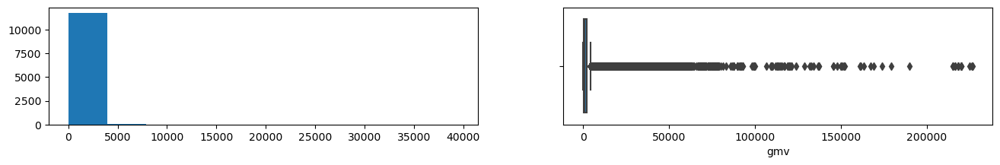

In [32]:
plot_var(df1,'gmv')

Lower Boundary is 1.0
Upper Boundary is 1.0
......................
0.00    1.00
0.25    1.00
0.50    1.00
0.75    1.00
0.99    2.00
1.00   50.00
Name: units, dtype: float64
......................


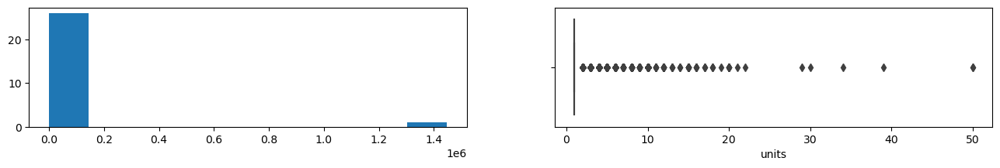

In [33]:
plot_var(df1,'units')

Lower Boundary is 0.0
Upper Boundary is 0.0
......................
0.00     0.00
0.25     0.00
0.50     0.00
0.75     0.00
0.99     8.00
1.00   238.00
Name: deliverybdays, dtype: float64
......................


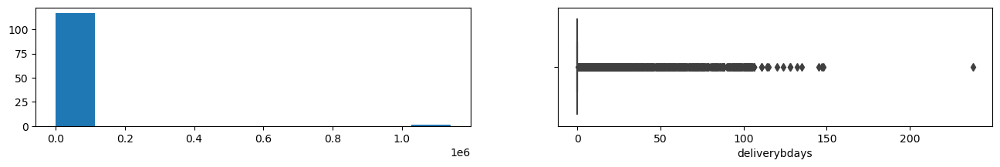

In [34]:
plot_var(df1,'deliverybdays')

Lower Boundary is 0.0
Upper Boundary is 0.0
......................
0.00     0.00
0.25     0.00
0.50     0.00
0.75     0.00
0.99    10.00
1.00   278.00
Name: deliverycdays, dtype: float64
......................


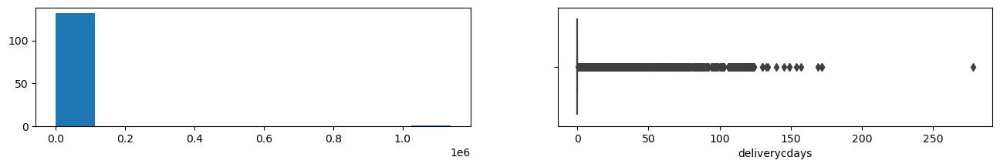

In [35]:
plot_var(df1,'deliverycdays')

Lower Boundary is -0.5
Upper Boundary is 8.5
......................
0.00      0.00
0.25      4.00
0.50      6.00
0.75      7.00
0.99     13.00
1.00   1006.00
Name: sla, dtype: float64
......................


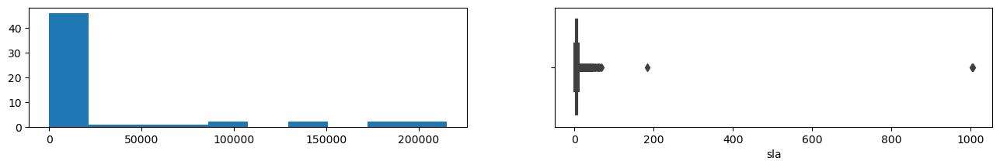

In [36]:
plot_var(df1,'sla')

Lower Boundary is -3126.0
Upper Boundary is 4824.0
......................
0.00       49.00
0.25      849.00
0.50     1699.00
0.75     3499.00
0.99    45990.00
1.00   299999.00
Name: product_mrp, dtype: float64
......................


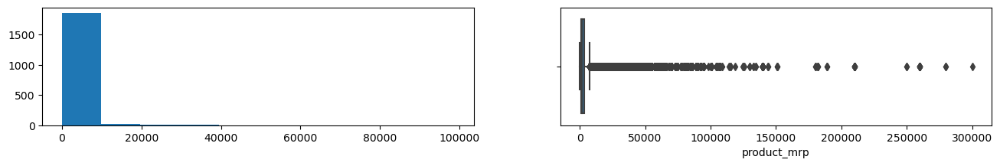

In [37]:
plot_var(df1,'product_mrp')

Lower Boundary is 0.5
Upper Boundary is 3.5
......................
0.00      0.00
0.25      2.00
0.50      2.00
0.75      3.00
0.99     14.00
1.00   1000.00
Name: product_procurement_sla, dtype: float64
......................


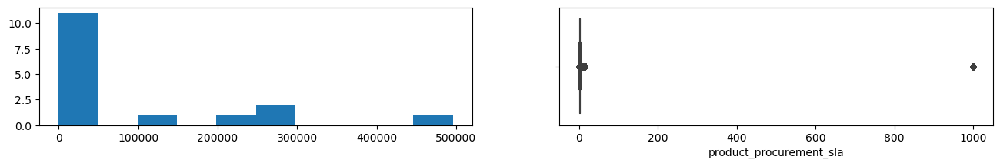

In [38]:
plot_var(df1,'product_procurement_sla')

In [39]:
num_cols

['gmv',
 'units',
 'deliverybdays',
 'deliverycdays',
 'sla',
 'product_mrp',
 'product_procurement_sla']

* gmv,units and product mrp have outliers but they seems to be an expensive items rather than outliers
* deliverybdays, deliverycdays,sla,product_procurement_sla have higher values at 100th percentile which are also bit odd.
* Let us cap drop these values as it is bit odd to have these values in these columns

In [40]:
print(len(df1[(df1['product_procurement_sla']>= 1000)]))

4351


In [41]:
#deleting rows for the column 'product_procurement_sla'
df1 = df1[(df1['product_procurement_sla']< 1000)]

df1.shape

(1465066, 19)

In [42]:
#Capping outliers for other columns at 0.99 percentile
def cap_outliers(data, threshold=0.99):
    upper_bound = np.percentile(data, threshold * 100)
    data[data > upper_bound] = upper_bound
    return data





In [43]:
cols = [
 'deliverybdays',
 'deliverycdays',
 'sla',]

df1[num_cols] = df1[num_cols].apply(cap_outliers, axis=0)



In [44]:
print('Total Rows retained after cleaning data:',df1.shape[0]/1648824 )

Total Rows retained after cleaning data: 0.8885520831817101


### Feature Engineering

* Date Columns

In [45]:
df1.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'cust_id', 'pincode',
       'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla'],
      dtype='object')

In [46]:
day_dict = {
    0:'Mon',
    1:'Tue',
    2:'Wed',
    3:'Thurs',
    4:'Fri',
    5:'Sat',
    6:'Sun'
    
}

df1['day'] =  [day_dict.get(x) for x in df1.order_date.dt.dayofweek]

# Creating new column time from order_time
df1['time'] = df1['order_date'].dt.time
df1['time'] = df1['time'].apply(lambda x: x.hour)

In [47]:
df1.tail(20)

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time
1543977,vpleyap3zyyuvesu,2015-09-28 12:07:07,2015,9,4402769998646300.00,4402769998646300.00,2295.00,1,0.00,0.00,cod,7,-5130702165576139776.00,-5578712158765960192.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Mon,12
1543978,vpleyap3zyyuvesu,2015-09-03 15:33:29,2015,9,2378842905473820.00,2378842905604930.00,2150.00,1,0.00,0.00,cod,4,-8625305872795899904.00,7161197968679300096.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Thurs,15
1543979,vpleyap3zyyuvesu,2015-09-09 20:09:46,2015,9,3381987674768940.00,300037347714017024.00,2018.00,1,0.00,0.00,cod,8,-3532912999346500096.00,7111618022723160064.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Wed,20
1543980,vpleyap3zyyuvesu,2015-09-13 18:22:33,2015,9,3390036882651800.00,3390036882651800.00,2018.00,1,0.00,0.00,cod,8,5636037618511880192.00,2403659772366179840.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Sun,18
1543981,vpleyap3zyyuvesu,2015-09-14 17:41:06,2015,9,3390878836170100.00,3390878836170100.00,2100.00,1,0.00,0.00,cod,12,8647652231019219968.00,922528533677933056.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Mon,17
1543982,vpleyap3zyyuvesu,2015-09-23 12:06:38,2015,9,1398453656735500.00,1398453656735500.00,2300.00,1,0.00,0.00,cod,6,-1275994190376930048.00,-5739450070941689856.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Wed,12
1543983,vpleyap3zyyuvesu,2015-09-27 16:30:39,2015,9,4402069209632400.00,4402069209632400.00,2200.00,1,0.00,0.00,cod,8,633032633665280000.00,6148222843918390272.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Sun,16
1543984,vpleyap3zyyuvesu,2015-09-02 17:49:38,2015,9,2378842905070380.00,2378842905157960.00,2300.00,1,0.00,0.00,cod,5,-2462942080004530176.00,-4838324689682180096.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Wed,17
1543985,vpleyap3zyyuvesu,2015-09-02 20:34:16,2015,9,2378842905149280.00,2378842905245740.00,2150.00,1,0.00,0.00,cod,6,-8071563613022529536.00,-4586478387531449856.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Wed,20
1543986,vpleyap3zyyuvesu,2015-09-05 16:40:17,2015,9,3381987672968710.00,300037347712004992.00,1999.00,1,0.00,0.00,cod,8,-6875331466662080512.00,6264027379405450240.00,entertainmentsmall,tvvideosmall,videoplayer,2499,2,Sat,16


In [48]:
from datetime import datetime

# Deriving time of a day from time..
#EM -  5 to 8
#M - between 8 to 11
#Noon - 11 to 15
#E - 15 to 19
#N - 19 t0 23
#MN - 23 to 5
df1['day_or_might'] = df1['time'].apply(lambda x: 'EM' if x > 5 and x <= 8 
                                        else 'M' if x >=8 and x <11 
                                        else 'Noon' if x>=11 and x<15 
                                        else 'E' if x>=15 and x < 19 
                                        else 'N' if x >=19 and x < 23 
                                        else 'MN')


In [49]:
df1['day_or_might'].value_counts(dropna = False).sort_values(ascending = True)

EM       85242
M       135086
MN      226911
E       324059
Noon    344576
N       349192
Name: day_or_might, dtype: int64

<AxesSubplot:xlabel='day_or_might'>

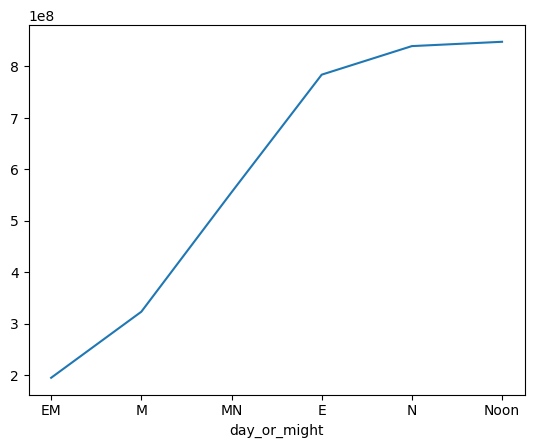

In [50]:
df1.groupby('day_or_might')['gmv'].sum().sort_values(ascending = True).plot()

In [51]:
df1.groupby('day')['gmv'].sum().sort_values(ascending = True)

day
Sun     404378503.54
Thurs   451471900.70
Sat     466247228.20
Tue     491682132.53
Mon     509042721.01
Fri     569006440.02
Wed     652744496.53
Name: gmv, dtype: float64

In [52]:


print(df1['order_date'].min())
print(df1['order_date'].max())

2015-05-19 13:42:09
2016-07-25 01:19:45


In [53]:
#Selecting data deom july 2015 to june 2016
df1 = df1[(df1['order_date'] > '2015-07-01 00:00:00') & (df1['order_date'] < '2016-06-30 11:59:59')]

In [54]:
start_date = df1['order_date'].min()

df1['week'] = df1['order_date'].apply(lambda x: x.week- start_date.week + 1 if x.year == 2015 else x.week + 27 )
#Adding 27 to the weeks in the year 2016 as last week in 2015 is 27

In [55]:
df1.groupby(by=['week'])['order_date'].agg(['min', 'max'])

,min,max
week,,
1,2015-07-01 00:36:11,2015-07-05 01:27:19
2,2015-07-06 05:08:26,2015-07-12 23:59:10
3,2015-07-13 00:01:27,2015-07-19 23:59:24
4,2015-07-20 00:01:31,2015-07-26 23:59:48
5,2015-07-27 00:01:21,2015-08-02 18:59:53
6,2015-08-03 09:54:25,2015-08-09 20:20:27
7,2015-08-10 15:48:15,2015-08-16 21:42:46
8,2015-08-17 20:47:50,2015-08-22 14:21:00
9,2015-08-24 11:43:21,2015-08-30 18:50:10


* There is a outlier in week 80 of no where.
* And it is the continuation of week 27 going by the dates. Let us replace week 80 with 27

In [56]:
df1['week'][(df1['week']==80)] =  27
df1.groupby(by=['week'])['order_date'].agg(['min', 'max'])

,min,max
week,,
1,2015-07-01 00:36:11,2015-07-05 01:27:19
2,2015-07-06 05:08:26,2015-07-12 23:59:10
3,2015-07-13 00:01:27,2015-07-19 23:59:24
4,2015-07-20 00:01:31,2015-07-26 23:59:48
5,2015-07-27 00:01:21,2015-08-02 18:59:53
6,2015-08-03 09:54:25,2015-08-09 20:20:27
7,2015-08-10 15:48:15,2015-08-16 21:42:46
8,2015-08-17 20:47:50,2015-08-22 14:21:00
9,2015-08-24 11:43:21,2015-08-30 18:50:10


### KPI's

### A - KPIs replated to Advertisement

In [57]:
#Media Investment data

media_investment  = pd.read_excel("Media data and other information.xlsx", sheet_name='Media Investment', skiprows =2, skipfooter = 4, usecols=lambda x: 'Unnamed' not in x )

In [58]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,NaN,NaN
1,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,NaN,NaN
2,2015,9,96.25,3.88,1.36,62.79,0.61,16.38,5.04,6.20,NaN,NaN
3,2015,10,170.16,6.14,12.62,84.67,3.44,24.37,6.97,31.93,NaN,NaN
4,2015,11,51.22,4.22,1.28,14.17,0.17,19.56,6.60,5.22,NaN,NaN


In [59]:
media_investment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               12 non-null     int64  
 1   Month              12 non-null     int64  
 2   Total Investment   12 non-null     float64
 3   TV                 12 non-null     float64
 4   Digital            12 non-null     float64
 5   Sponsorship        12 non-null     float64
 6   Content Marketing  12 non-null     float64
 7   Online marketing   12 non-null     float64
 8    Affiliates        12 non-null     float64
 9   SEM                12 non-null     float64
 10  Radio              3 non-null      float64
 11  Other              3 non-null      float64
dtypes: float64(10), int64(2)
memory usage: 1.2 KB


In [60]:
#Checking for Missing Values

missing_vals1= round(100*media_investment.isnull().sum()/len(media_investment),2)
missing_vals1

Year                 0.00
Month                0.00
Total Investment     0.00
TV                   0.00
Digital              0.00
Sponsorship          0.00
Content Marketing    0.00
Online marketing     0.00
 Affiliates          0.00
SEM                  0.00
Radio               75.00
Other               75.00
dtype: float64

In [61]:
media_investment['Year']  = media_investment['Year'].astype(str)
media_investment['Month']  = media_investment['Month'].astype(str)

In [62]:
media_investment.fillna(0, inplace = True)

In [63]:
media_investment['date']  = pd.to_datetime(media_investment['Year']+'/'+media_investment['Month'] + '/'+str(1))

media_investment['date'] 

0    2015-07-01
1    2015-08-01
2    2015-09-01
3    2015-10-01
4    2015-11-01
5    2015-12-01
6    2016-01-01
7    2016-02-01
8    2016-03-01
9    2016-04-01
10   2016-05-01
11   2016-06-01
Name: date, dtype: datetime64[ns]

In [64]:
media_investment = media_investment.set_index('date')

In [65]:
idx = media_investment.index[-1] + pd.offsets.MonthBegin(1)
media_investment = media_investment.append(media_investment.iloc[[-1]].rename({media_investment.index[-1]: idx}))
media_investment

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
date,,,,,,,,,,,,
2015-07-01,2015,7,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,0.00,0.00
2015-08-01,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00
2015-09-01,2015,9,96.25,3.88,1.36,62.79,0.61,16.38,5.04,6.20,0.00,0.00
2015-10-01,2015,10,170.16,6.14,12.62,84.67,3.44,24.37,6.97,31.93,0.00,0.00
2015-11-01,2015,11,51.22,4.22,1.28,14.17,0.17,19.56,6.60,5.22,0.00,0.00
2015-12-01,2015,12,106.75,5.40,3.06,56.71,1.07,22.50,6.83,11.18,0.00,0.00
2016-01-01,2016,1,74.20,4.38,0.46,4.20,0.90,22.90,7.37,4.20,2.70,27.09
2016-02-01,2016,2,48.05,2.59,1.91,11.73,0.60,19.89,6.47,4.87,0.00,0.00
2016-03-01,2016,3,100.02,9.30,2.10,41.59,0.37,18.44,6.22,5.19,0.87,15.95


In [66]:
#Resampling the data on weekly frequency
media_investment = media_investment.resample('W').ffill().iloc[:-1]

media_investment

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
date,,,,,,,,,,,,
2015-07-05,2015,7,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,0.00,0.00
2015-07-12,2015,7,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,0.00,0.00
2015-07-19,2015,7,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,0.00,0.00
2015-07-26,2015,7,17.06,0.22,2.53,7.41,0.00,1.33,0.55,5.02,0.00,0.00
2015-08-02,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00
2015-08-09,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00
2015-08-16,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00
2015-08-23,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00
2015-08-30,2015,8,5.06,0.01,1.28,1.06,0.00,0.13,0.07,2.51,0.00,0.00


In [67]:
### divide by size of months
media_investment['Total Investment'] /= media_investment.resample('MS')['Total Investment'].transform('size')
media_investment['TV'] /= media_investment.resample('MS')['TV'].transform('size')
media_investment['Digital'] /= media_investment.resample('MS')['Digital'].transform('size')
media_investment['Sponsorship'] /= media_investment.resample('MS')['Sponsorship'].transform('size')
media_investment['Content Marketing'] /= media_investment.resample('MS')['Content Marketing'].transform('size')
media_investment['Online marketing'] /= media_investment.resample('MS')['Online marketing'].transform('size')
media_investment[' Affiliates'] /= media_investment.resample('MS')[' Affiliates'].transform('size')
media_investment['SEM'] /= media_investment.resample('MS')['SEM'].transform('size')
media_investment['Radio'] /= media_investment.resample('MS')['Radio'].transform('size')
media_investment['Other'] /= media_investment.resample('MS')['Other'].transform('size')

In [68]:
import plotly.express as px

px.line(media_investment ,  x = media_investment.index, y =  media_investment['Total Investment'])


In [69]:
media_investment

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
date,,,,,,,,,,,,
2015-07-05,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2015-07-12,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2015-07-19,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2015-07-26,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
2015-08-02,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
2015-08-09,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
2015-08-16,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
2015-08-23,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
2015-08-30,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00


In [70]:
#Function to create adstock
def adst_ad(ads_rate, ad ):
    
    Ads = []
    for i in range(len(ad)):
        if i == 0: 
            Ads.append(ad.iloc[i])
        else:
            Ads.append(ad.iloc[i] + ads_rate * ad.iloc[i-1])            
    return Ads

In [71]:
# Taking decay_rate = 0.6 
media_investment['TI_adstock'] = adst_ad(0.6, media_investment['Total Investment'])
media_investment['TV_adstock'] = adst_ad(0.6, media_investment['TV'])
media_investment['Digital_adstock'] = adst_ad(0.6, media_investment['Digital'])
media_investment['Sponsorship_adstock'] =adst_ad(0.6, media_investment['Sponsorship'])
media_investment['Content_Marketing_adstock'] = adst_ad(0.6, media_investment['Content Marketing'])
media_investment['Online_marketing_adstock'] = adst_ad(0.6, media_investment['Online marketing'])
media_investment['Affiliates_adstock'] = adst_ad(0.6, media_investment[' Affiliates'])
media_investment['SEM_adstock'] = adst_ad(0.6, media_investment['SEM'])
media_investment['Radio_adstock'] = adst_ad(0.6, media_investment['Radio'])
media_investment['Other_adstock'] = adst_ad(0.6, media_investment['Other'])

In [72]:
media_investment = media_investment.reset_index(drop=False)

In [73]:
start_date = df1['order_date'].min()

media_investment['week'] = media_investment['date'].apply(lambda x: x.week- start_date.week + 1 if x.year == 2015 else x.week + 27 )
media_investment.groupby(by=['week'])['date'].agg(['min', 'max'])

,min,max
week,,
1,2015-07-05,2015-07-05
2,2015-07-12,2015-07-12
3,2015-07-19,2015-07-19
4,2015-07-26,2015-07-26
5,2015-08-02,2015-08-02
6,2015-08-09,2015-08-09
7,2015-08-16,2015-08-16
8,2015-08-23,2015-08-23
9,2015-08-30,2015-08-30


In [74]:
media_investment['week'][(media_investment['week']==80)] =  27

In [75]:
media_investment.groupby(by=['week'])['date'].agg(['min', 'max'])

,min,max
week,,
1,2015-07-05,2015-07-05
2,2015-07-12,2015-07-12
3,2015-07-19,2015-07-19
4,2015-07-26,2015-07-26
5,2015-08-02,2015-08-02
6,2015-08-09,2015-08-09
7,2015-08-16,2015-08-16
8,2015-08-23,2015-08-23
9,2015-08-30,2015-08-30


-- Calculating Simple Moving average for all advertising KPIs

In [76]:
media_investment.columns

Index(['date', 'Year', 'Month', 'Total Investment', 'TV', 'Digital',
       'Sponsorship', 'Content Marketing', 'Online marketing', ' Affiliates',
       'SEM', 'Radio', 'Other', 'TI_adstock', 'TV_adstock', 'Digital_adstock',
       'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Radio_adstock', 'Other_adstock', 'week'],
      dtype='object')

In [77]:
media_investment['TI_SMA3'] =  media_investment['Total Investment'].rolling(3).mean()
media_investment['TV_SMA3'] =  media_investment['TV'].rolling(3).mean()
media_investment['Digital_SMA3'] =  media_investment['Digital'].rolling(3).mean()
media_investment['Sponsorship_SMA3'] =  media_investment['Sponsorship'].rolling(3).mean()
media_investment['ContentMarketing_SMA3'] =  media_investment['Content Marketing'].rolling(3).mean()
media_investment['Onlinemarketing_SMA3'] =  media_investment['Online marketing'].rolling(3).mean()
media_investment['Affiliates_SMA3'] =  media_investment[' Affiliates'].rolling(3).mean()
media_investment['SEM_SMA3'] =  media_investment['SEM'].rolling(3).mean()
media_investment['Radio_SMA3'] =  media_investment['Radio'].rolling(3).mean()
media_investment['Other_SMA3'] =  media_investment['Other'].rolling(3).mean()

In [78]:
media_investment

,date,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Radio_adstock,Other_adstock,week,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3
0,2015-07-05,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-07-12,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,0.00,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-19,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,0.00,3,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
3,2015-07-26,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,0.00,4,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
4,2015-08-02,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,0.00,5,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00
5,2015-08-09,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,6,2.10,0.02,0.38,0.76,0.00,0.13,0.06,0.75,0.00,0.00
6,2015-08-16,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,7,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
7,2015-08-23,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
8,2015-08-30,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,9,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
9,2015-09-06,2015,9,24.06,0.97,0.34,15.70,0.15,4.09,1.26,1.55,0.00,0.00,24.67,0.97,0.49,15.82,0.15,4.11,1.27,1.85,0.00,0.00,10,8.70,0.32,0.28,5.37,0.05,1.38,0.43,0.85,0.00,0.00


In [79]:
new = media_investment.tail(1)
new['week'] = 53
df3 = pd.concat([media_investment, new], ignore_index = True)
df3.reset_index()
df3

,date,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Radio_adstock,Other_adstock,week,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3
0,2015-07-05,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-07-12,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,0.00,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-19,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,0.00,3,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
3,2015-07-26,2015,7,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,0.00,4,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
4,2015-08-02,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,0.00,5,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00
5,2015-08-09,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,6,2.10,0.02,0.38,0.76,0.00,0.13,0.06,0.75,0.00,0.00
6,2015-08-16,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,7,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
7,2015-08-23,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
8,2015-08-30,2015,8,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,0.00,9,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00
9,2015-09-06,2015,9,24.06,0.97,0.34,15.70,0.15,4.09,1.26,1.55,0.00,0.00,24.67,0.97,0.49,15.82,0.15,4.11,1.27,1.85,0.00,0.00,10,8.70,0.32,0.28,5.37,0.05,1.38,0.43,0.85,0.00,0.00


### P - KPI's related to price

In [80]:
df1.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'cust_id', 'pincode',
       'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla',
       'day', 'time', 'day_or_might', 'week'],
      dtype='object')

In [81]:
df1['s1_fact.order_payment_type'].value_counts()

cod        1052073
prepaid     410064
Name: s1_fact.order_payment_type, dtype: int64

* GMV = Sales Price of Goods x Number of Goods Sold
* Let us derive a columns listing price using GMV and Number of units

In [82]:
df1['listing_price'] = round(df1['gmv']/df1['units'])

In [83]:
df1['listing_price'].head()

0   6400.00
1   6900.00
2   1990.00
3   1690.00
4   1618.00
Name: listing_price, dtype: float64

In [84]:
len(df1.loc[df1.listing_price>df1.product_mrp])


29902

* There are columns with listing price More than MRP, which should nt be the case. Let us replace MRP with listing price

In [85]:
df1['product_mrp'].loc[df1.listing_price>df1.product_mrp] = df1['listing_price'].loc[df1.listing_price>df1.product_mrp]

In [86]:
len(df1.loc[df1.listing_price>df1.product_mrp])

0

In [87]:
df1.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time,day_or_might,week,listing_price
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400.00,1,0.00,0.00,cod,5,-1012991307785880064.00,-7791755829057349632.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Sat,15,E,16,6400.00
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900.00,1,0.00,0.00,cod,7,-8990324579055120384.00,7335411490974310400.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Mon,10,M,17,6900.00
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990.00,1,0.00,0.00,cod,10,-1040442942046599936.00,-7477687762286570496.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Tue,15,E,17,1990.00
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690.00,1,0.00,0.00,prepaid,4,-7604960843527140352.00,-5835931638776609792.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Wed,12,Noon,16,1690.00
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618.00,1,0.00,0.00,prepaid,6,2894557208345299968.00,534735360997241984.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Sat,21,N,16,1618.00


### D -  KPI's related to discount

In [88]:
# - Dicount% = MRP-Listingprice/MRP

df1['discount'] = round(((df1.product_mrp - df1.listing_price)/(df1.product_mrp)*100),2)

In [89]:
df1['discount'].head()

0   10.99
1    4.03
2    5.19
3   19.49
4   22.92
Name: discount, dtype: float64

### Q -  KPI's Related to Product assortment and Quality

* Order_payment_type
* Generating new coulumn weather product is premium or not
* NPS score from the customers

In [90]:
df1 = df1.rename(columns={'s1_fact.order_payment_type': 'order_payment_type'})  #Renaming column s1_fact.order_payment_type

In [91]:
df1.order_payment_type.value_counts()

cod        1052073
prepaid     410064
Name: order_payment_type, dtype: int64

In [92]:
df1 = pd.get_dummies(df1, columns=['order_payment_type'],drop_first=True)
df1.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time,day_or_might,week,listing_price,discount,order_payment_type_prepaid
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400.00,1,0.00,0.00,5,-1012991307785880064.00,-7791755829057349632.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Sat,15,E,16,6400.00,10.99,0
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900.00,1,0.00,0.00,7,-8990324579055120384.00,7335411490974310400.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Mon,10,M,17,6900.00,4.03,0
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990.00,1,0.00,0.00,10,-1040442942046599936.00,-7477687762286570496.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Tue,15,E,17,1990.00,5.19,0
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690.00,1,0.00,0.00,4,-7604960843527140352.00,-5835931638776609792.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Wed,12,Noon,16,1690.00,19.49,1
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618.00,1,0.00,0.00,6,2894557208345299968.00,534735360997241984.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Sat,21,N,16,1618.00,22.92,1


In [93]:
df1.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'cust_id',
       'pincode', 'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla',
       'day', 'time', 'day_or_might', 'week', 'listing_price', 'discount',
       'order_payment_type_prepaid'],
      dtype='object')

In [94]:
percentiles=[0,0.25,0.5,0.75,0.8,0.9,1]
df1['product_mrp'].describe(percentiles)

count   1462137.00
mean       4177.77
std        8282.34
min          49.00
0%           49.00
25%         849.00
50%        1699.00
75%        3499.00
80%        3999.00
90%        7150.00
100%      45990.00
max       45990.00
Name: product_mrp, dtype: float64

* Assuming the products more than 80% are premium products, let us create a new column Premium_product

In [95]:
quantle_8 = df1['product_mrp'].quantile(0.8)
quantle_8

3999.0

In [96]:
df1['Premium_product'] = df1['product_mrp'].apply(lambda x: '1' if x>=quantle_8  else '0')
df1.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time,day_or_might,week,listing_price,discount,order_payment_type_prepaid,Premium_product
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400.00,1,0.00,0.00,5,-1012991307785880064.00,-7791755829057349632.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Sat,15,E,16,6400.00,10.99,0,1
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900.00,1,0.00,0.00,7,-8990324579055120384.00,7335411490974310400.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Mon,10,M,17,6900.00,4.03,0,1
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990.00,1,0.00,0.00,10,-1040442942046599936.00,-7477687762286570496.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Tue,15,E,17,1990.00,5.19,0,0
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690.00,1,0.00,0.00,4,-7604960843527140352.00,-5835931638776609792.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Wed,12,Noon,16,1690.00,19.49,1,0
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618.00,1,0.00,0.00,6,2894557208345299968.00,534735360997241984.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Sat,21,N,16,1618.00,22.92,1,0


In [97]:
#load nps dataset

nps_df= pd.read_excel('Media data and other information.xlsx', sheet_name = 'Monthly NPS Score')

In [98]:
nps_df

,Unnamed: 0,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.60,59.99,46.93,44.40,47.00,45.80,47.09,50.33,49.02,51.83,47.31,50.52
1,Stock Index,1177.00,1206.00,1101.00,1210.00,1233.00,1038.00,1052.00,1222.00,1015.00,1242.00,1228.00,1194.00


In [99]:
nps_df = nps_df.T
nps_df

,0,1
Unnamed: 0,NPS,Stock Index
July'15,54.60,1177.00
Aug'15,59.99,1206.00
Sept'15,46.93,1101.00
Oct'15,44.40,1210.00
Nov'15,47.00,1233.00
Dec'15,45.80,1038.00
Jan'16,47.09,1052.00
Feb'16,50.33,1222.00
Mar'16,49.02,1015.00


In [100]:
# renaming columns
nps_df.reset_index(drop=False, inplace=True)
nps_df.columns = ['Month', 'NPS', 'Stock Index']


In [101]:
nps_df

,Month,NPS,Stock Index
0,Unnamed: 0,NPS,Stock Index
1,July'15,54.60,1177.00
2,Aug'15,59.99,1206.00
3,Sept'15,46.93,1101.00
4,Oct'15,44.40,1210.00
5,Nov'15,47.00,1233.00
6,Dec'15,45.80,1038.00
7,Jan'16,47.09,1052.00
8,Feb'16,50.33,1222.00
9,Mar'16,49.02,1015.00


In [102]:
nps_df.drop(nps_df.head(1).index,inplace  = True)
nps_df.reset_index(drop=False, inplace=True)

In [103]:
nps_df['Month'] = pd.Series([7,8,9,10,11,12,1,2,3,4,5,6])
nps_df['Year'] = pd.Series([2015,2015,2015,2015,2015,2015,2016,2016,2016,2016,2016,2016])

In [104]:
nps_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   index        12 non-null     int64 
 1   Month        12 non-null     int64 
 2   NPS          12 non-null     object
 3   Stock Index  12 non-null     object
 4   Year         12 non-null     int64 
dtypes: int64(3), object(2)
memory usage: 608.0+ bytes


In [105]:
nps_df.Month = nps_df.Month.astype('int32')
nps_df.NPS = nps_df.NPS.astype('float')
nps_df['Stock Index'] = nps_df['Stock Index'].astype('float')
nps_df.Year = nps_df.Year.astype('int32')

In [106]:
nps_df

,index,Month,NPS,Stock Index,Year
0,1,7,54.60,1177.00,2015
1,2,8,59.99,1206.00,2015
2,3,9,46.93,1101.00,2015
3,4,10,44.40,1210.00,2015
4,5,11,47.00,1233.00,2015
5,6,12,45.80,1038.00,2015
6,7,1,47.09,1052.00,2016
7,8,2,50.33,1222.00,2016
8,9,3,49.02,1015.00,2016
9,10,4,51.83,1242.00,2016


In [107]:
nps_df = nps_df[['Month','NPS','Stock Index']]
nps_df

,Month,NPS,Stock Index
0,7,54.60,1177.00
1,8,59.99,1206.00
2,9,46.93,1101.00
3,10,44.40,1210.00
4,11,47.00,1233.00
5,12,45.80,1038.00
6,1,47.09,1052.00
7,2,50.33,1222.00
8,3,49.02,1015.00
9,4,51.83,1242.00


In [108]:
#Merge NPS score and Stock index data with Main Dataset
df1 = pd.merge(df1,nps_df, on = 'Month')
df1.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time,day_or_might,week,listing_price,discount,order_payment_type_prepaid,Premium_product,NPS,Stock Index
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400.00,1,0.00,0.00,5,-1012991307785880064.00,-7791755829057349632.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Sat,15,E,16,6400.00,10.99,0,1,44.40,1210.00
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900.00,1,0.00,0.00,7,-8990324579055120384.00,7335411490974310400.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Mon,10,M,17,6900.00,4.03,0,1,44.40,1210.00
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990.00,1,0.00,0.00,10,-1040442942046599936.00,-7477687762286570496.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Tue,15,E,17,1990.00,5.19,0,0,44.40,1210.00
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690.00,1,0.00,0.00,4,-7604960843527140352.00,-5835931638776609792.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Wed,12,Noon,16,1690.00,19.49,1,0,44.40,1210.00
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618.00,1,0.00,0.00,6,2894557208345299968.00,534735360997241984.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Sat,21,N,16,1618.00,22.92,1,0,44.40,1210.00


### T - KPI's related to industry trend, Seasonality Etc..

* Let us Import Specil Sale Calender

In [109]:
Sale_calender = pd.read_excel('Media data and other information.xlsx', sheet_name  = 'Special Sale Calendar')

In [110]:
Sale_calender

,Unnamed: 0,Unnamed: 1,Sales Calendar
0,NaN,2015.00,(18-19th July)
1,NaN,NaN,(15-17th Aug)
2,NaN,NaN,(28-30th Aug)
3,NaN,NaN,(15-17th Oct)
4,NaN,NaN,(7-14th Nov)
5,NaN,NaN,(25th Dec'15 - 3rd Jan'16)
6,NaN,2016.00,(20-22 Jan)
7,NaN,NaN,(1-2 Feb)
8,NaN,NaN,(20-21 Feb)
9,NaN,NaN,(14-15 Feb)


* As the above dataset is relatively small, Let us create New Calender DF using above.


In [111]:
Calender_df = pd.DataFrame()
Calender_df['Year'] = pd.Series([2015,2015,2015,2015,2015,2015,2016,2016,2016,2016,2016,2016])
Calender_df['Sales']  = Sale_calender['Sales Calendar']


In [112]:
Calender_df

,Year,Sales
0,2015,(18-19th July)
1,2015,(15-17th Aug)
2,2015,(28-30th Aug)
3,2015,(15-17th Oct)
4,2015,(7-14th Nov)
5,2015,(25th Dec'15 - 3rd Jan'16)
6,2016,(20-22 Jan)
7,2016,(1-2 Feb)
8,2016,(20-21 Feb)
9,2016,(14-15 Feb)


In [113]:
Calender_df

,Year,Sales
0,2015,(18-19th July)
1,2015,(15-17th Aug)
2,2015,(28-30th Aug)
3,2015,(15-17th Oct)
4,2015,(7-14th Nov)
5,2015,(25th Dec'15 - 3rd Jan'16)
6,2016,(20-22 Jan)
7,2016,(1-2 Feb)
8,2016,(20-21 Feb)
9,2016,(14-15 Feb)


In [114]:
#Let us split 25th Dec to 3rd jan Sale dats to two different rows


dict1 = {'Year':[2015,2016],
        'Sales':['25-31 Dec','1-3 Jan'],
       } 
df = pd.DataFrame(dict1)
Calender_df = Calender_df.append(df, ignore_index = True)

Calender_df = Calender_df[ Calender_df['Sales'] != Calender_df.Sales.iloc[5]]

In [115]:
Calender_df

,Year,Sales
0,2015,(18-19th July)
1,2015,(15-17th Aug)
2,2015,(28-30th Aug)
3,2015,(15-17th Oct)
4,2015,(7-14th Nov)
6,2016,(20-22 Jan)
7,2016,(1-2 Feb)
8,2016,(20-21 Feb)
9,2016,(14-15 Feb)
10,2016,(7-9 Mar)


In [116]:
Calender_df['Start_date'] = Calender_df['Sales'].apply(lambda x: x.replace('(','').split('-')[0])
Calender_df['End_date']=Calender_df['Sales'].apply(lambda x: x.replace(')','').replace('th','').split('-')[1].split(' ')[0])
Calender_df['Month']=Calender_df['Sales'].apply(lambda x: x.replace(')','').replace('th','').split('-')[1].split(' ')[1])


Month_dict = {
    'Jan':1,
    'Feb':2,
    'Mar':3,
    'Apr':4,
    'May':5,
    'June':6,
    'July':7,
    'Aug':8,
    'Sept':9,
    'Oct':10,
    'Nov':11,
    'Dec':12
    }
    
Calender_df['Month1'] =  [Month_dict.get(x) for x in Calender_df['Month']]

Calender_df


,Year,Sales,Start_date,End_date,Month,Month1
0,2015,(18-19th July),18,19,July,7
1,2015,(15-17th Aug),15,17,Aug,8
2,2015,(28-30th Aug),28,30,Aug,8
3,2015,(15-17th Oct),15,17,Oct,10
4,2015,(7-14th Nov),7,14,Nov,11
6,2016,(20-22 Jan),20,22,Jan,1
7,2016,(1-2 Feb),1,2,Feb,2
8,2016,(20-21 Feb),20,21,Feb,2
9,2016,(14-15 Feb),14,15,Feb,2
10,2016,(7-9 Mar),7,9,Mar,3


In [117]:
iter = 0
import datetime
Sales_On= []
for i,r in Calender_df.iterrows():
    
    
    Start_Date = int(r.Start_date)
    End_Date =int(r.End_date)
    month =r.Month1
    year = r.Year
    
   
    
    
    while Start_Date <= End_Date:
        
        day = datetime.datetime.strptime('{}-{}-{}'.format(Start_Date, month, year), '%d-%m-%Y').strftime('%d-%m-%Y')
        Sales_On.append(day)
        
        
        Start_Date+=1
        iter+=1

        
Sales_On    

['18-07-2015',
 '19-07-2015',
 '15-08-2015',
 '16-08-2015',
 '17-08-2015',
 '28-08-2015',
 '29-08-2015',
 '30-08-2015',
 '15-10-2015',
 '16-10-2015',
 '17-10-2015',
 '07-11-2015',
 '08-11-2015',
 '09-11-2015',
 '10-11-2015',
 '11-11-2015',
 '12-11-2015',
 '13-11-2015',
 '14-11-2015',
 '20-01-2016',
 '21-01-2016',
 '22-01-2016',
 '01-02-2016',
 '02-02-2016',
 '20-02-2016',
 '21-02-2016',
 '14-02-2016',
 '15-02-2016',
 '07-03-2016',
 '08-03-2016',
 '09-03-2016',
 '25-05-2016',
 '26-05-2016',
 '27-05-2016',
 '25-12-2015',
 '26-12-2015',
 '27-12-2015',
 '28-12-2015',
 '29-12-2015',
 '30-12-2015',
 '31-12-2015',
 '01-01-2016',
 '02-01-2016',
 '03-01-2016']

In [118]:
#Adding Sales calender to the main Data..

df1['Sale_date'] = df1['order_date'].apply(lambda x: 1 if x.strftime('%d-%m-%Y') in Sales_On else 0  )


In [119]:
df1['Sale_date'].value_counts()

0    1188841
1     273296
Name: Sale_date, dtype: int64

* Payday -- if the first or fifteenth of the month. Usually in canada payday for a specific pay period is 2 weeks after the end of that pay period. 


In [120]:
df1['Is_Payday'] = df1['order_date'].apply(lambda x: 1 if x.strftime('%d') in ['1','15'] else 0)

In [121]:
df1['Is_Payday'].value_counts()

0    1409439
1      52698
Name: Is_Payday, dtype: int64

* Uploading climate dataset

In [122]:
climate_df_2015 = pd.read_excel('ONTARIO-2015.xlsx',skiprows=24)
climate_df_2016 = pd.read_excel('ONTARIO-2016.xlsx',skiprows=24)
print('Shape of climate_df_2015:',climate_df_2015.shape)
print('Shape of climate_df_2016:',climate_df_2016.shape)

Shape of climate_df_2015: (365, 27)
Shape of climate_df_2016: (366, 27)


In [123]:
climate_df=pd.concat([climate_df_2015,climate_df_2016])
climate_df.shape

(731, 27)

In [124]:
climate_df.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.00,NaN,-8.50,NaN,-4.30,NaN,22.30,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.00,NaN,-3.00,NaN,0.00,NaN,18.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.50,NaN,-4.00,NaN,-0.80,NaN,18.80,NaN,0.00,NaN,24.00,NaN,0.00,NaN,24.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.50,NaN,0.00,NaN,1.30,NaN,16.70,NaN,0.00,NaN,0.00,NaN,1.00,NaN,1.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.00,NaN,-13.50,NaN,-11.80,NaN,29.80,NaN,0.00,NaN,0.00,NaN,3.00,NaN,3.00,NaN,1.00,NaN,NaN,NaN,NaN,NaN


In [125]:
climate_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 731 entries, 0 to 365
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  731 non-null    datetime64[ns]
 1   Year                       731 non-null    int64         
 2   Month                      731 non-null    int64         
 3   Day                        731 non-null    int64         
 4   Data Quality               456 non-null    object        
 5   Max Temp (°C)              442 non-null    float64       
 6   Max Temp Flag              14 non-null     object        
 7   Min Temp (°C)              409 non-null    float64       
 8   Min Temp Flag              47 non-null     object        
 9   Mean Temp (°C)             409 non-null    float64       
 10  Mean Temp Flag             47 non-null     object        
 11  Heat Deg Days (°C)         409 non-null    float64       
 12  Heat Deg

In [126]:
missing_vals = round(100*climate_df.isnull().sum()/len(climate_df),2)
missing_vals

Date/Time                     0.00
Year                          0.00
Month                         0.00
Day                           0.00
Data Quality                 37.62
Max Temp (°C)                39.53
Max Temp Flag                98.08
Min Temp (°C)                44.05
Min Temp Flag                93.57
Mean Temp (°C)               44.05
Mean Temp Flag               93.57
Heat Deg Days (°C)           44.05
Heat Deg Days Flag           93.57
Cool Deg Days (°C)           44.05
Cool Deg Days Flag           93.57
Total Rain (mm)              37.62
Total Rain Flag              98.63
Total Snow (cm)              37.62
Total Snow Flag              97.81
Total Precip (mm)            37.62
Total Precip Flag            97.40
Snow on Grnd (cm)            37.62
Snow on Grnd Flag            98.91
Dir of Max Gust (10s deg)   100.00
Dir of Max Gust Flag        100.00
Spd of Max Gust (km/h)      100.00
Spd of Max Gust Flag        100.00
dtype: float64

In [127]:
#Let us drop columns with more than 90% null values. 
# It is observed tht all flag columns have more than 90% missing vals

del_cols=list(missing_vals[climate_df.isnull().sum().sort_values(ascending = False)/climate_df.shape[0]*100>90].index)
del_cols

['Max Temp Flag',
 'Min Temp Flag',
 'Mean Temp Flag',
 'Heat Deg Days Flag',
 'Cool Deg Days Flag',
 'Total Rain Flag',
 'Total Snow Flag',
 'Total Precip Flag',
 'Snow on Grnd Flag',
 'Dir of Max Gust (10s deg)',
 'Dir of Max Gust Flag',
 'Spd of Max Gust (km/h)',
 'Spd of Max Gust Flag']

In [128]:
climate_df.drop(del_cols, axis = 1, inplace = True)
climate_df.shape

(731, 14)

In [129]:
round(100*climate_df.isnull().sum()/len(climate_df),2)

Date/Time             0.00
Year                  0.00
Month                 0.00
Day                   0.00
Data Quality         37.62
Max Temp (°C)        39.53
Min Temp (°C)        44.05
Mean Temp (°C)       44.05
Heat Deg Days (°C)   44.05
Cool Deg Days (°C)   44.05
Total Rain (mm)      37.62
Total Snow (cm)      37.62
Total Precip (mm)    37.62
Snow on Grnd (cm)    37.62
dtype: float64

In [130]:
# Let us drop rows for other Nan vals..

climate_df.dropna(inplace = True)
print(climate_df.shape)

round(100*climate_df.isnull().sum()/len(climate_df),2)

(409, 14)


Date/Time            0.00
Year                 0.00
Month                0.00
Day                  0.00
Data Quality         0.00
Max Temp (°C)        0.00
Min Temp (°C)        0.00
Mean Temp (°C)       0.00
Heat Deg Days (°C)   0.00
Cool Deg Days (°C)   0.00
Total Rain (mm)      0.00
Total Snow (cm)      0.00
Total Precip (mm)    0.00
Snow on Grnd (cm)    0.00
dtype: float64

In [131]:
climate_df.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,2015-01-01,2015,1,1,†,0.00,-8.50,-4.30,22.30,0.00,0.00,0.00,0.00,0.00
1,2015-01-02,2015,1,2,†,3.00,-3.00,0.00,18.00,0.00,0.00,0.00,0.00,0.00
2,2015-01-03,2015,1,3,†,2.50,-4.00,-0.80,18.80,0.00,24.00,0.00,24.00,0.00
3,2015-01-04,2015,1,4,†,2.50,0.00,1.30,16.70,0.00,0.00,1.00,1.00,0.00
4,2015-01-05,2015,1,5,†,-10.00,-13.50,-11.80,29.80,0.00,0.00,3.00,3.00,1.00


In [132]:
climate_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 409 entries, 0 to 365
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           409 non-null    datetime64[ns]
 1   Year                409 non-null    int64         
 2   Month               409 non-null    int64         
 3   Day                 409 non-null    int64         
 4   Data Quality        409 non-null    object        
 5   Max Temp (°C)       409 non-null    float64       
 6   Min Temp (°C)       409 non-null    float64       
 7   Mean Temp (°C)      409 non-null    float64       
 8   Heat Deg Days (°C)  409 non-null    float64       
 9   Cool Deg Days (°C)  409 non-null    float64       
 10  Total Rain (mm)     409 non-null    float64       
 11  Total Snow (cm)     409 non-null    float64       
 12  Total Precip (mm)   409 non-null    float64       
 13  Snow on Grnd (cm)   409 non-null    float64       

In [133]:
#Renaming Column names

climate_df = climate_df.rename(columns={'Max Temp (°C)': 'Max Temp','Min Temp (°C) ': 'Min Temp',
                          'Mean Temp (°C)':'Mean Temp','Heat Deg Days (°C)':' Heat Deg Days',
                          'Cool Deg Days (°C)':'Cool Deg Days','Total Rain (mm)':'Total Rain',
                         'Total Snow (cm)':'Total Snow','Total Precip (mm)':'Total Precip'
                         ,'Snow on Grnd (cm)':'Snow on Grnd','Min Temp (°C)':'Min Temp'}) 

In [134]:
climate_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 409 entries, 0 to 365
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date/Time       409 non-null    datetime64[ns]
 1   Year            409 non-null    int64         
 2   Month           409 non-null    int64         
 3   Day             409 non-null    int64         
 4   Data Quality    409 non-null    object        
 5   Max Temp        409 non-null    float64       
 6   Min Temp        409 non-null    float64       
 7   Mean Temp       409 non-null    float64       
 8    Heat Deg Days  409 non-null    float64       
 9   Cool Deg Days   409 non-null    float64       
 10  Total Rain      409 non-null    float64       
 11  Total Snow      409 non-null    float64       
 12  Total Precip    409 non-null    float64       
 13  Snow on Grnd    409 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3), object(1)
memo

In [135]:
print(climate_df['Date/Time'].min())
print(climate_df['Date/Time'].max())

2015-01-01 00:00:00
2016-12-31 00:00:00


In [136]:
# Capping the Data from july 2015 to june 2016

climate_df = climate_df[(climate_df['Date/Time'] > '2015-07-01') & (climate_df['Date/Time'] < '2016-06-30')]
climate_df.shape

(189, 14)

In [137]:
#Adding week column to the DF
start_date = df1['order_date'].min()

climate_df['week'] = climate_df['Date/Time'].apply(lambda x: x.week- start_date.week + 1 if x.year == 2015 else x.week + 27 )
#Adding 27 to the weeks in the year 2016 as last week in 2015 is 27

climate_df.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,week
182,2015-07-02,2015,7,2,†,24.00,14.00,19.00,0.00,1.00,0.00,0.00,0.00,0.00,1
183,2015-07-03,2015,7,3,†,25.00,10.00,17.50,0.50,0.00,0.00,0.00,0.00,0.00,1
184,2015-07-04,2015,7,4,†,26.00,11.00,18.50,0.00,0.50,0.00,0.00,0.00,0.00,1
185,2015-07-05,2015,7,5,†,28.00,14.00,21.00,0.00,3.00,0.00,0.00,0.00,0.00,1
187,2015-07-07,2015,7,7,†,26.00,18.00,22.00,0.00,4.00,8.60,0.00,8.60,0.00,2


In [138]:
climate_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 189 entries, 182 to 178
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date/Time       189 non-null    datetime64[ns]
 1   Year            189 non-null    int64         
 2   Month           189 non-null    int64         
 3   Day             189 non-null    int64         
 4   Data Quality    189 non-null    object        
 5   Max Temp        189 non-null    float64       
 6   Min Temp        189 non-null    float64       
 7   Mean Temp       189 non-null    float64       
 8    Heat Deg Days  189 non-null    float64       
 9   Cool Deg Days   189 non-null    float64       
 10  Total Rain      189 non-null    float64       
 11  Total Snow      189 non-null    float64       
 12  Total Precip    189 non-null    float64       
 13  Snow on Grnd    189 non-null    float64       
 14  week            189 non-null    int64         
dtypes: d

In [139]:
climate_df['Data Quality'].value_counts()

#Data Quality has all null values we can delete the column 

†    189
Name: Data Quality, dtype: int64

In [140]:
climate_df = climate_df.groupby(by=['week']).agg({'Max Temp':'mean',
       'Min Temp':'mean', 'Mean Temp':'mean', ' Heat Deg Days':'mean', 'Cool Deg Days':'mean',
       'Total Rain':'mean', 'Total Snow':'mean', 'Total Precip':'mean', 'Snow on Grnd':'mean'})

In [141]:
climate_df.shape

(52, 9)

In [142]:
# import holidays

# Holidays = []
# for i in  holidays.CA(years= [2015,2016]).items():
#     Holidays.append(i)
# holiday_df = pd.DataFrame(Holidays)
# holiday_df
    

In [143]:
holiday_list = [(datetime.date(2016, 1, 1), "New Year's Day"),
 (datetime.date(2016, 2, 15), 'Family Day'),
 (datetime.date(2016, 3, 25), 'Good Friday'),
 (datetime.date(2016, 3, 28), 'Easter Monday'),
 (datetime.date(2016, 5, 23), 'Victoria Day'),
 (datetime.date(2016, 7, 1), 'Canada Day'),
 (datetime.date(2016, 8, 1), 'Civic Holiday'),
 (datetime.date(2016, 9, 5), 'Labour Day'),
 (datetime.date(2016, 10, 10), 'Thanksgiving'),
 (datetime.date(2016, 12, 25), 'Christmas Day'),
 (datetime.date(2016, 12, 27), 'Christmas Day (Observed)'),
 (datetime.date(2016, 12, 26), 'Boxing Day'),
 (datetime.date(2015, 1, 1), "New Year's Day"),
 (datetime.date(2015, 2, 16), 'Family Day'),
 (datetime.date(2015, 4, 3), 'Good Friday'),
 (datetime.date(2015, 4, 6), 'Easter Monday'),
 (datetime.date(2015, 5, 18), 'Victoria Day'),
 (datetime.date(2015, 7, 1), 'Canada Day'),
 (datetime.date(2015, 8, 3), 'Civic Holiday'),
 (datetime.date(2015, 9, 7), 'Labour Day'),
 (datetime.date(2015, 10, 12), 'Thanksgiving'),
 (datetime.date(2015, 12, 25), 'Christmas Day'),
 (datetime.date(2015, 12, 26), 'Boxing Day'),
 (datetime.date(2015, 12, 28), 'Boxing Day (Observed)')]


holiday_df = pd.DataFrame(holiday_list)
holiday_df

,0,1
0,2016-01-01,New Year's Day
1,2016-02-15,Family Day
2,2016-03-25,Good Friday
3,2016-03-28,Easter Monday
4,2016-05-23,Victoria Day
5,2016-07-01,Canada Day
6,2016-08-01,Civic Holiday
7,2016-09-05,Labour Day
8,2016-10-10,Thanksgiving
9,2016-12-25,Christmas Day


In [144]:
holiday_df

,0,1
0,2016-01-01,New Year's Day
1,2016-02-15,Family Day
2,2016-03-25,Good Friday
3,2016-03-28,Easter Monday
4,2016-05-23,Victoria Day
5,2016-07-01,Canada Day
6,2016-08-01,Civic Holiday
7,2016-09-05,Labour Day
8,2016-10-10,Thanksgiving
9,2016-12-25,Christmas Day


In [145]:
holiday_df.columns = ['Date','Holiday']
holiday_df['Date']= pd.to_datetime(holiday_df['Date'])

In [146]:
holiday_df = holiday_df[(holiday_df['Date'] > '2015-07-01') & (holiday_df['Date'] < '2016-06-30')]
print('Total Holidays in a year:',len(holiday_df))
holiday_df

Total Holidays in a year: 11


,Date,Holiday
0,2016-01-01,New Year's Day
1,2016-02-15,Family Day
2,2016-03-25,Good Friday
3,2016-03-28,Easter Monday
4,2016-05-23,Victoria Day
18,2015-08-03,Civic Holiday
19,2015-09-07,Labour Day
20,2015-10-12,Thanksgiving
21,2015-12-25,Christmas Day
22,2015-12-26,Boxing Day


In [147]:
holiday_df['week'] = holiday_df['Date'].apply(lambda x: x.week- start_date.week + 1 if x.year == 2015 else x.week + 27 )
holiday_df

,Date,Holiday,week
0,2016-01-01,New Year's Day,80
1,2016-02-15,Family Day,34
2,2016-03-25,Good Friday,39
3,2016-03-28,Easter Monday,40
4,2016-05-23,Victoria Day,48
18,2015-08-03,Civic Holiday,6
19,2015-09-07,Labour Day,11
20,2015-10-12,Thanksgiving,16
21,2015-12-25,Christmas Day,26
22,2015-12-26,Boxing Day,26


In [148]:
#Again adding week 80 back to 27
holiday_df['week'][(holiday_df['week']==80)] = 27

In [149]:
holiday_df

,Date,Holiday,week
0,2016-01-01,New Year's Day,27
1,2016-02-15,Family Day,34
2,2016-03-25,Good Friday,39
3,2016-03-28,Easter Monday,40
4,2016-05-23,Victoria Day,48
18,2015-08-03,Civic Holiday,6
19,2015-09-07,Labour Day,11
20,2015-10-12,Thanksgiving,16
21,2015-12-25,Christmas Day,26
22,2015-12-26,Boxing Day,26


In [150]:
#Adding column if a week is a Holiday week to Main Data set;

df1['Is_holiday_week'] = df1['week'].apply(lambda x: 1 if x in list(holiday_df['week']) else 0)
df1['Is_holiday_week'].value_counts()

0    1117058
1     345079
Name: Is_holiday_week, dtype: int64

In [151]:
df1.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time,day_or_might,week,listing_price,discount,order_payment_type_prepaid,Premium_product,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,3419300926147000.00,3419300926147000.00,6400.00,1,0.00,0.00,5,-1012991307785880064.00,-7791755829057349632.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Sat,15,E,16,6400.00,10.99,0,1,44.40,1210.00,1,0,1
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,1420830839915200.00,1420830839915200.00,6900.00,1,0.00,0.00,7,-8990324579055120384.00,7335411490974310400.00,cameraaccessory,cameraaccessory,cameratripod,7190,0,Mon,10,M,17,6900.00,4.03,0,1,44.40,1210.00,0,0,0
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,2421912925714800.00,2421912925714800.00,1990.00,1,0.00,0.00,10,-1040442942046599936.00,-7477687762286570496.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Tue,15,E,17,1990.00,5.19,0,0,44.40,1210.00,0,0,0
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,4416592101738400.00,4416592101738400.00,1690.00,1,0.00,0.00,4,-7604960843527140352.00,-5835931638776609792.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Wed,12,Noon,16,1690.00,19.49,1,0,44.40,1210.00,0,0,1
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,4419525153426400.00,4419525153426400.00,1618.00,1,0.00,0.00,6,2894557208345299968.00,534735360997241984.00,cameraaccessory,cameraaccessory,cameratripod,2099,3,Sat,21,N,16,1618.00,22.92,1,0,44.40,1210.00,1,0,1


 Before going in to EDA let us select Data from 3 product subcategories - camera accessory, home audio and gaming accessory

In [152]:
camera_accessory  = df1[(df1['product_analytic_sub_category']=='cameraaccessory')]
home_audio  = df1[(df1['product_analytic_sub_category']=='homeaudio')]
gaming_accessory  = df1[(df1['product_analytic_sub_category']=='gamingaccessory')]




In [153]:
df_updated = pd.concat((camera_accessory,home_audio,gaming_accessory)) #Will use this Dataset for Exploratory data Analysis

In [154]:
print('Shape of camera accessory DF:',camera_accessory.shape)
print('Shape of Home Audio DF:',home_audio.shape)
print('Shape of Gaming accessory DF:',gaming_accessory.shape)

Shape of camera accessory DF: (215609, 31)
Shape of Home Audio DF: (110960, 31)
Shape of Gaming accessory DF: (185595, 31)


-- We can delete 'product_analytic_sub_category' from all three Data frame

In [155]:
camera_accessory.tail()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,day,time,day_or_might,week,listing_price,discount,order_payment_type_prepaid,Premium_product,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week
1459336,tese94hwyunw5jmw,2015-07-26 13:19:15,2015,7,176399718.00,222519661.00,849.00,1,0.00,0.00,7,4816716434843950080.00,-153850352160959008.00,cameraaccessory,cameraaccessory,telescope,1000,2,Sun,13,Noon,4,849.00,15.10,0,0,54.60,1177.00,0,0,0
1459337,tese94hwyunw5jmw,2015-07-16 12:33:50,2015,7,172137549.00,217848652.00,849.00,1,0.00,0.00,7,-8042729246016740352.00,-3203657088759819776.00,cameraaccessory,cameraaccessory,telescope,1000,2,Thurs,12,Noon,3,849.00,15.10,1,0,54.60,1177.00,0,0,0
1459338,tese94hwyunw5jmw,2015-07-17 20:28:39,2015,7,172780581.00,218604915.00,849.00,1,0.00,0.00,8,-6248451163238190080.00,8338036626476690432.00,cameraaccessory,cameraaccessory,telescope,1000,2,Fri,20,N,3,849.00,15.10,0,0,54.60,1177.00,0,0,0
1459339,tese94hwyunw5jmw,2015-07-18 13:09:41,2015,7,173014437.00,218880309.00,849.00,1,0.00,0.00,7,-1486589456539849984.00,211239578750662016.00,cameraaccessory,cameraaccessory,telescope,1000,2,Sat,13,Noon,3,849.00,15.10,1,0,54.60,1177.00,1,0,0
1459340,tese94hwyunw5jmw,2015-07-26 17:09:55,2015,7,176495205.00,222624446.00,849.00,1,0.00,0.00,7,377123711575265984.00,7966572887344809984.00,cameraaccessory,cameraaccessory,telescope,1000,2,Sun,17,E,4,849.00,15.10,0,0,54.60,1177.00,0,0,0


In [156]:
#Delete both 'product_analytic_sub_category' and 'product_analytic_category' columns from all three Datasets
camera_accessory.drop(['product_analytic_sub_category','product_analytic_category'],axis= 1, inplace =True)
home_audio.drop(['product_analytic_sub_category','product_analytic_category'],axis= 1, inplace =True)
gaming_accessory.drop(['product_analytic_sub_category','product_analytic_category'],axis= 1, inplace =True)

In [157]:
# We can also drop id columns from the dataset as they dont contriute to the model
# We can also delete date cols and keep week col as it would help we aggreegate the data to weekly basis

id_cols = ['fsn_id','order_id','order_item_id','order_item_id','order_date','Year','Month','day','cust_id','pincode','time','day_or_might']

camera_accessory.drop(id_cols,axis= 1, inplace =True)
home_audio.drop(id_cols,axis= 1, inplace =True)
gaming_accessory.drop(id_cols,axis= 1, inplace =True)


In [158]:
camera_accessory.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215609 entries, 0 to 1459340
Data columns (total 18 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   gmv                         215609 non-null  float64
 1   units                       215609 non-null  int64  
 2   deliverybdays               215609 non-null  float64
 3   deliverycdays               215609 non-null  float64
 4   sla                         215609 non-null  int64  
 5   product_analytic_vertical   215609 non-null  object 
 6   product_mrp                 215609 non-null  int64  
 7   product_procurement_sla     215609 non-null  int64  
 8   week                        215609 non-null  int64  
 9   listing_price               215609 non-null  float64
 10  discount                    215609 non-null  float64
 11  order_payment_type_prepaid  215609 non-null  uint8  
 12  Premium_product             215609 non-null  object 
 13  NPS          

In [159]:
#  use One hot encoding to create dummy variabls for product_analytic_vertical

one_hot1 = pd.get_dummies(camera_accessory['product_analytic_vertical'], drop_first =  True)
one_hot2 = pd.get_dummies(home_audio['product_analytic_vertical'], drop_first =  True)
one_hot3 = pd.get_dummies(gaming_accessory['product_analytic_vertical'], drop_first =  True)

In [160]:
# Concatenate the original data with the one-hot encoded data
camera_accessory = pd.concat([camera_accessory, one_hot1], axis=1)
home_audio = pd.concat([home_audio, one_hot2], axis=1)
gaming_accessory = pd.concat([gaming_accessory, one_hot3], axis=1)


# Drop the original "product_analytic_vertical" column
camera_accessory = camera_accessory.drop('product_analytic_vertical', axis=1)
home_audio = home_audio.drop('product_analytic_vertical', axis=1)
gaming_accessory = gaming_accessory.drop('product_analytic_vertical', axis=1)

home_audio.head()


,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,week,listing_price,discount,order_payment_type_prepaid,Premium_product,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,djcontroller,dock,dockingstation,fmradio,hifisystem,homeaudiospeaker,karaokeplayer,slingbox,soundmixer,voicerecorder
2754,7049.00,1,0.00,0.00,5,7499,5,14,7049.00,6.00,1,1,44.40,1210.00,0,0,0,0,0,0,0,0,1,0,0,0,0
2755,5489.00,1,0.00,0.00,2,7499,5,16,5489.00,26.80,1,1,44.40,1210.00,1,0,1,0,0,0,0,0,1,0,0,0,0
2756,6255.00,1,0.00,0.00,9,7499,5,16,6255.00,16.59,1,1,44.40,1210.00,1,0,1,0,0,0,0,0,1,0,0,0,0
2757,6099.00,1,0.00,0.00,3,7499,5,16,6099.00,18.67,1,1,44.40,1210.00,1,0,1,0,0,0,0,0,1,0,0,0,0
2758,6850.00,1,0.00,0.00,9,7499,5,17,6850.00,8.65,0,1,44.40,1210.00,0,0,0,0,0,0,0,0,1,0,0,0,0


* Checking nulls in the Dataset

In [161]:
print('NUll Values in Checking nulls in camera_accessory',camera_accessory.isnull().sum().sum())
print('NUll Values in Checking nulls in home_audio',home_audio.isnull().sum().sum())
print('NUll Values in Checking nulls in gaming_accessory',gaming_accessory.isnull().sum().sum())

NUll Values in Checking nulls in camera_accessory 0
NUll Values in Checking nulls in home_audio 0
NUll Values in Checking nulls in gaming_accessory 0


In [162]:
#Adding Dataset for doing Data Analysis on dataset



### EDA

In [163]:
def data_type(variable):
    if variable.dtype == np.int64 or variable.dtype == np.float64:
        return 'numerical'
    elif variable.dtype == 'category':
        return 'categorical'
def univariate(variable, stats=True):
    if data_type(variable) == 'numerical':
        sns.distplot(variable)
        plt.tight_layout()
        if stats == True:
            print(variable.describe())
    elif data_type(variable) == 'categorical':
        sns.countplot(variable)
        plt.xticks(rotation=45)
        plt.tight_layout()
        if stats == True:
            print(variable.value_counts())
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")
def bivariate(var1, var2):
    if data_type(var1) == 'numerical' and data_type(var2) == 'numerical':
        sns.regplot(var1, var2)
        plt.tight_layout()
    elif (data_type(var1) == 'categorical' 
          and data_type(var2) == 'numerical') or (data_type(var1) == 'numerical' and data_type(var2) == 'categorical'):
        sns.boxplot(var1, var2)
        plt.tight_layout()

In [164]:
df_updated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 512164 entries, 0 to 1434758
Data columns (total 31 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   fsn_id                         512164 non-null  object        
 1   order_date                     512164 non-null  datetime64[ns]
 2   Year                           512164 non-null  int64         
 3   Month                          512164 non-null  int64         
 4   order_id                       512164 non-null  float64       
 5   order_item_id                  512164 non-null  float64       
 6   gmv                            512164 non-null  float64       
 7   units                          512164 non-null  int64         
 8   deliverybdays                  512164 non-null  float64       
 9   deliverycdays                  512164 non-null  float64       
 10  sla                            512164 non-null  int64         
 11 

In [165]:
df_updated[num_cols].head()

,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
0,6400.00,1,0.00,0.00,5,7190,0
1,6900.00,1,0.00,0.00,7,7190,0
2,1990.00,1,0.00,0.00,10,2099,3
3,1690.00,1,0.00,0.00,4,2099,3
4,1618.00,1,0.00,0.00,6,2099,3


In [166]:
num_cols=[*df_updated._get_numeric_data().columns]     # Selecting all Numerical variables
cat_cols=[*set(df_updated.columns)-set(num_cols)]  # Selecting all Categories variables


df_updated[num_cols] = df_updated[num_cols].apply(pd.to_numeric)
df_updated[cat_cols] = df_updated[cat_cols].apply(lambda column: column.astype("category"), axis=0)
df_updated['week'] = df_updated['week'].astype("category")

count   512164.00
mean      1250.94
std       2117.60
min          0.00
25%        296.00
50%        549.00
75%       1489.00
max      30499.00
Name: gmv, dtype: float64


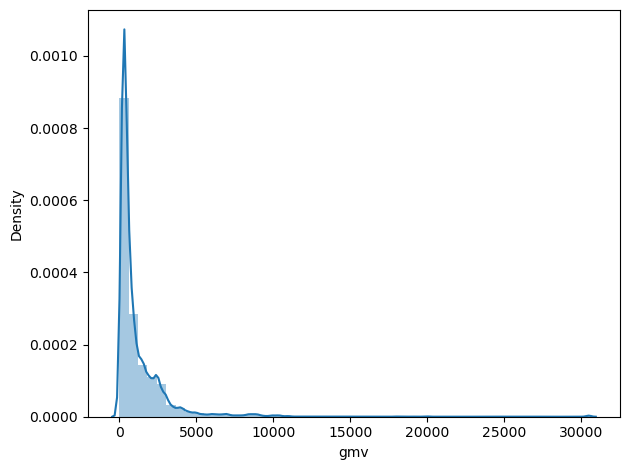

In [167]:
univariate(df_updated['gmv'])

* Revenue mostly distributed around 0 to 5000.

count   512164.00
mean         1.02
std          0.13
min          1.00
25%          1.00
50%          1.00
75%          1.00
max          2.00
Name: units, dtype: float64


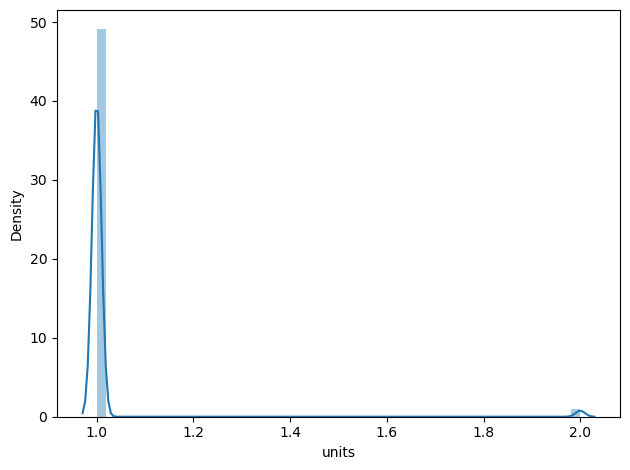

In [168]:
univariate(df_updated['units'])

count   512164.00
mean         1.03
std          2.10
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          8.00
Name: deliverybdays, dtype: float64


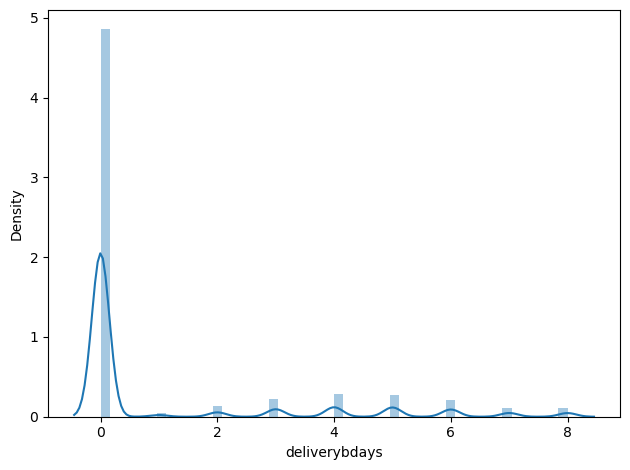

In [169]:
univariate(df_updated['deliverybdays'])

count   512164.00
mean         1.03
std          2.10
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          8.00
Name: deliverybdays, dtype: float64


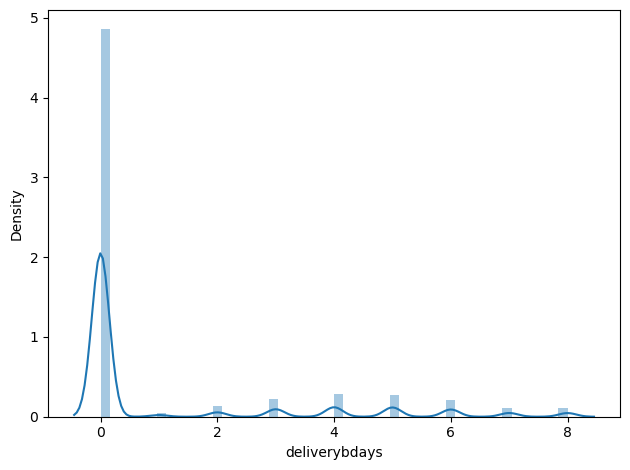

In [170]:
univariate(df_updated['deliverybdays'])

In [171]:
df_updated.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'cust_id',
       'pincode', 'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla',
       'day', 'time', 'day_or_might', 'week', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'Premium_product', 'NPS', 'Stock Index',
       'Sale_date', 'Is_Payday', 'Is_holiday_week'],
      dtype='object')

N       121352
Noon    119874
E       112829
MN       79931
M        48140
EM       30038
Name: day_or_might, dtype: int64


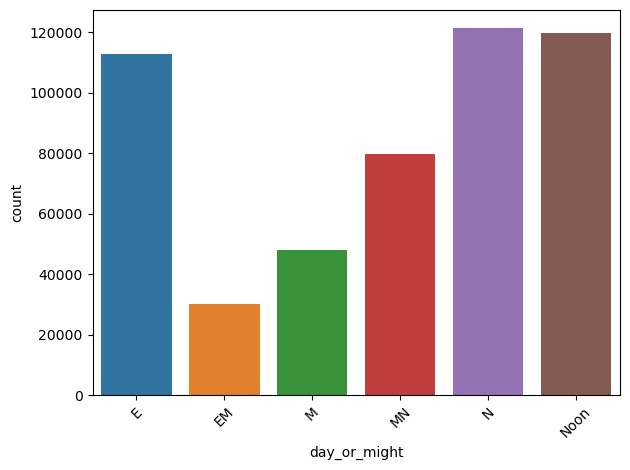

In [172]:
univariate(df_updated['day_or_might'])

* Very less number of customers are active between Midnight to Morning.
* Customers are mostly active from 11AM to 11PM

0    433959
1     78205
Name: Premium_product, dtype: int64


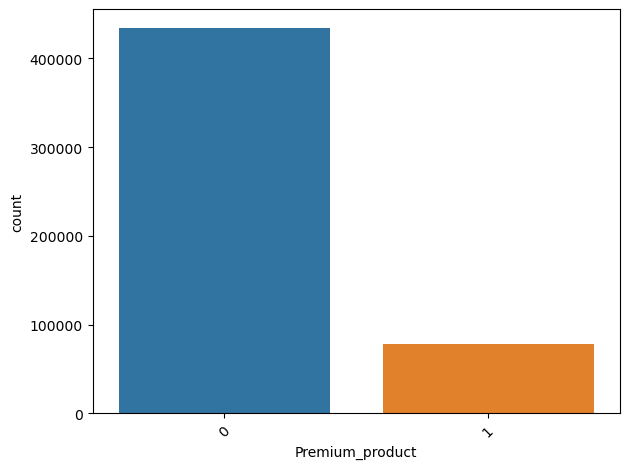

In [173]:
univariate(df_updated['Premium_product'])

count   512164.00
mean         0.22
std          0.41
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          1.00
Name: Is_holiday_week, dtype: float64


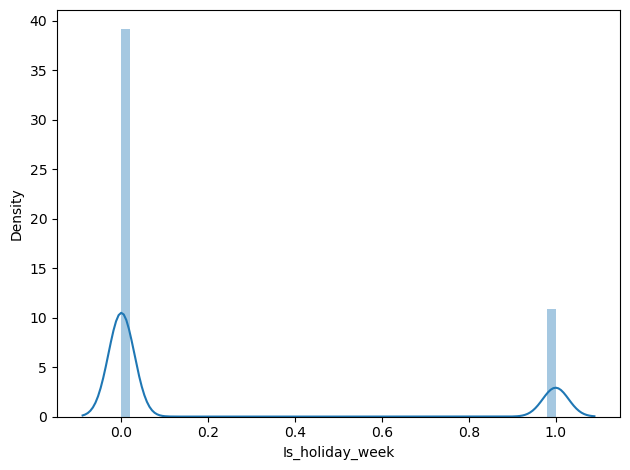

In [174]:
univariate(df_updated['Is_holiday_week'])

In [175]:
univariate(df_updated['order_payment_type_prepaid'])

Invalid variable passed: either pass a numeric variable or a categorical vairable.


cameraaccessory    215609
gamingaccessory    185595
homeaudio          110960
Name: product_analytic_sub_category, dtype: int64


Text(0.5, 1.0, 'Sales')

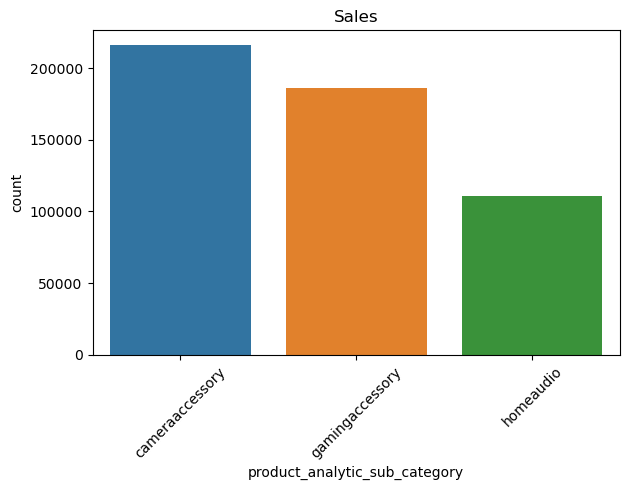

In [176]:
#Checking Top 10 
univariate(df_updated['product_analytic_sub_category'])
plt.title('Sales')

cameraaccessory       215609
gaminghardware        185595
entertainmentsmall    110960
Name: product_analytic_category, dtype: int64


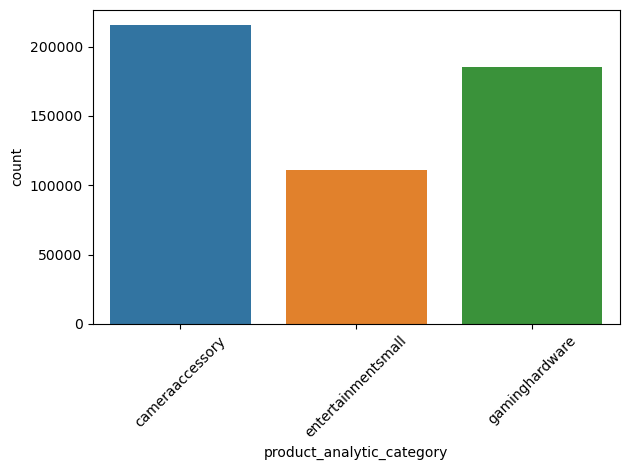

In [177]:
univariate(df_updated['product_analytic_category'])

Wed      87645
Fri      79312
Thurs    72486
Tue      71027
Sat      69187
Sun      66778
Mon      65729
Name: day, dtype: int64


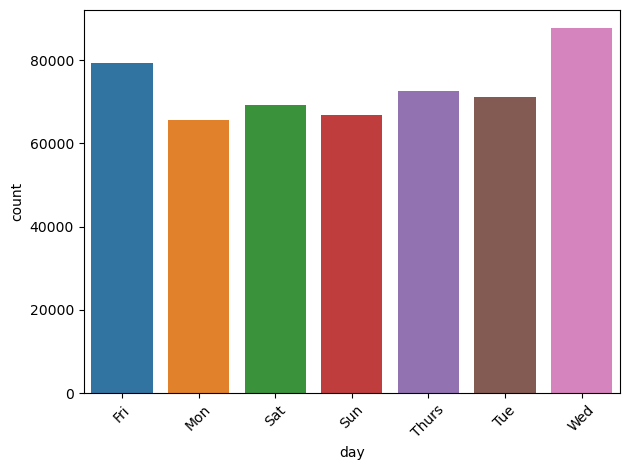

In [178]:
univariate(df_updated['day'])

* Most customer visits are happening on wednesday and Friday rather than on weekends
* This could be alarming as competetors might be very much competitive on weekends with offers.

#### Bivariate Analysis

In [179]:
df_updated.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'cust_id',
       'pincode', 'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla',
       'day', 'time', 'day_or_might', 'week', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'Premium_product', 'NPS', 'Stock Index',
       'Sale_date', 'Is_Payday', 'Is_holiday_week'],
      dtype='object')

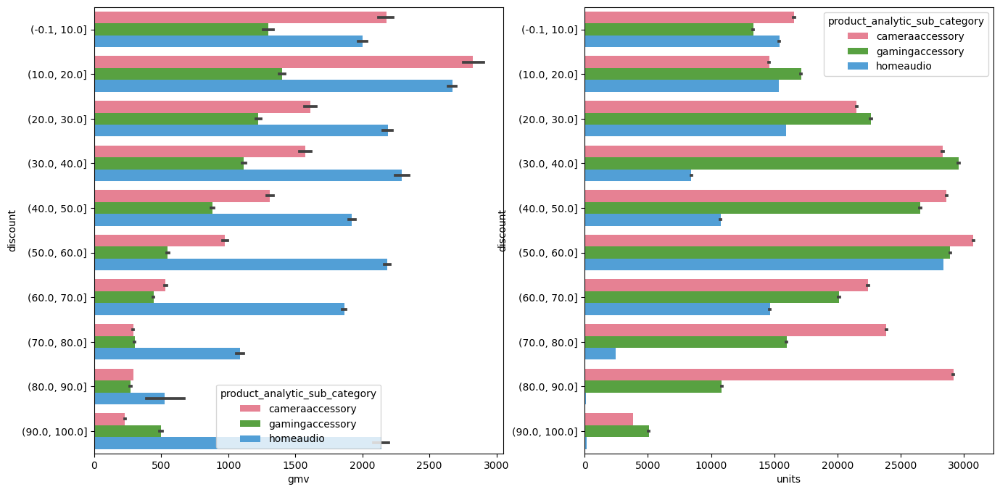

In [180]:
fig, axs = plt.subplots(1,2,figsize=(16,8))

plt1 = sns.barplot(x=df_updated['gmv'], y=pd.cut(df_updated['discount'],10), palette='husl', hue =df_updated['product_analytic_sub_category'], estimator=np.mean,ax = axs[0])

plt2 = sns.barplot(x=df_updated['units'], y=pd.cut(df_updated['discount'],10), palette='husl',hue =df_updated['product_analytic_sub_category'],estimator=np.sum,ax = axs[1])



* All three categories responds similiarly  to the Discount as far as revenue is concerned.
* Average revenue is more when discount% is around 10% to 20% and it gradually decreases for all three categories
* Sales are higher for Camera accesories and Home audio when discount is at 50 to 60 range
* For Gaming accessory sales are higher at 30% to 40%

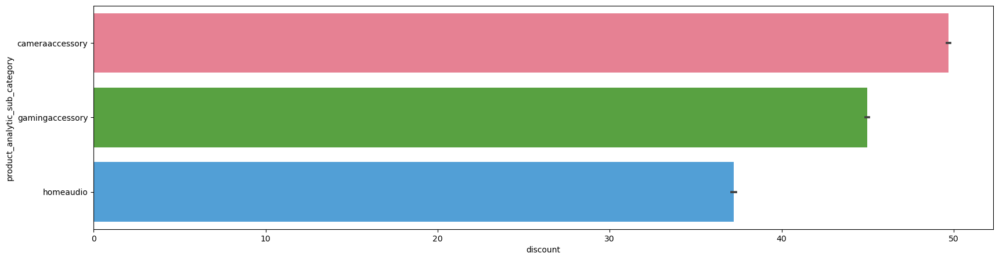

In [181]:
plt.figure(figsize=(20, 5))

sns.barplot(x=df_updated['discount'], y=df_updated['product_analytic_sub_category'], estimator=np.mean,palette='husl')
plt.show()


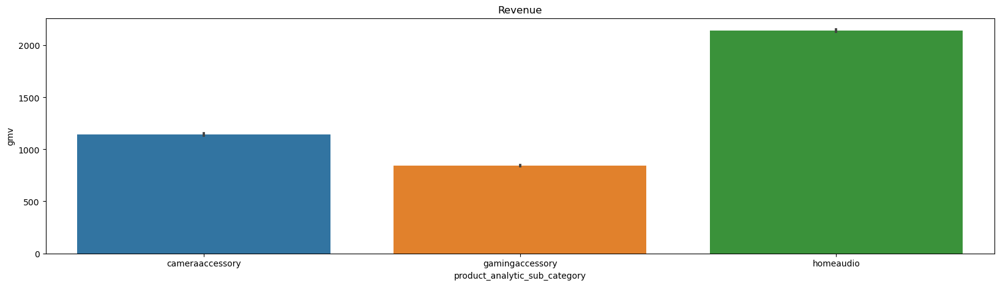

In [182]:
plt.figure(figsize=(20, 5))
sns.barplot(x=df_updated['product_analytic_sub_category'] , y =df_updated['gmv'], estimator=np.mean,dodge = False)
plt.title('Revenue')
plt.show()

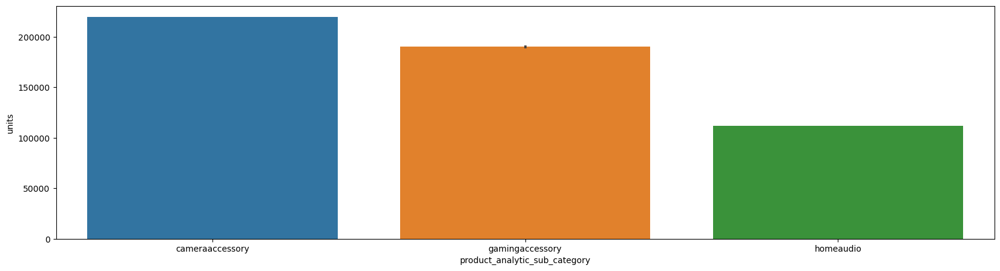

In [183]:
plt.figure(figsize=(20, 5))
sns.barplot(x=df_updated['product_analytic_sub_category'] , y =df_updated['units'], estimator=np.sum,dodge = False)
plt.show()

* Average Revenue is clearly hight for Home audio Category
* At the sametime it is observed that Average discount is given more on Camera accessory products 
* Also Sales are on higher side for Camera accessories where discounts are on higher side

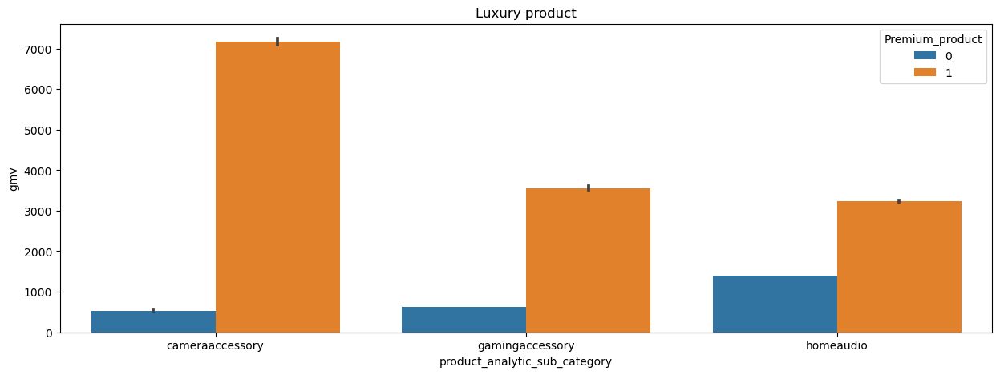

In [184]:
plt.figure(figsize=(15,5))
sns.barplot(x = df_updated.product_analytic_sub_category, y=df_updated.gmv, hue=df_updated.Premium_product)
plt.title('Luxury product')
plt.show()

* Home audio have higher Premium products compared to other categories
* That could be the reason why revenue is more even sales are relatively on lower side
* However it can be observed that most number of products being sold are from Mass product category.

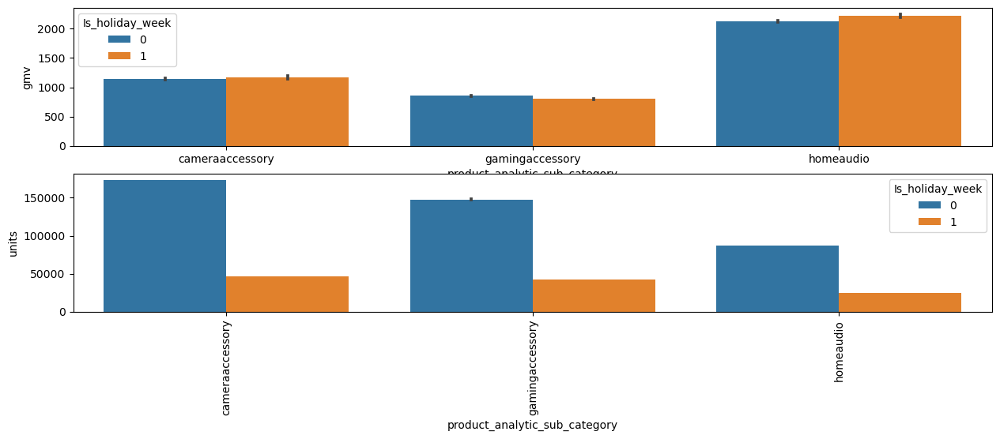

In [185]:

plt.figure(figsize=(15,5))
plt.subplot(2,1,1, frameon = True)
sns.barplot(x = df_updated.product_analytic_sub_category, y=df_updated.gmv, hue = df_updated.Is_holiday_week,estimator=np.mean)

plt.subplot(2,1,2)
sns.barplot(x = df_updated.product_analytic_sub_category, y=df_updated.units, hue = df_updated.Is_holiday_week,estimator=np.sum)
plt.xticks(rotation=90)
plt.show()


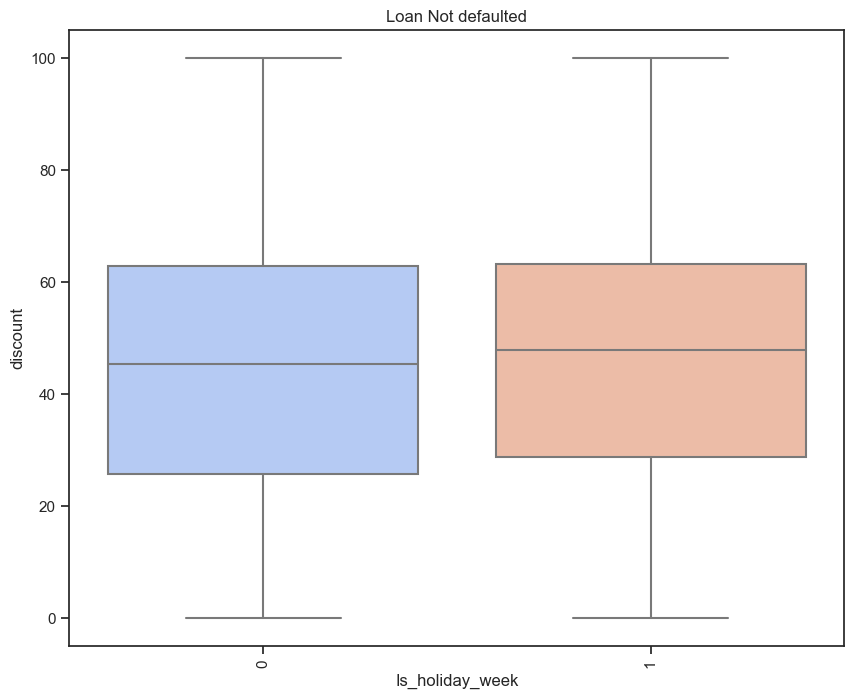

In [186]:
plt.figure(figsize=(10, 8))

sns.set_theme(style="ticks")

sns.boxplot(x='Is_holiday_week', y='discount', palette='coolwarm', data=df_updated)
plt.xticks(rotation = 90)

plt.title('Loan Not defaulted')

plt.show()

* As we have seen in the case of weekdays, even Holidays are not able to contribute much to the revenue
* Even when sales are on higher side  but that does not shown much impact on revenue
* Median of Discount% in Holdays are slighly higher when compared to other days
* Even on the Sale days Median of Discouts are higher but Revenues are not increased much


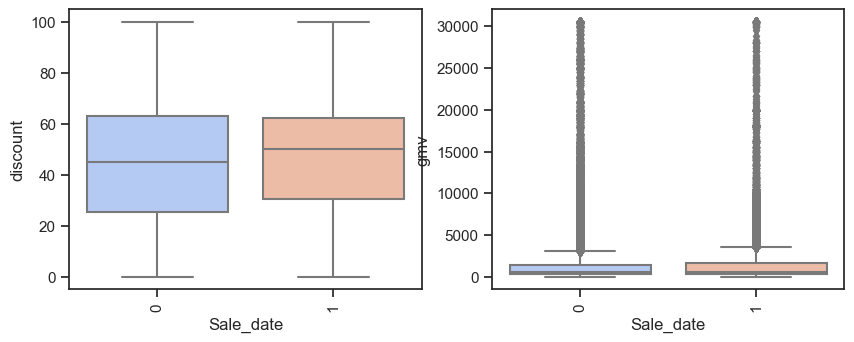

In [187]:
plt.figure(figsize=(10, 8))

sns.set_theme(style="ticks")

plt.subplot(2,2,1, frameon = True)
sns.boxplot(x='Sale_date', y='discount', palette='coolwarm', data=df_updated)
plt.xticks(rotation = 90)

plt.subplot(2,2,2, frameon = True)
sns.boxplot(x='Sale_date', y='gmv', palette='coolwarm', data=df_updated)
plt.xticks(rotation = 90)



plt.show()

In [188]:
df_updated.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'cust_id',
       'pincode', 'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla',
       'day', 'time', 'day_or_might', 'week', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'Premium_product', 'NPS', 'Stock Index',
       'Sale_date', 'Is_Payday', 'Is_holiday_week'],
      dtype='object')

### RollUp Data to weekly level

In [189]:
#again checking the shape of all three Data sets
print('Shape of camera accessory DF:',camera_accessory.shape)
print('Shape of Home Audio DF:',home_audio.shape)
print('Shape of Gaming accessory DF:',gaming_accessory.shape)


Shape of camera accessory DF: (215609, 40)
Shape of Home Audio DF: (110960, 27)
Shape of Gaming accessory DF: (185595, 31)


In [190]:
camera_accessory.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215609 entries, 0 to 1459340
Data columns (total 40 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   gmv                         215609 non-null  float64
 1   units                       215609 non-null  int64  
 2   deliverybdays               215609 non-null  float64
 3   deliverycdays               215609 non-null  float64
 4   sla                         215609 non-null  int64  
 5   product_mrp                 215609 non-null  int64  
 6   product_procurement_sla     215609 non-null  int64  
 7   week                        215609 non-null  int64  
 8   listing_price               215609 non-null  float64
 9   discount                    215609 non-null  float64
 10  order_payment_type_prepaid  215609 non-null  uint8  
 11  Premium_product             215609 non-null  object 
 12  NPS                         215609 non-null  float64
 13  Stock Index  

In [191]:
camera_accessory = camera_accessory.groupby(['week']).agg({'gmv':"sum", 'units':"sum", 'deliverybdays':"mean", 'deliverycdays':"mean", 'sla':"mean", 'product_mrp':"sum",
       'product_procurement_sla':"mean", 'listing_price':"sum", 'discount':"mean",
       'order_payment_type_prepaid':"sum", 'NPS':"mean", 'Stock Index':"mean",
       'Sale_date':"sum", 'Is_Payday':"sum", 'Is_holiday_week':"sum", 'cameraaccessory':"sum",
       'camerabag':"sum", 'camerabattery':"sum", 'camerabatterycharger':"sum",
       'camerabatterygrip':"sum", 'cameraeyecup':"sum", 'camerafilmrolls':"sum", 'camerahousing':"sum",
       'cameraledlight':"sum", 'cameramicrophone':"sum", 'cameramount':"sum",
       'cameraremotecontrol':"sum", 'cameratripod':"sum", 'extensiontube':"sum", 'filter':"sum",
       'flash':"sum", 'flashshoeadapter':"sum", 'lens':"sum", 'reflectorumbrella':"sum", 'softbox':"sum",
       'strap':"sum", 'teleconverter':"sum", 'telescope':"sum"}).reset_index(drop=False)

In [192]:
camera_accessory.head()

,week,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,listing_price,discount,order_payment_type_prepaid,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope
0,1,15731.00,26,0.85,0.88,2.23,36777,2.88,15731.00,50.62,26.00,54.60,1177.00,0,0,0,1,2.00,4.00,2.00,0,0,0,0,0,0,0,1.00,13.00,0,0.00,0.00,0,2.00,0,0,0,0,0
1,2,3866642.00,2956,0.00,0.00,6.96,6953889,2.74,3823989.00,43.81,956.00,54.60,1177.00,0,0,0,46,333.00,690.00,223.00,18,0,0,0,0,0,4,141.00,435.00,0,220.00,26.00,0,489.00,0,0,13,0,16
2,3,4311420.00,3161,0.00,0.00,6.40,7573726,2.76,4262702.00,44.27,1045.00,54.60,1177.00,870,500,0,36,356.00,752.00,225.00,9,0,0,0,0,0,11,142.00,495.00,0,186.00,27.00,0,526.00,0,0,24,0,22
3,4,4243833.00,3132,0.00,0.00,6.41,7509486,2.80,4164761.00,43.51,990.00,54.60,1177.00,0,0,0,48,295.00,773.00,267.00,12,0,0,0,0,0,7,108.00,465.00,0,186.00,31.00,0,573.00,0,0,23,0,30
4,5,2756563.00,2074,0.00,0.00,6.37,4724232,2.78,2719229.00,42.82,608.00,54.60,1177.03,0,0,0,45,185.00,484.00,180.00,11,0,0,0,0,0,2,84.00,360.00,1,109.00,28.00,0,331.00,0,0,23,0,13


In [193]:
camera_accessory.shape

(52, 39)

In [194]:
home_audio.columns

Index(['gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'product_mrp',
       'product_procurement_sla', 'week', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'Premium_product', 'NPS', 'Stock Index',
       'Sale_date', 'Is_Payday', 'Is_holiday_week', 'djcontroller', 'dock',
       'dockingstation', 'fmradio', 'hifisystem', 'homeaudiospeaker',
       'karaokeplayer', 'slingbox', 'soundmixer', 'voicerecorder'],
      dtype='object')

In [195]:
home_audio = home_audio.groupby(['week']).agg({'gmv':"sum", 'units':"sum", 'deliverybdays':"mean", 'deliverycdays':"mean", 'sla':"mean", 'product_mrp':"sum",
       'product_procurement_sla':"mean", 'listing_price':"sum", 'discount':"mean",
       'order_payment_type_prepaid':"sum", 'NPS':"mean", 'Stock Index':"mean",
       'Sale_date':"sum", 'Is_Payday':"sum", 'Is_holiday_week':"sum",'djcontroller':"sum", 'dock':"sum",
       'dockingstation':"sum", 'fmradio':"sum", 'hifisystem':"sum", 'homeaudiospeaker':"sum",
       'karaokeplayer':"sum", 'slingbox':"sum", 'soundmixer':"sum", 'voicerecorder':"sum" }).reset_index(drop=False)

In [196]:
gaming_accessory.columns

Index(['gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'product_mrp',
       'product_procurement_sla', 'week', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'Premium_product', 'NPS', 'Stock Index',
       'Sale_date', 'Is_Payday', 'Is_holiday_week', 'gamecontrolmount',
       'gamepad', 'gamingaccessorykit', 'gamingadapter',
       'gamingchargingstation', 'gamingheadset', 'gamingkeyboard',
       'gamingmemorycard', 'gamingmouse', 'gamingmousepad', 'gamingspeaker',
       'joystickgamingwheel', 'motioncontroller', 'tvoutcableaccessory'],
      dtype='object')

In [197]:
gaming_accessory = gaming_accessory.groupby(['week']).agg({'gmv':"sum", 'units':"sum", 'deliverybdays':"mean", 'deliverycdays':"mean", 'sla':"mean", 'product_mrp':"sum",
       'product_procurement_sla':"mean", 'listing_price':"sum", 'discount':"mean",
       'order_payment_type_prepaid':"sum", 'NPS':"mean", 'Stock Index':"mean",
       'Sale_date':"sum", 'Is_Payday':"sum", 'Is_holiday_week':"sum",'gamecontrolmount':"sum",
       'gamepad':"sum", 'gamingaccessorykit':"sum", 'gamingadapter':"sum",
       'gamingchargingstation':"sum", 'gamingheadset':"sum", 'gamingkeyboard':"sum",
       'gamingmemorycard':"sum", 'gamingmouse':"sum", 'gamingmousepad':"sum", 'gamingspeaker':"sum",
       'joystickgamingwheel':"sum", 'motioncontroller':"sum", 'tvoutcableaccessory':"sum"}).reset_index(drop=False)

In [198]:
print(gaming_accessory.shape)
print(home_audio.shape)

(53, 30)
(50, 26)


In [199]:
home_audio.head()

,week,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,listing_price,discount,order_payment_type_prepaid,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,djcontroller,dock,dockingstation,fmradio,hifisystem,homeaudiospeaker,karaokeplayer,slingbox,soundmixer,voicerecorder
0,1,101627.00,37,0.51,0.51,2.86,171165,3.57,101627.00,36.46,36.00,54.60,1177.00,0,0,0,0,0,0,2.00,0,29.00,0,0,0,1
1,2,4571182.13,2103,0.00,0.00,7.37,7106204,2.86,4549140.00,31.42,508.00,54.60,1177.00,0,0,0,8,33,1,516.00,23,1374.00,0,0,0,63
2,3,5368024.00,2459,0.00,0.00,6.98,8638805,2.75,5336178.00,32.94,576.00,54.60,1177.00,666,340,0,7,50,1,574.00,42,1623.00,0,0,0,69
3,4,4678337.00,2247,0.00,0.00,7.07,7681688,2.86,4651430.00,32.35,472.00,54.60,1177.00,0,0,0,4,56,0,577.00,36,1430.00,0,0,0,46
4,5,3451151.00,1608,0.00,0.00,7.20,5593183,2.73,3434486.00,32.21,355.00,54.60,1177.00,0,0,0,2,43,0,420.00,20,1025.00,0,0,0,44


In [200]:
gaming_accessory.head()

,week,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,listing_price,discount,order_payment_type_prepaid,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,gamecontrolmount,gamepad,gamingaccessorykit,gamingadapter,gamingchargingstation,gamingheadset,gamingkeyboard,gamingmemorycard,gamingmouse,gamingmousepad,gamingspeaker,joystickgamingwheel,motioncontroller,tvoutcableaccessory
0,1,37887.00,30,0.57,0.57,2.93,99724,2.73,37887.00,27.51,30.00,54.60,1177.00,0,0,0,0,16.00,4.00,0,0,4.00,1.00,0.00,4.00,1,0,0,0,0
1,2,2688958.00,2975,0.00,0.00,5.43,5326317,3.15,2601631.00,39.86,750.00,54.60,1177.00,0,0,0,0,930.00,104.00,49,0,206.00,422.00,36.00,955.00,56,0,14,27,79
2,3,2270363.36,2809,0.00,0.00,5.33,4810045,2.65,2225777.00,42.23,635.00,54.60,1177.00,716,317,0,0,1552.00,131.00,45,0,202.00,173.00,36.00,381.00,47,0,14,16,97
3,4,2588844.50,2525,0.00,0.00,5.42,5592563,2.51,2520538.00,36.99,567.00,54.60,1177.00,0,0,0,0,1044.00,165.00,38,0,292.00,188.00,29.00,484.00,68,0,17,21,94
4,5,1900937.00,1815,0.01,0.01,5.67,8500182,2.71,1835516.00,42.72,359.00,54.60,1177.02,0,0,0,0,668.00,101.00,32,0,448.00,84.00,13.00,247.00,37,1,27,14,77


#### Merging Media and Climate Datsets

In [201]:
media_investment.shape

(52, 34)

In [202]:
media_investment = media_investment[['week','Total Investment', 'TV', 'Digital',
       'Sponsorship', 'Content Marketing', 'Online marketing', ' Affiliates',
       'SEM', 'Radio', 'Other', 'TI_adstock', 'TV_adstock', 'Digital_adstock',
       'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Other_adstock',  'TI_SMA3', 'TV_SMA3', 'Digital_SMA3',
       'Sponsorship_SMA3', 'ContentMarketing_SMA3', 'Onlinemarketing_SMA3',
       'Affiliates_SMA3', 'SEM_SMA3', 'Radio_SMA3', 'Other_SMA3']]



In [203]:
camera_accessory = pd.merge(camera_accessory, media_investment, how='left', on='week')
home_audio = pd.merge(home_audio, media_investment, how='left', on='week')
gaming_accessory = pd.merge(gaming_accessory, media_investment, how='left', on='week')

In [204]:
camera_accessory.head()

,week,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,listing_price,discount,order_payment_type_prepaid,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3
0,1,15731.00,26,0.85,0.88,2.23,36777,2.88,15731.00,50.62,26.00,54.60,1177.00,0,0,0,1,2.00,4.00,2.00,0,0,0,0,0,0,0,1.00,13.00,0,0.00,0.00,0,2.00,0,0,0,0,0,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,3866642.00,2956,0.00,0.00,6.96,6953889,2.74,3823989.00,43.81,956.00,54.60,1177.00,0,0,0,46,333.00,690.00,223.00,18,0,0,0,0,0,4,141.00,435.00,0,220.00,26.00,0,489.00,0,0,13,0,16,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,4311420.00,3161,0.00,0.00,6.40,7573726,2.76,4262702.00,44.27,1045.00,54.60,1177.00,870,500,0,36,356.00,752.00,225.00,9,0,0,0,0,0,11,142.00,495.00,0,186.00,27.00,0,526.00,0,0,24,0,22,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
3,4,4243833.00,3132,0.00,0.00,6.41,7509486,2.80,4164761.00,43.51,990.00,54.60,1177.00,0,0,0,48,295.00,773.00,267.00,12,0,0,0,0,0,7,108.00,465.00,0,186.00,31.00,0,573.00,0,0,23,0,30,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00
4,5,2756563.00,2074,0.00,0.00,6.37,4724232,2.78,2719229.00,42.82,608.00,54.60,1177.03,0,0,0,45,185.00,484.00,180.00,11,0,0,0,0,0,2,84.00,360.00,1,109.00,28.00,0,331.00,0,0,23,0,13,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00


In [205]:
camera_accessory = pd.merge(camera_accessory, climate_df, how='left', on='week')
home_audio = pd.merge(home_audio, climate_df, how='left', on='week')
gaming_accessory = pd.merge(gaming_accessory, climate_df, how='left', on='week')

In [206]:
camera_accessory.head()

,week,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,listing_price,discount,order_payment_type_prepaid,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd
0,1,15731.00,26,0.85,0.88,2.23,36777,2.88,15731.00,50.62,26.00,54.60,1177.00,0,0,0,1,2.00,4.00,2.00,0,0,0,0,0,0,0,1.00,13.00,0,0.00,0.00,0,2.00,0,0,0,0,0,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.75,12.25,19.00,0.12,1.12,0.00,0.00,0.00,0.00
1,2,3866642.00,2956,0.00,0.00,6.96,6953889,2.74,3823989.00,43.81,956.00,54.60,1177.00,0,0,0,46,333.00,690.00,223.00,18,0,0,0,0,0,4,141.00,435.00,0,220.00,26.00,0,489.00,0,0,13,0,16,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.83,15.33,20.10,0.28,2.38,4.42,0.00,4.42,0.00
2,3,4311420.00,3161,0.00,0.00,6.40,7573726,2.76,4262702.00,44.27,1045.00,54.60,1177.00,870,500,0,36,356.00,752.00,225.00,9,0,0,0,0,0,11,142.00,495.00,0,186.00,27.00,0,526.00,0,0,24,0,22,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,28.75,17.58,23.18,0.00,5.18,1.40,0.00,1.40,0.00
3,4,4243833.00,3132,0.00,0.00,6.41,7509486,2.80,4164761.00,43.51,990.00,54.60,1177.00,0,0,0,48,295.00,773.00,267.00,12,0,0,0,0,0,7,108.00,465.00,0,186.00,31.00,0,573.00,0,0,23,0,30,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,29.50,16.60,23.06,0.00,5.06,1.08,0.00,1.08,0.00
4,5,2756563.00,2074,0.00,0.00,6.37,4724232,2.78,2719229.00,42.82,608.00,54.60,1177.03,0,0,0,45,185.00,484.00,180.00,11,0,0,0,0,0,2,84.00,360.00,1,109.00,28.00,0,331.00,0,0,23,0,13,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00,31.58,17.50,24.57,0.00,6.57,4.63,0.00,4.63,0.00


In [207]:
#again checking the shape of all three Data sets
print('Shape of camera accessory DF:',camera_accessory.shape)
print('Shape of Home Audio DF:',home_audio.shape)
print('Shape of Gaming accessory DF:',gaming_accessory.shape)

Shape of camera accessory DF: (52, 77)
Shape of Home Audio DF: (50, 64)
Shape of Gaming accessory DF: (53, 68)


In [208]:
camera_accessory

,week,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,listing_price,discount,order_payment_type_prepaid,NPS,Stock Index,Sale_date,Is_Payday,Is_holiday_week,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd
0,1,15731.00,26,0.85,0.88,2.23,36777,2.88,15731.00,50.62,26.00,54.60,1177.00,0,0,0,1,2.00,4.00,2.00,0,0,0,0,0,0,0,1.00,13.00,0,0.00,0.00,0,2.00,0,0,0,0,0,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.75,12.25,19.00,0.12,1.12,0.00,0.00,0.00,0.00
1,2,3866642.00,2956,0.00,0.00,6.96,6953889,2.74,3823989.00,43.81,956.00,54.60,1177.00,0,0,0,46,333.00,690.00,223.00,18,0,0,0,0,0,4,141.00,435.00,0,220.00,26.00,0,489.00,0,0,13,0,16,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.83,15.33,20.10,0.28,2.38,4.42,0.00,4.42,0.00
2,3,4311420.00,3161,0.00,0.00,6.40,7573726,2.76,4262702.00,44.27,1045.00,54.60,1177.00,870,500,0,36,356.00,752.00,225.00,9,0,0,0,0,0,11,142.00,495.00,0,186.00,27.00,0,526.00,0,0,24,0,22,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,28.75,17.58,23.18,0.00,5.18,1.40,0.00,1.40,0.00
3,4,4243833.00,3132,0.00,0.00,6.41,7509486,2.80,4164761.00,43.51,990.00,54.60,1177.00,0,0,0,48,295.00,773.00,267.00,12,0,0,0,0,0,7,108.00,465.00,0,186.00,31.00,0,573.00,0,0,23,0,30,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,29.50,16.60,23.06,0.00,5.06,1.08,0.00,1.08,0.00
4,5,2756563.00,2074,0.00,0.00,6.37,4724232,2.78,2719229.00,42.82,608.00,54.60,1177.03,0,0,0,45,185.00,484.00,180.00,11,0,0,0,0,0,2,84.00,360.00,1,109.00,28.00,0,331.00,0,0,23,0,13,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00,31.58,17.50,24.57,0.00,6.57,4.63,0.00,4.63,0.00
5,6,2198.00,4,0.00,0.00,9.00,2949,4.00,2198.00,12.95,3.00,59.99,1206.00,0,0,4,0,0.00,3.00,0.00,0,0,0,0,0,0,0,0.00,1.00,0,0.00,0.00,0,0.00,0,0,0,0,0,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,2.10,0.02,0.38,0.76,0.00,0.13,0.06,0.75,0.00,0.00,27.25,16.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00
6,7,299.00,1,0.00,0.00,6.00,1990,1.00,299.00,84.97,0.00,59.99,1206.00,1,1,0,0,0.00,0.00,0.00,0,0,0,0,0,0,0,0.00,1.00,0,0.00,0.00,0,0.00,0,0,0,0,0,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,29.62,18.25,23.95,0.00,5.95,2.90,0.00,2.90,0.00
7,9,1190.00,3,0.00,0.00,9.33,1884,2.00,1190.00,40.96,2.00,59.99,1206.00,2,0,0,0,0.00,0.00,0.00,0,0,0,0,0,0,0,0.00,0.00,0,0.00,0.00,0,3.00,0,0,0,0,0,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,24.00,16.50,20.25,0.75,3.00,0.00,0.00,0.00,0.00
8,10,3710220.00,3050,0.00,0.00,6.52,6550955,2.82,3658647.00,43.68,887.00,46.97,1101.36,0,0,0,43,249.00,755.00,174.00,7,0,14,0,0,0,19,124.00,550.00,0,175.00,184.00,0,4

In [209]:
camera_accessory.columns

Index(['week', 'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla',
       'product_mrp', 'product_procurement_sla', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'NPS', 'Stock Index', 'Sale_date',
       'Is_Payday', 'Is_holiday_week', 'cameraaccessory', 'camerabag',
       'camerabattery', 'camerabatterycharger', 'camerabatterygrip',
       'cameraeyecup', 'camerafilmrolls', 'camerahousing', 'cameraledlight',
       'cameramicrophone', 'cameramount', 'cameraremotecontrol',
       'cameratripod', 'extensiontube', 'filter', 'flash', 'flashshoeadapter',
       'lens', 'reflectorumbrella', 'softbox', 'strap', 'teleconverter',
       'telescope', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio',
       'Other', 'TI_adstock', 'TV_adstock', 'Digital_adstock',
       'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',

In [210]:
#Changing payday, holiday amd salaryweeks to categorical columns;

camera_accessory['sale_week'] = camera_accessory['Sale_date'].apply(lambda x: 0 if x> 0 else 1)
camera_accessory['payday_week'] = camera_accessory['Is_Payday'].apply(lambda x: 0 if x> 0 else 1)
camera_accessory['holiday_week'] = camera_accessory['Is_holiday_week'].apply(lambda x: 0 if x> 0 else 1)



home_audio['sale_week'] = home_audio['Sale_date'].apply(lambda x: 0 if x> 0 else 1)
home_audio['payday_week'] = home_audio['Is_Payday'].apply(lambda x: 0 if x> 0 else 1)
home_audio['holiday_week'] = home_audio['Is_holiday_week'].apply(lambda x: 0 if x> 0 else 1)


gaming_accessory['sale_week'] = gaming_accessory['Sale_date'].apply(lambda x: 0 if x> 0 else 1)
gaming_accessory['payday_week'] = gaming_accessory['Is_Payday'].apply(lambda x: 0 if x> 0 else 1)
gaming_accessory['holiday_week'] = gaming_accessory['Is_holiday_week'].apply(lambda x: 0 if x> 0 else 1)

In [211]:
gaming_accessory['sale_week'].value_counts()

1    40
0    13
Name: sale_week, dtype: int64

In [212]:
#Deleting the unwanted rows

camera_accessory.drop('Sale_date',axis = 1, inplace  = True)
camera_accessory.drop('Is_Payday',axis = 1, inplace  = True)
camera_accessory.drop('Is_holiday_week',axis = 1, inplace  = True)

home_audio.drop('Sale_date',axis = 1, inplace  = True)
home_audio.drop('Is_Payday',axis = 1, inplace  = True)
home_audio.drop('Is_holiday_week',axis = 1, inplace  = True)

gaming_accessory.drop('Sale_date',axis = 1, inplace  = True)
gaming_accessory.drop('Is_Payday',axis = 1, inplace  = True)
gaming_accessory.drop('Is_holiday_week',axis = 1, inplace  = True)


gaming_accessory.columns

Index(['week', 'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla',
       'product_mrp', 'product_procurement_sla', 'listing_price', 'discount',
       'order_payment_type_prepaid', 'NPS', 'Stock Index', 'gamecontrolmount',
       'gamepad', 'gamingaccessorykit', 'gamingadapter',
       'gamingchargingstation', 'gamingheadset', 'gamingkeyboard',
       'gamingmemorycard', 'gamingmouse', 'gamingmousepad', 'gamingspeaker',
       'joystickgamingwheel', 'motioncontroller', 'tvoutcableaccessory',
       'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', ' Affiliates', 'SEM', 'Radio', 'Other',
       'TI_adstock', 'TV_adstock', 'Digital_adstock', 'Sponsorship_adstock',
       'Content_Marketing_adstock', 'Online_marketing_adstock',
       'Affiliates_adstock', 'SEM_adstock', 'Other_adstock', 'TI_SMA3',
       'TV_SMA3', 'Digital_SMA3', 'Sponsorship_SMA3', 'ContentMarketing_SMA3',
       'Onlinemarketing_SMA3', 'Affiliates_SMA3', 'SEM_SMA

### Calculating Simple Moving average of Price Columns

In [213]:
#Calculating 3 week Moving average

camera_accessory['listing_price_SMA3'] =  camera_accessory['listing_price'].rolling(3).mean()
home_audio['listing_price_SMA3'] =  camera_accessory['listing_price'].rolling(3).mean()
gaming_accessory['listing_price_SMA3'] =  camera_accessory['listing_price'].rolling(3).mean()

#Calculating reference price Inflation(lets call it RPI)

camera_accessory['RPI'] = (camera_accessory['listing_price']-camera_accessory['listing_price_SMA3'])/camera_accessory['listing_price_SMA3']
home_audio['RPI'] = (home_audio['listing_price']-home_audio['listing_price_SMA3'])/home_audio['listing_price_SMA3']
home_audio['RPI'] = (home_audio['listing_price']-home_audio['listing_price_SMA3'])/home_audio['listing_price_SMA3']



In [214]:
camera_accessory.describe().T

,count,mean,std,min,25%,50%,75%,max
week,52.00,27.37,15.36,1.00,14.75,27.50,40.25,53.00
gmv,52.00,4740843.43,2134077.83,299.00,4243275.00,4826515.50,5315525.50,12833528.98
units,52.00,4225.98,1989.70,1.00,3283.75,4249.50,5373.25,10789.00
deliverybdays,52.00,0.98,1.61,0.00,0.00,0.00,2.10,3.90
deliverycdays,52.00,1.15,1.88,0.00,0.00,0.00,2.45,4.57
sla,52.00,6.18,0.91,2.23,5.86,6.20,6.42,9.33
product_mrp,52.00,8831167.44,4145497.64,1884.00,7547101.50,8850451.50,10674193.25,25341945.00
product_procurement_sla,52.00,2.64,0.37,1.00,2.46,2.67,2.83,4.00
listing_price,52.00,4688980.71,2115691.63,299.00,4196813.75,4775580.50,5268204.50,12713818.00
discount,52.00,48.69,8.29,12.95,44.74,48.16,52.80,84.97


In [215]:
#Checking NUlls in Dataset again

print('NUll Values in Checking nulls in camera_accessory',camera_accessory.isnull().sum().sum())
print('NUll Values in Checking nulls in home_audio',home_audio.isnull().sum().sum())
print('NUll Values in Checking nulls in gaming_accessory',gaming_accessory.isnull().sum().sum())

NUll Values in Checking nulls in camera_accessory 62
NUll Values in Checking nulls in home_audio 62
NUll Values in Checking nulls in gaming_accessory 61


In [216]:
#Now we have null values in the dataset. let us check what are they

round(100*camera_accessory.isnull().sum()/len(camera_accessory),2)

week                         0.00
gmv                          0.00
units                        0.00
deliverybdays                0.00
deliverycdays                0.00
sla                          0.00
product_mrp                  0.00
product_procurement_sla      0.00
listing_price                0.00
discount                     0.00
order_payment_type_prepaid   0.00
NPS                          0.00
Stock Index                  0.00
cameraaccessory              0.00
camerabag                    0.00
camerabattery                0.00
camerabatterycharger         0.00
camerabatterygrip            0.00
cameraeyecup                 0.00
camerafilmrolls              0.00
camerahousing                0.00
cameraledlight               0.00
cameramicrophone             0.00
cameramount                  0.00
cameraremotecontrol          0.00
cameratripod                 0.00
extensiontube                0.00
filter                       0.00
flash                        0.00
flashshoeadapt

In [217]:
#using dropna() function by default axis is '0' which is rows, axis=1 for columns
camera_accessory.dropna(inplace=True)
home_audio.dropna(inplace=True)
gaming_accessory.dropna(inplace=True)

In [218]:
#Checking NUlls in Dataset again

print('NUll Values in Checking nulls in camera_accessory',camera_accessory.isnull().sum().sum())
print('NUll Values in Checking nulls in home_audio',home_audio.isnull().sum().sum())
print('NUll Values in Checking nulls in gaming_accessory',gaming_accessory.isnull().sum().sum())

NUll Values in Checking nulls in camera_accessory 0
NUll Values in Checking nulls in home_audio 0
NUll Values in Checking nulls in gaming_accessory 0


In [219]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(48, 79)
(49, 69)
(46, 66)


#### Continuing EDA

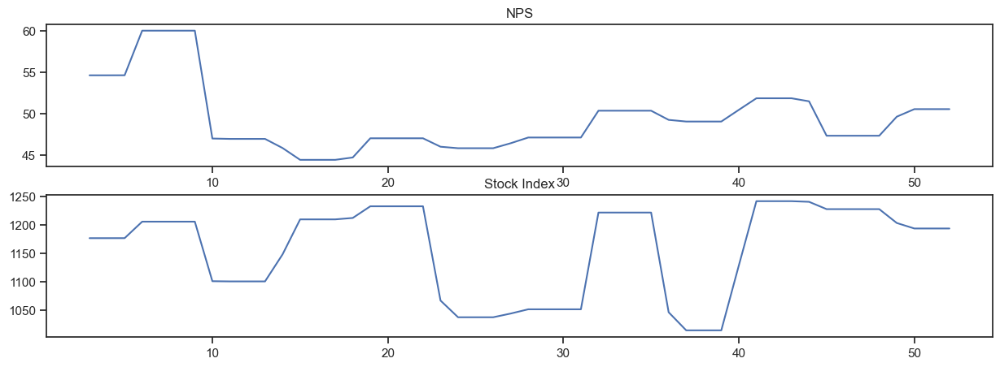

In [220]:


plt.figure(figsize=(15,5))
plt.subplot(2,1,1, frameon = True)
plt.plot(camera_accessory.week, camera_accessory.NPS)
plt.title('NPS')
plt.subplot(2,1,2)
plt.plot(camera_accessory.week, camera_accessory['Stock Index'])
plt.title('Stock Index')
plt.show()



NPS & Stock Index: 
   * NPS, After Seeing its peek in initial weeks, it drops drasticalling in week 9 and 10
   * On the other hand it is observed that Stock index price is volatile and falling drasyically when even there is a drop in NPS

##### Checking affects of Marketing on GMV

In [221]:
adstock_cols = ['TI_adstock', 'TV_adstock',
       'Digital_adstock', 'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Other_adstock']

Text(0.5, 1.0, 'NPS')

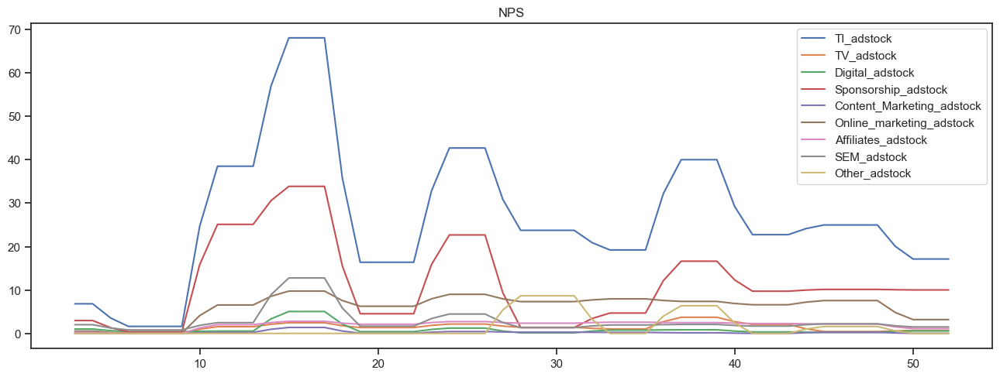

In [222]:

plt.figure(figsize=(16,12))
plt.subplot(2,1,1, frameon = True)
plt.plot(camera_accessory.week, camera_accessory[adstock_cols])
plt.legend(adstock_cols)
plt.title('NPS')

<Figure size 1500x500 with 0 Axes>

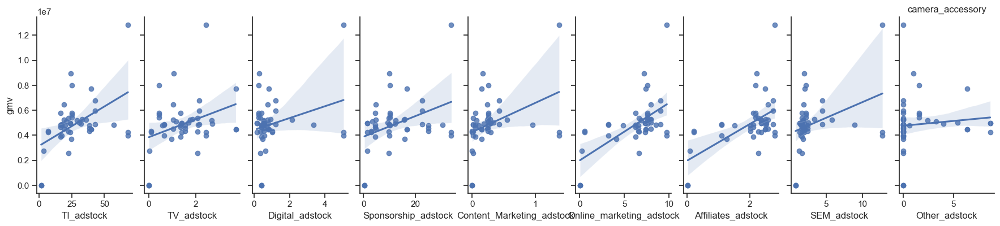

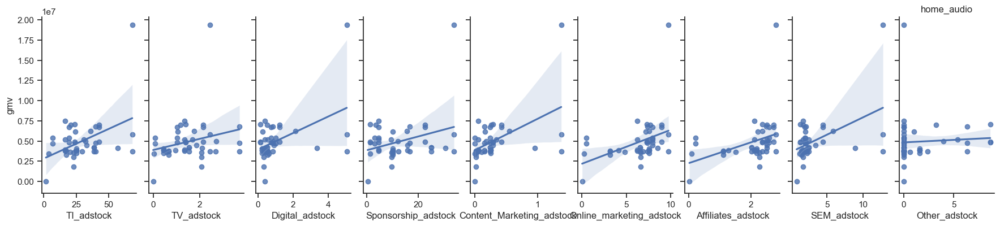

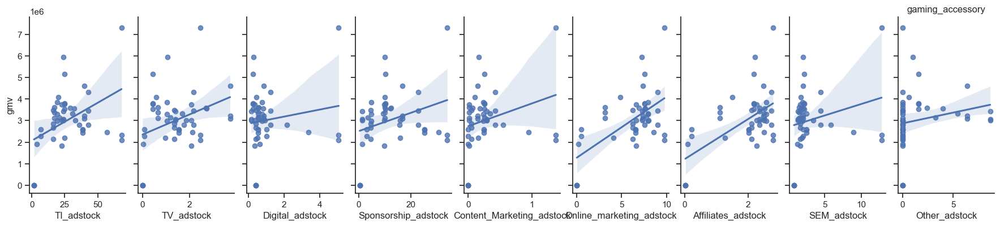

In [223]:
plt.figure(figsize=(15,5))

sns.pairplot(camera_accessory, x_vars=adstock_cols, y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('camera_accessory')

sns.pairplot(home_audio, x_vars=adstock_cols, y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('home_audio')



sns.pairplot(gaming_accessory, x_vars=adstock_cols, y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('gaming_accessory')
plt.show()

* Revenue is responding well to all Media advertisements as we could see steep line for all channels
* But Investment on Advetisemnet seems to be on declined trend can be observed
* Sponsership is the most invested marketig stratergy inclined by eleckart

##### Checking Correlation of all three datasets

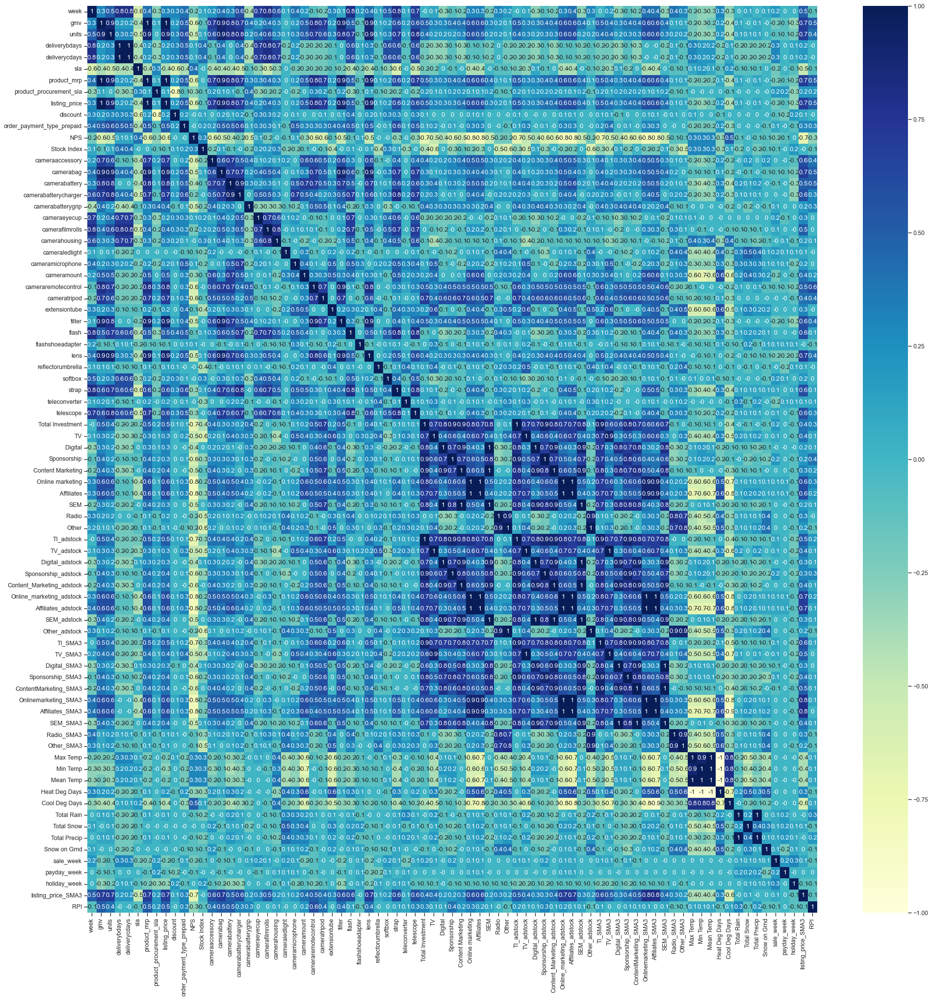

In [224]:
# Correlation of Camera accesory DS

plt.figure(figsize = [30,30], dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.heatmap(round(camera_accessory.corr(),1), annot = True, cmap="YlGnBu")
plt.show()

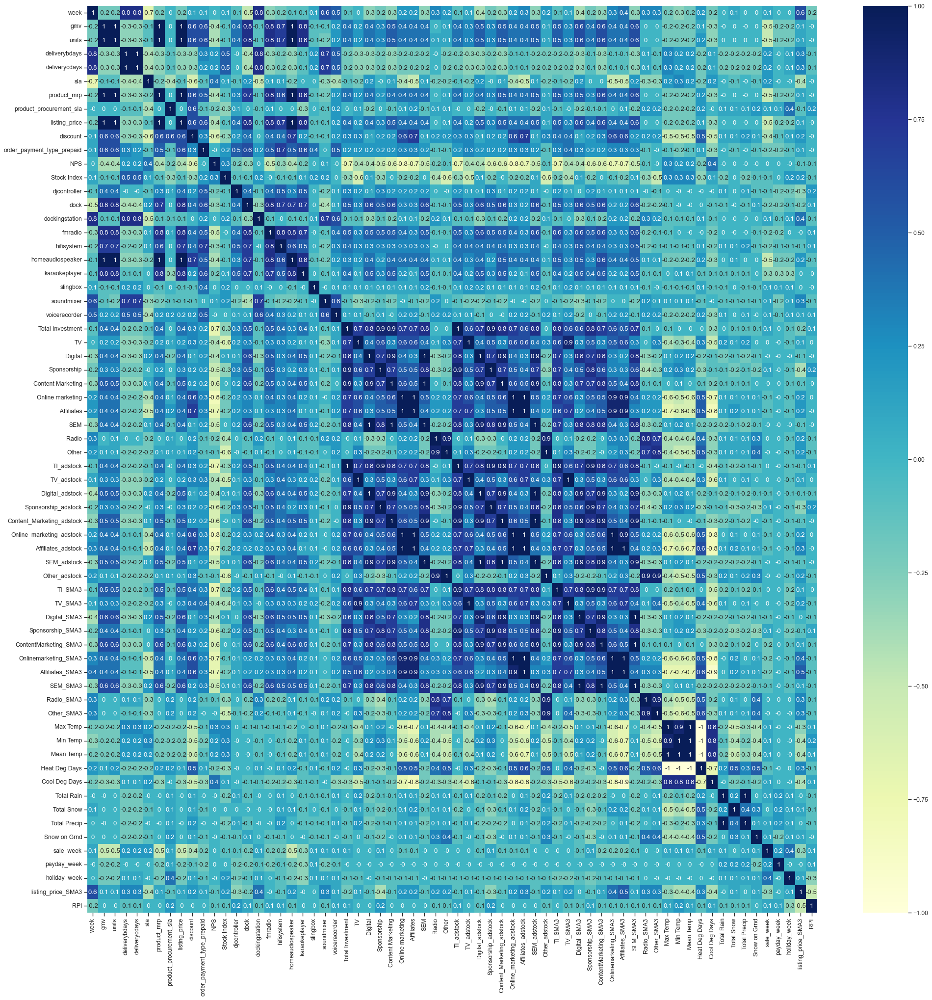

In [225]:
# Checking corrlation for home_audio
plt.figure(figsize = [30,30], dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.heatmap(round(home_audio.corr(),1), annot = True, cmap="YlGnBu")
plt.show()

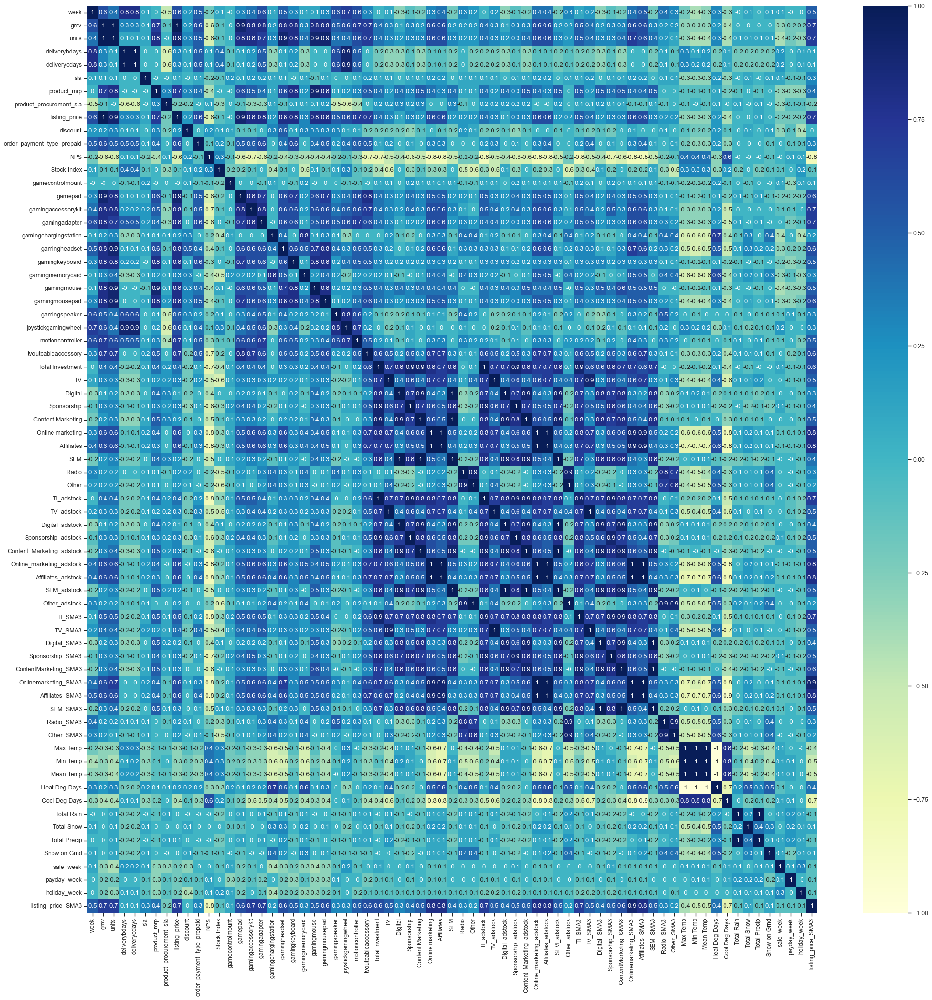

In [226]:
# Checking corrlation for gaming_accessory

plt.figure(figsize = [30,30], dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.heatmap(round(gaming_accessory.corr(),1), annot = True, cmap="YlGnBu")
plt.show()

* There is Multicollenearity observed in all three datasets.
* Let us remove columns which are correlated using modelling techniques
* Also before Building a model let us drop list price, product mrp and units col from the datasets as we know that increase of these valuses willdefinitely inpact on revenue

In [227]:
del_cols = ['units','product_mrp','listing_price']

camera_accessory.drop(del_cols,axis =1,inplace  = True)
home_audio.drop(del_cols,axis =1,inplace  = True)
gaming_accessory.drop(del_cols,axis =1,inplace  = True)

### Modelling

-- Let us build three Models for all three datsets.
   * Linear Model (Additive Model)
   * Multiplicative Model
   * Distributed Lag Model


###### Scaling the datsets

In [228]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(48, 76)
(49, 66)
(46, 63)


In [229]:
#Let isdrop few columns which are not needed for Modelling.

camera_accessory.drop('week',axis = 1, inplace  = True)
home_audio.drop('week',axis = 1, inplace  = True)
gaming_accessory.drop('week',axis = 1, inplace  = True)

In [230]:
camera_accessory.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48 entries, 2 to 50
Data columns (total 75 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   gmv                         48 non-null     float64
 1   deliverybdays               48 non-null     float64
 2   deliverycdays               48 non-null     float64
 3   sla                         48 non-null     float64
 4   product_procurement_sla     48 non-null     float64
 5   discount                    48 non-null     float64
 6   order_payment_type_prepaid  48 non-null     float64
 7   NPS                         48 non-null     float64
 8   Stock Index                 48 non-null     float64
 9   cameraaccessory             48 non-null     uint8  
 10  camerabag                   48 non-null     float64
 11  camerabattery               48 non-null     float64
 12  camerabatterycharger        48 non-null     float64
 13  camerabatterygrip           48 non-nu

In [231]:
from sklearn.model_selection import train_test_split

In [232]:
#Split Datasets to test and train data

train_camera, test_Camera = train_test_split(camera_accessory, test_size=0.3, random_state=42)
train_home, test_home = train_test_split(home_audio, test_size=0.3, random_state=42)
train_gaming, test_gaming = train_test_split(gaming_accessory, test_size=0.3, random_state=42)

In [233]:
print('shape of train_camera',train_camera.shape)
print('shape of train_home',train_home.shape)
print('shape of train_gaming',train_gaming.shape)

print('shape of test_Camera',test_Camera.shape)
print('shape of test_home',test_home.shape)
print('shape of test_gaming',test_gaming.shape)

shape of train_camera (33, 75)
shape of train_home (32, 62)
shape of train_gaming (34, 65)
shape of test_Camera (15, 75)
shape of test_home (14, 62)
shape of test_gaming (15, 65)


### Building Model -  camera_accessory

In [234]:
X_train_camera = train_camera.drop('gmv', axis=1)
y_train_camera = train_camera['gmv']
X_test_Camera = test_Camera.drop('gmv', axis=1)
y_test_camera = test_Camera['gmv']

In [235]:
X_train_camera.describe()

,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
count,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00
mean,0.96,1.13,6.20,2.63,48.31,1222.82,49.00,1163.88,40.42,299.67,708.45,293.61,7.00,1.91,37.00,0.30,0.03,1.18,20.36,109.33,624.39,1.48,214.00,861.18,0.06,611.00,0.03,0.24,31.73,0.03,32.03,16.97,0.93,0.64,7.65,0.16,3.84,1.23,1.89,0.05,0.59,27.73,1.49,1.04,12.69,0.26,6.24,1.99,3.09,0.86,17.41,0.91,0.65,7.96,0.17,3.92,1.24,1.94,0.05,0.56,17.21,6.71,11.98,7.31,1.29,2.85,0.35,3.20,0.33,0.73,0.82,0.82,4898122.41,-0.02
std,1.61,1.88,0.70,0.23,4.39,875.35,3.47,77.47,13.39,81.18,251.02,142.51,4.23,2.91,29.66,0.68,0.17,2.16,15.40,33.11,381.05,1.75,58.42,688.88,0.24,187.39,0.17,0.50,10.64,0.17,14.58,10.98,0.65,0.83,6.26,0.24,1.77,0.53,2.03,0.12,1.45,16.53,0.99,1.19,9.46,0.35,2.77,0.83,2.95,1.88,9.54,0.59,0.67,5.52,0.20,1.68,0.51,1.66,0.08,1.00,9.09,7.92,8.39,6.89,2.06,3.70,0.87,3.95,0.82,0.45,0.39,0.39,1333793.91,0.23
min,0.00,0.00,4.78,2.00,40.96,2.00,44.40,1015.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,0.00,1.01,0.00,0.09,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.25,0.34,0.00,0.04,0.02,0.80,0.00,1.01,0.00,0.15,0.21,0.00,0.03,0.01,0.50,0.00,0.00,-2.83,-11.67,-7.27,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1229.00,-0.39
25%,0.00,0.00,5.90,2.46,44.78,869.00,46.93,1101.00,36.00,278.00,598.00,213.00,4.00,0.00,21.00,0.00,0.00,0.00,11.00,91.00,465.00,0.00,187.00,204.00,0.00,526.00,0.00,0.00,24.00,0.00,22.00,10.24,0.42,0.26,2.83,0.01,3.91,1.26,1.04,0.00,0.00,17.13,0.67,0.41,4.69,0.02,6.26,2.02,1.67,0.00,10.71,0.42,0.29,2.93,0.03,3.82,1.14,1.08,0.00,0.00,11.75,2.50,6.08,0.75,0.00,0.15,0.00,0.30,0.00,0.00,1.00,1.00,4487889.67,-0.18
50%,0.00,0.00,6.16,2.68,48.02,1030.00,49.02,1194.00,44.00,305.00,676.00,239.00,6.00,1.00,32.00,0.00,0.00,0.00,17.00,114.00,598.00,1.00,216.00,716.00,0.00,594.00,0.00,0.00,30.00,0.00,30.00,14.21,0.84,0.36,6.26,0.09,4.13,1.36,1.22,0.00,0.00,22.74,1.35,0.57,10.02,0.15,6.89,2.28,2.01,0.00,15.61,0.84,0.48,6.34,0.11,4.61,1.42,1.25,0.00,0.00,17.25,6.00,12.40,5.60,0.00,1.10,0.00,1.72,0.00,1.00,1.00,1.00,5042884.00,-0.05
75%,1.70,1.98,6.40,2.80,52.46,1159.00,50.52,1222.00,46.00,335.00,773.00,343.00,10.00,3.00,41.00,0.00,0.00,1.00,27.00,132.00,745.00,3.00,243.00,1446.00,0.00,695.00,0.00,0.00,41.00,0.00,44.00,25.01,1.35,0.53,10.40,0.16,4.97,1.62,1.38,0.00,0.00,38.50,2.16,1.01,16.64,0.25,7.96,2.52,2.48,0.00,22.74,1.31,0.63,10.40,0.19,4.97,1.58,2.14,0.07,1.00,24.00,14.12,20.00,11.93,2.52,4.20,0.00,4.25,0.00,1.00,1.00,1.00,5505226.33,0.09
max,3.90,4.57,9.33,3.06,57.78,5219.00,59.99,1242.00,74.00,454.00,1490.00,675.00,17.00,12.00,126.00,2.00,1.00,7.00,65.00,167.00,

#### Feature Scaling - camera_accessory

In [236]:
from sklearn.preprocessing import StandardScaler

scaler  = StandardScaler()


In [237]:
scale_cols = X_train_camera.columns

X_train_camera[scale_cols] = scaler.fit_transform(X_train_camera[scale_cols])
X_test_Camera[scale_cols] = scaler.transform(X_test_Camera[scale_cols])

In [238]:
#Checking if data is scaled corretly
X_train_camera.describe()

,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
count,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00
mean,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00
std,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02,1.02
min,-0.61,-0.61,-2.07,-2.82,-1.70,-1.42,-1.35,-1.95,-3.07,-3.75,-2.87,-2.09,-1.68,-0.67,-1.27,-0.45,-0.18,-0.56,-1.34,-3.35,-1.66,-0.86,-3.72,-1.27,-0.25,-3.29,-0.18,-0.49,-3.03,-0.18,-2.23,-1.48,-1.47,-0.67,-1.21,-0.66,-2.19,-2.32,-0.69,-0.42,-0.41,-1.60,-1.53,-0.67,-1.33,-0.74,-2.28,-2.39,-0.79,-0.46,-1.75,-1.56,-0.76,-1.43,-0.85,-2.35,-2.44,-0.88,-0.65,-0.57,-2.24,-2.36,-2.33,-1.08,-0.64,-0.78,-0.41,-0.82,-0.40,-1.63,-2.12,-2.12,-3.73,-1.63
25%,-0.61,-0.61,-0.44,-0.75,-0.82,-0.41,-0.61,-0.82,-0.34,-0.27,-0.45,-0.57,-0.72,-0.67,-0.55,-0.45,-0.18,-0.56,-0.62,-0.56,-0.42,-0.86,-0.47,-0.97,-0.25,-0.46,-0.18,-0.49,-0.74,-0.18,-0.70,-0.62,-0.82,-0.47,-0.78,-0.61,0.04,0.06,-0.42,-0.42,-0.41,-0.65,-0.85,-0.54,-0.86,-0.69,0.01,0.04,-0.49,-0.46,-0.71,-0.85,-0.55,-0.93,-0.68,-0.06,-0.21,-0.53,-0.65,-0.57,-0.61,-0.54,-0.72,-0.97,-0.64,-0.74,-0.41,-0.75,-0.40,-1.63,0.47,0.47,-0.31,-0.70
50%,-0.61,-0.61,-0.05,0.20,-0.07,-0.22,0.01,0.39,0.27,0.07,-0.13,-0.39,-0.24,-0.32,-0.17,-0.45,-0.18,-0.56,-0.22,0.14,-0.07,-0.28,0.03,-0.21,-0.25,-0.09,-0.18,-0.49,-0.16,-0.18,-0.14,-0.26,-0.14,-0.34,-0.23,-0.27,0.16,0.25,-0.33,-0.42,-0.41,-0.31,-0.15,-0.40,-0.29,-0.32,0.24,0.36,-0.37,-0.46,-0.19,-0.12,-0.26,-0.30,-0.28,0.42,0.36,-0.43,-0.65,-0.57,0.00,-0.09,0.05,-0.25,-0.64,-0.48,-0.41,-0.38,-0.40,0.61,0.47,0.47,0.11,-0.15
75%,0.46,0.46,0.28,0.73,0.96,-0.07,0.45,0.76,0.42,0.44,0.26,0.35,0.72,0.38,0.14,-0.45,-0.18,-0.09,0.44,0.70,0.32,0.88,0.50,0.86,-0.25,0.46,-0.18,-0.49,0.88,-0.18,0.83,0.74,0.65,-0.14,0.45,0.01,0.65,0.74,-0.25,-0.42,-0.41,0.66,0.68,-0.02,0.42,-0.02,0.63,0.66,-0.21,-0.46,0.57,0.67,-0.03,0.45,0.12,0.64,0.68,0.12,0.29,0.44,0.76,0.95,0.97,0.68,0.61,0.37,-0.41,0.27,-0.40,0.61,0.47,0.47,0.46,0.45
max,1.85,1.85,4.56,1.88,2.19,4.64,3.22,1.02,2.55,1.93,3.16,2.72,2.40,3.52,3.05,2.52,5.66

In [239]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

Let us built simple Linear regression model on cmplete datsset and check before Feature selection

In [240]:
lr  = LinearRegression()

In [241]:
lr.fit(X_train_camera,y_train_camera)

#Predicting Vars
y_train_pred_camera = lr.predict(X_train_camera)
y_test_pred_camera = lr.predict(X_test_Camera)

In [242]:
print('r2 score of train data',r2_score(y_true= y_train_camera, y_pred = y_train_pred_camera))
print('r2 score of test data',r2_score(y_true= y_test_camera, y_pred = y_test_pred_camera))

r2 score of train data 1.0
r2 score of test data 0.859717164288491


* R2 score seems to be under fitting on Data
* Let us use Feature selection technique to build a model

-- Let us use RFE for feature selection

###  Feature Elimination using - RFE

In [243]:
from sklearn.feature_selection import RFE

In [244]:
lr = LinearRegression()

In [245]:
rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_camera, y_train_camera)

RFE(estimator=LinearRegression(), n_features_to_select=10)

In [246]:
rfe.ranking_

array([43, 15,  3, 63, 53, 24, 21,  1, 16, 19, 27,  1,  6,  8, 25,  1, 20,
       52, 22,  7, 18, 35, 61, 26,  1,  1,  5, 17,  1, 13,  9, 60, 47, 41,
       54, 38, 11, 36, 39, 49, 14, 30, 56, 58, 12, 33, 31, 55, 29, 48, 51,
       59, 57, 44, 28, 50, 64, 32, 10,  1, 34, 42, 62, 37,  2, 45, 46, 23,
       65,  4,  1, 40,  1,  1])

In [247]:
X_train_camera.columns[rfe.support_]

Index(['Stock Index', 'camerabatterycharger', 'camerahousing',
       'flashshoeadapter', 'lens', 'strap', 'Other_SMA3', 'payday_week',
       'listing_price_SMA3', 'RPI'],
      dtype='object')

* Top 10 Features Supported by RFE are 
       'product_mrp', 'listing_price', 'camerabag', 'camerabatterycharger',
       'cameraledlight', 'Online marketing', 'Content_Marketing_adstock',
       'SEM_adstock', 'Radio_SMA3', 'Max Temp']
      

* Let us try RFECV for Feature elimination

In [248]:
from sklearn.feature_selection import RFECV

In [249]:
lr  = LinearRegression()
rfecv = RFECV(estimator=lr, cv=4)

In [250]:
%%time
rfecv.fit(X_train_camera, y_train_camera)

CPU times: total: 1.31 s
Wall time: 636 ms


RFECV(cv=4, estimator=LinearRegression())

In [251]:

rfecv.ranking_

array([ 6,  1,  1, 26, 16,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
       15,  1,  1,  1,  1, 24,  1,  1,  1,  1,  1,  1,  1,  1, 23, 10,  4,
       17,  1,  1,  1,  2, 12,  1,  1, 19, 21,  1,  1,  1, 18,  1, 11, 14,
       22, 20,  7,  1, 13, 27,  1,  1,  1,  1,  5, 25,  1,  1,  8,  9,  1,
       28,  1,  1,  3,  1,  1])

In [252]:
rfecv.grid_scores_

array([[ 0.06653802,  0.69119647,  0.45259196, -0.03712834],
       [ 0.32105032,  0.76711331,  0.9453808 ,  0.75032245],
       [ 0.54041776,  0.85607774,  0.94483472,  0.78591951],
       [ 0.62048589,  0.83621429,  0.85534851,  0.83959128],
       [ 0.6313886 ,  0.81986812,  0.87418383,  0.83210172],
       [ 0.61207487,  0.86577482,  0.86953322,  0.85342503],
       [ 0.44472716,  0.78798458,  0.86547339,  0.80325752],
       [ 0.5608009 ,  0.79953745,  0.87714825,  0.79940156],
       [ 0.61822002,  0.82199317,  0.86149914,  0.75032118],
       [ 0.67714618,  0.81610406,  0.81915338,  0.75032118],
       [ 0.64052821,  0.82704198,  0.74435624,  0.77925077],
       [ 0.69625918,  0.76458695,  0.64484295,  0.81027048],
       [ 0.74661985,  0.76428836,  0.4649797 ,  0.81151826],
       [ 0.7624358 ,  0.74756484,  0.42729322,  0.80730814],
       [ 0.72002043,  0.80823937,  0.43479896,  0.80809332],
       [ 0.73503695,  0.81772186,  0.43479896,  0.81599578],
       [ 0.72016835,  0.

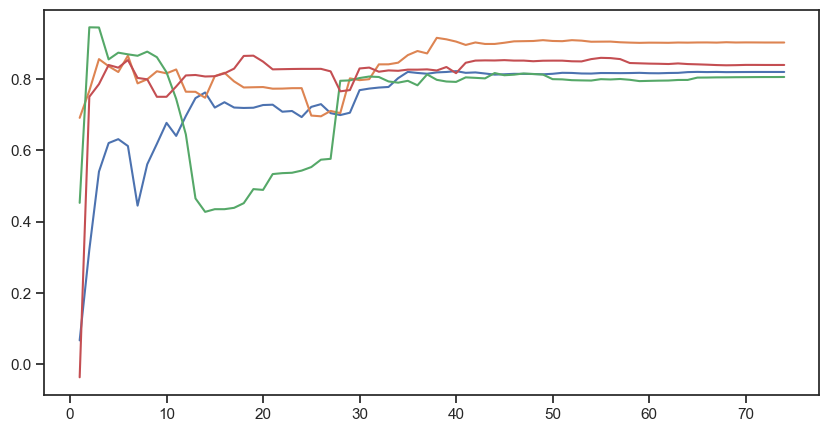

In [253]:
plt.figure(figsize=[10, 5])
plt.plot(range(1, X_train_camera.shape[1]+1), rfecv.grid_scores_)
plt.show()

In [254]:
rfecv.n_features_

47

* Features selected by RFECv are 47, 
* Let us use 10 columns we selected with RFE and check the model again

In [255]:
rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_camera, y_train_camera)

RFE(estimator=LinearRegression(), n_features_to_select=10)

In [256]:
col = X_train_camera.columns[rfe.support_]
X_train1 =X_train_camera[col]
X_test1 = X_test_Camera[col]

In [257]:
X_test1.head()

,Stock Index,camerabatterycharger,camerahousing,flashshoeadapter,lens,strap,Other_SMA3,payday_week,listing_price_SMA3,RPI
30,0.76,-0.30,-0.45,-0.25,-0.11,0.50,3.09,0.47,0.53,-0.36
43,0.84,0.83,1.03,-0.25,0.73,1.46,0.10,0.47,0.59,0.01
29,-1.47,-0.49,-0.45,-0.25,0.07,0.03,4.92,0.47,0.32,-0.23
46,0.84,1.08,6.97,-0.25,2.88,1.55,0.44,0.47,1.10,1.18
26,-1.47,-0.23,-0.45,-0.25,0.12,-0.55,3.09,0.47,0.48,-0.41


In [258]:
def model(X,y):
    X = sm.add_constant(X) #Adding the constant
    lm = sm.OLS(y,X).fit() # fitting the model
    print(lm.summary()) # model summary
    return X
    
def VIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [259]:
X_train_lm = model(X_train1,y_train_camera)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     86.21
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           2.82e-15
Time:                        23:19:39   Log-Likelihood:                -450.43
No. Observations:                  33   AIC:                             922.9
Df Residuals:                      22   BIC:                             939.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 4.748e+06 

In [260]:
VIF(X_train_lm)

,Features,VIF
9,listing_price_SMA3,14.43
5,lens,11.57
10,RPI,6.18
6,strap,5.74
3,camerahousing,4.97
7,Other_SMA3,4.06
2,camerabatterycharger,3.21
4,flashshoeadapter,1.96
1,Stock Index,1.95
8,payday_week,1.61


In [261]:
# Removing listing_price_SMA3 as it has hight p val and VIF

X = X_train1.drop('listing_price_SMA3',axis =1)

In [262]:
X_train_lm = model(X,y_train_camera)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     90.86
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           7.98e-16
Time:                        23:19:39   Log-Likelihood:                -451.99
No. Observations:                  33   AIC:                             924.0
Df Residuals:                      23   BIC:                             939.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 4.748e+06 

In [263]:
VIF(X_train_lm)

,Features,VIF
6,strap,4.37
7,Other_SMA3,3.19
5,lens,3.07
2,camerabatterycharger,2.63
1,Stock Index,1.77
3,camerahousing,1.73
4,flashshoeadapter,1.60
9,RPI,1.38
8,payday_week,1.34
0,const,1.00


-- Now both P values and VIF are in control

### Residual Analysis

In [264]:
Linear_model1 = LinearRegression()
Linear_model1.fit(X_train1,y_train_camera)


y_train_pred = Linear_model1.predict(X_train1)



Text(0.5, 0, 'Errors')

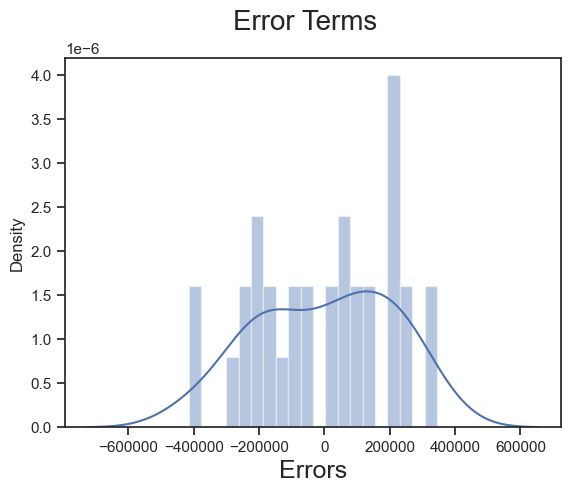

In [265]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train_camera - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

* Distribution of error terms is centered around 0 and is normal
* The assumption on the linear modeling can to be fulfilled.

#### Making Predictions Using the Final Model

Now that we have fitted the model and checked the normality of error terms, it's time to go ahead and make predictions using the final, i.e. fourth model.

In [266]:
# x_test1 = X_test_Camera[num_vars]
# x_test1

In [267]:
# X_test1 = sm.add_constant(X_test1, has_constant='add')


In [268]:
y_test_pred = Linear_model1.predict(X_test1)

Text(0, 0.5, 'y_pred')

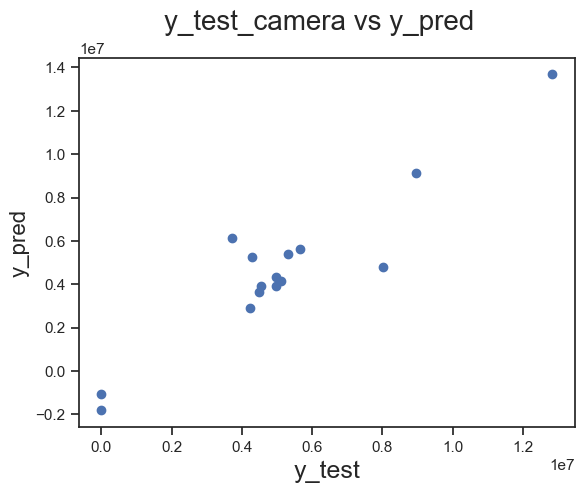

In [269]:
fig = plt.figure()
plt.scatter(y_test_camera, y_test_pred)
fig.suptitle('y_test_camera vs y_pred', fontsize = 20)              
plt.xlabel('y_test', fontsize = 18)                      
plt.ylabel('y_pred', fontsize = 16)   

In [270]:
r2_score(y_true= y_test_camera, y_pred = y_test_pred)

0.8014843753292288

In [271]:
print('r2 score of train data',r2_score(y_true= y_train_camera, y_pred = y_train_pred))
print('Mean squared error on train data:',mean_squared_error(y_train_camera,y_train_pred))
print('r2 score of test data',r2_score(y_true= y_test_camera, y_pred = y_test_pred))
print('Mean squared error on Test data:',mean_squared_error(y_test_camera,y_test_pred))

r2 score of train data 0.9751149715897107
Mean squared error on train data: 42000686302.0642
r2 score of test data 0.8014843753292288
Mean squared error on Test data: 1844713086889.0903


In [272]:
cross_val_score(Linear_model1, X_train1, y_train_camera, cv=5, n_jobs=-1, scoring="r2")

array([0.79999875, 0.97434391, 0.75028778, 0.92741475, 0.84470312])

In [273]:


model_1= LinearRegression().fit(X_train_lm, y_train_camera)

coef = pd.DataFrame(X_train_lm.columns)
coef['Coefficient'] = pd.Series(model_1.coef_)
coef


,0,Coefficient
0,const,0.00
1,Stock Index,-179994.27
2,camerabatterycharger,330506.06
3,camerahousing,-646189.52
4,flashshoeadapter,-204997.61
5,lens,1011289.12
6,strap,400820.82
7,Other_SMA3,-331791.43
8,payday_week,224718.04
9,RPI,203289.58


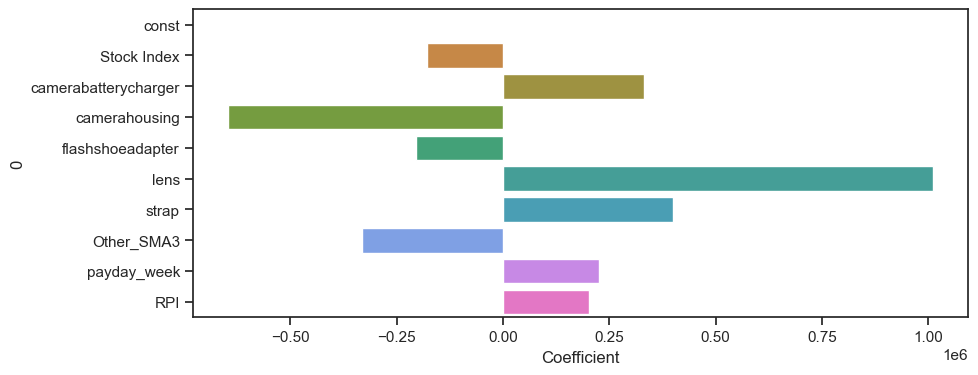

In [274]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 4))
sns.barplot(y=coef[0], x=coef['Coefficient'], palette='husl', estimator=np.sum)


# display the plot
plt.show()

### Linear Model - Home Audio

In [275]:

X_train_home = train_home.drop('gmv', axis=1)
y_train_home = train_home['gmv']
X_test_home = test_home.drop('gmv', axis=1)
y_test_home = test_home['gmv']

In [276]:
X_train_home.describe()

,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,djcontroller,dock,dockingstation,fmradio,hifisystem,homeaudiospeaker,karaokeplayer,slingbox,soundmixer,voicerecorder,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
count,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00,32.00
mean,0.90,1.06,5.70,2.67,36.47,602.34,48.61,1155.80,3.75,42.78,7.47,532.69,30.16,1694.59,0.03,0.09,1.16,73.03,17.86,0.97,0.62,7.76,0.17,4.05,1.29,1.92,0.09,0.98,28.57,1.55,1.01,12.42,0.27,6.54,2.08,3.10,1.46,17.73,0.97,0.64,7.72,0.17,4.09,1.30,1.95,0.07,0.81,16.46,5.86,11.18,7.90,1.08,2.86,0.35,3.21,0.60,0.75,0.81,0.81,4912846.27,106.07
std,1.50,1.75,0.70,0.14,3.93,411.12,2.89,82.36,2.55,27.01,5.70,186.99,14.08,979.02,0.18,0.39,1.85,29.23,10.60,0.64,0.85,6.34,0.24,1.62,0.48,2.05,0.17,1.87,16.47,0.96,1.35,9.73,0.38,2.51,0.74,3.25,2.67,9.46,0.56,0.76,5.49,0.22,1.51,0.45,1.84,0.12,1.40,8.74,7.52,8.02,6.56,2.03,3.40,0.86,3.84,1.94,0.44,0.40,0.40,1331573.59,599.52
min,0.00,0.00,4.31,2.36,30.95,295.00,44.40,1015.00,0.00,1.00,0.00,140.00,9.00,484.00,0.00,0.00,0.00,35.00,1.01,0.00,0.09,0.21,0.00,0.03,0.01,0.50,0.00,0.00,3.57,0.03,0.15,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.09,0.84,0.00,0.23,0.10,0.84,0.00,0.00,0.67,-8.17,-3.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1229.00,-0.64
25%,0.00,0.00,5.17,2.58,33.86,380.00,46.93,1063.20,2.00,29.75,4.00,451.25,21.00,1138.50,0.00,0.00,0.00,52.00,10.71,0.42,0.22,2.83,0.01,3.91,1.30,1.04,0.00,0.00,17.13,0.94,0.41,4.54,0.05,6.26,2.09,1.67,0.00,12.01,0.64,0.26,2.93,0.04,3.91,1.30,1.12,0.00,0.00,10.38,1.38,5.85,1.35,0.00,0.26,0.00,0.26,0.00,0.75,1.00,1.00,4466700.75,-0.26
50%,0.00,0.00,5.73,2.67,35.57,466.00,47.31,1194.00,4.00,42.00,5.00,518.50,27.50,1501.50,0.00,0.00,0.00,68.50,14.84,0.88,0.35,6.26,0.12,4.58,1.42,1.24,0.00,0.00,23.94,1.40,0.56,10.02,0.17,7.27,2.28,2.01,0.00,15.67,0.96,0.42,6.30,0.11,4.51,1.45,1.25,0.00,0.00,15.58,5.12,10.30,7.70,0.00,1.56,0.00,1.94,0.00,1.00,1.00,1.00,5239242.17,-0.06
75%,1.95,2.30,5.97,2.75,39.04,593.50,50.37,1228.00,5.00,52.00,12.00,580.50,36.50,1837.50,0.00,0.00,2.00,87.00,25.01,1.35,0.55,11.34,0.18,4.79,1.57,1.42,0.22,1.00,38.50,2.16,0.86,16.64,0.29,7.96,2.50,2.48,1.60,21.26,1.31,0.55,9.90,0.18,4.94,1.58,1.57,0.14,1.08,21.77,12.42,17.27,12.15,0.80,4.31,0.00,4.76,0.00,1.00,1.00,1.00,5562810.33,0.25
max,3.99,4.70,7.20,2.97,46.08,2007.00,54.60,1242.00,12.00,154.00,24.00,1320.00,78.00,6172.00,1.00,2.00,7.00,173.00,42.54,2.33,3.16,21.17,0.86,6.09,1.74,7.98,0.54,5.42,68.06,3.72,5.05,33.87,1.38,9.75,2.79,12.77,8.67,42.54,2.33,3.16,21.17,0.86,6.09,1.74,7.98,0.54,5.42,31.70,17.58,24.57,21.73,6.57,12.70,3.00,15.70,10.33,1.00,1.00,1.00,7364604.00,3391.47


In [277]:
#Applying Standard scaler on DF
scaler  = StandardScaler()


In [278]:
lr  = LinearRegression()
lr.fit(X_train_home,y_train_home)


LinearRegression()

In [279]:
#Predicting Vars
y_train_pred_home = lr.predict(X_train_home)
y_test_pred_home = lr.predict(X_test_home)


In [280]:

print('r2 score of train data',r2_score(y_true= y_train_home, y_pred = y_train_pred_home))
print('r2 score of test data',r2_score(y_true= y_test_home, y_pred = y_test_pred_home))

r2 score of train data 1.0
r2 score of test data 0.954841799779813


### Using RFE for feature elimination

In [281]:
lr = LinearRegression()

rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_home, y_train_home)

RFE(estimator=LinearRegression(), n_features_to_select=10)

In [282]:
rfe.ranking_

array([ 1,  1, 32,  1, 49, 51, 23, 38, 25, 45, 19, 48, 46, 41,  1, 22, 26,
       43,  8,  5, 44,  7,  1,  1,  1, 10,  2, 42, 33,  9, 31, 35, 47, 36,
       34, 11, 14, 21, 28,  1, 24,  1,  6,  1, 13,  3,  4, 17, 40, 16, 37,
       18, 39, 15, 20, 27, 30, 12, 29, 52, 50])

In [283]:

X_train_home.columns[rfe.support_]

Index(['deliverybdays', 'deliverycdays', 'product_procurement_sla',
       'karaokeplayer', 'Content Marketing', 'Online marketing', ' Affiliates',
       'Digital_SMA3', 'ContentMarketing_SMA3', 'Affiliates_SMA3'],
      dtype='object')

* Let us try RFECV for Feature elimination

In [284]:
lr  = LinearRegression()
rfecv = RFECV(estimator=lr, cv=4)

In [285]:
%%time
rfecv.fit(X_train_home, y_train_home)

CPU times: total: 1.31 s
Wall time: 441 ms


RFECV(cv=4, estimator=LinearRegression())

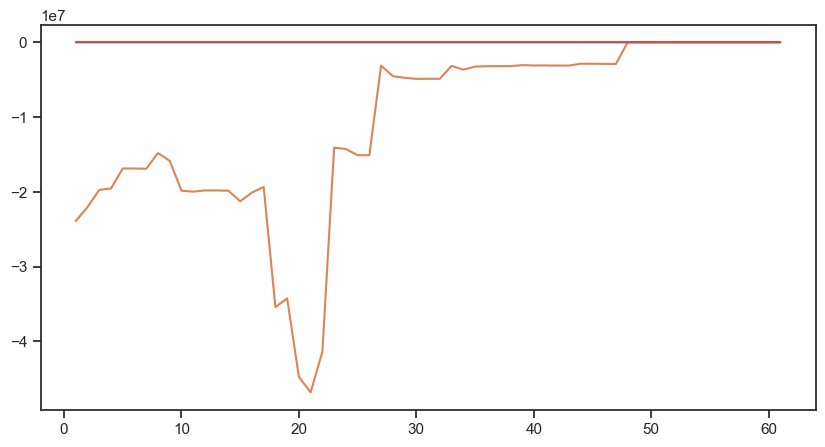

In [286]:
rfecv.ranking_

plt.figure(figsize=[10, 5])
plt.plot(range(1, X_train_home.shape[1]+1), rfecv.grid_scores_)
plt.show()


In [287]:
rfecv.n_features_

61

In [288]:
rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_home, y_train_home)

RFE(estimator=LinearRegression(), n_features_to_select=10)

In [289]:
col = X_train_home.columns[rfe.support_]
X_train1 =X_train_home[col]
X_test1 = X_test_home[col]


In [290]:
X_test1.head()

,deliverybdays,deliverycdays,product_procurement_sla,karaokeplayer,Content Marketing,Online marketing,Affiliates,Digital_SMA3,ContentMarketing_SMA3,Affiliates_SMA3
42,3.46,4.02,2.63,0,0.16,4.73,1.36,0.15,0.16,1.36
28,0.00,0.00,2.81,0,0.15,4.97,1.62,0.22,0.17,1.52
29,0.01,0.01,2.81,0,0.15,4.97,1.62,0.35,0.16,1.57
47,3.47,4.05,2.70,0,0.01,1.99,0.69,0.36,0.01,0.69
38,3.75,4.37,2.57,0,0.01,4.13,1.42,0.22,0.01,1.42


In [291]:
X_train_home_lm = model(X_train1,y_train_home)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     21.48
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           7.83e-09
Time:                        23:19:50   Log-Likelihood:                -482.47
No. Observations:                  32   AIC:                             986.9
Df Residuals:                      21   BIC:                             1003.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -4

In [292]:
VIF(X_train_home_lm)

,Features,VIF
1,deliverybdays,55611.65
2,deliverycdays,55406.79
0,const,799.89
7,Affiliates,244.37
6,Online marketing,172.16
10,Affiliates_SMA3,45.99
9,ContentMarketing_SMA3,44.03
5,Content Marketing,24.25
8,Digital_SMA3,21.25
4,karaokeplayer,1.86


* First Deleting cols with Both high VIF and p val
* Del Cols with high p val
* Del Cols with high VIF

In [293]:
X = X_train_home_lm.drop('deliverybdays', axis = 1)

In [294]:
X_train_home_lm = model(X,y_train_home)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     24.42
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           1.88e-09
Time:                        23:19:50   Log-Likelihood:                -482.82
No. Observations:                  32   AIC:                             985.6
Df Residuals:                      22   BIC:                             1000.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -4

In [295]:
VIF(X_train_home_lm)

,Features,VIF
0,const,795.97
6,Affiliates,191.20
5,Online marketing,145.71
8,ContentMarketing_SMA3,42.67
9,Affiliates_SMA3,38.86
4,Content Marketing,24.23
7,Digital_SMA3,21.18
3,karaokeplayer,1.85
1,deliverycdays,1.73
2,product_procurement_sla,1.69


In [296]:
X = X.drop('ContentMarketing_SMA3', axis = 1)

In [297]:
X_train_home_lm = model(X,y_train_home)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     28.63
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           3.46e-10
Time:                        23:19:50   Log-Likelihood:                -482.86
No. Observations:                  32   AIC:                             983.7
Df Residuals:                      23   BIC:                             996.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -3

In [298]:
VIF(X_train_home_lm)

,Features,VIF
0,const,654.63
6,Affiliates,143.01
5,Online marketing,131.16
8,Affiliates_SMA3,19.43
4,Content Marketing,19.24
7,Digital_SMA3,9.64
3,karaokeplayer,1.78
1,deliverycdays,1.60
2,product_procurement_sla,1.48


In [299]:
X = X.drop('Digital_SMA3', axis = 1)

In [300]:
X_train_home_lm = model(X,y_train_home)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     29.06
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           3.11e-10
Time:                        23:19:50   Log-Likelihood:                -485.19
No. Observations:                  32   AIC:                             986.4
Df Residuals:                      24   BIC:                             998.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -3

In [301]:
VIF(X_train_home_lm)

,Features,VIF
0,const,649.71
6,Affiliates,131.32
5,Online marketing,101.81
7,Affiliates_SMA3,18.78
4,Content Marketing,5.07
3,karaokeplayer,1.64
1,deliverycdays,1.57
2,product_procurement_sla,1.48


In [302]:
X = X_train_home_lm.drop('Content Marketing', axis = 1)

In [303]:
X_train_home_lm = model(X,y_train_home)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     30.82
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           2.18e-10
Time:                        23:19:50   Log-Likelihood:                -487.13
No. Observations:                  32   AIC:                             988.3
Df Residuals:                      25   BIC:                             998.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -3

In [304]:
VIF(X_train_home_lm)

,Features,VIF
0,const,647.84
5,Affiliates,73.28
4,Online marketing,39.28
6,Affiliates_SMA3,18.10
2,product_procurement_sla,1.47
3,karaokeplayer,1.42
1,deliverycdays,1.28


In [305]:
X = X.drop('Online marketing', axis = 1)

In [306]:
X_train_home_lm = model(X,y_train_home)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     35.44
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           8.26e-11
Time:                        23:19:50   Log-Likelihood:                -488.27
No. Observations:                  32   AIC:                             988.5
Df Residuals:                      26   BIC:                             997.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -3

In [307]:
VIF(X_train_home_lm)

,Features,VIF
0,const,647.46
5,Affiliates_SMA3,15.76
4,Affiliates,15.63
2,product_procurement_sla,1.47
3,karaokeplayer,1.28
1,deliverycdays,1.23


* Not Lot of columns are able to explain the Model
* Let us keep top 5 Columns as we are not Looking for accuracy.

### Residual Analysis

In [308]:
Linear_model2 = LinearRegression()
Linear_model2.fit(X_train1,y_train_home)


y_train_pred = Linear_model1.predict(X_train1)


Text(0.5, 0, 'Errors')

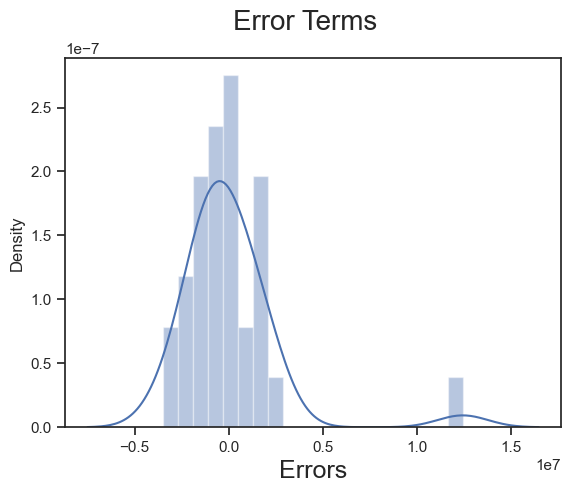

In [309]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train_home - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 


-- Error Terms are Distributed along 0

In [310]:
y_test_pred = Linear_model2.predict(X_test1)

Text(0, 0.5, 'y_pred')

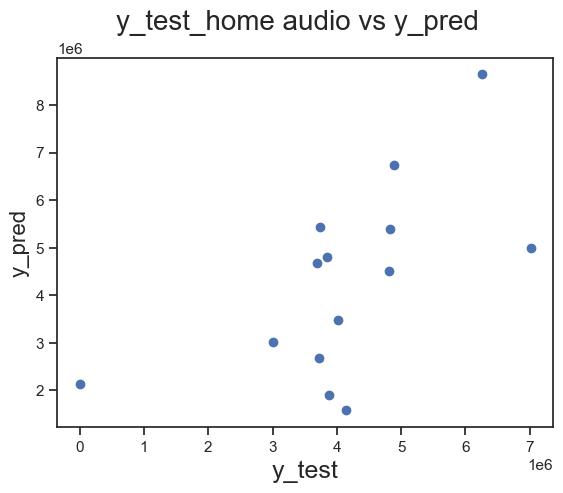

In [311]:
fig = plt.figure()
plt.scatter(y_test_home, y_test_pred)
fig.suptitle('y_test_home audio vs y_pred', fontsize = 20)              
plt.xlabel('y_test', fontsize = 18)                      
plt.ylabel('y_pred', fontsize = 16)   


In [312]:

print('r2 score of train data',r2_score(y_true= y_train_home, y_pred = y_train_pred))
print('Mean squared error on train data:',mean_squared_error(y_train_home,y_train_pred))
print('r2 score of test data',r2_score(y_true= y_test_home, y_pred = y_test_pred))
print('Mean squared error on Test data:',mean_squared_error(y_test_home,y_test_pred))

r2 score of train data 0.14963637297420018
Mean squared error on train data: 6973273498416.076
r2 score of test data -0.04968853050440858
Mean squared error on Test data: 2500121911639.184


In [313]:
cross_val_score(Linear_model2, X_train1, y_train_home, cv=5, n_jobs=-1, scoring="r2")

array([-0.62461505, -0.42826119, -3.03439119,  0.00739006, -2.24288042])

-- Accuracy on test data is very poor

In [314]:
#Using Cross validation
from sklearn.model_selection import cross_val_score


model_1= LinearRegression().fit(X_train_home_lm, y_train_home)

coef = pd.DataFrame(X_train_home_lm.columns)
coef['Coefficient'] = pd.Series(model_1.coef_)
coef




,0,Coefficient
0,const,0.00
1,deliverycdays,-408660.00
2,product_procurement_sla,2697872.19
3,karaokeplayer,14555804.82
4,Affiliates,-2888294.86
5,Affiliates_SMA3,3944034.15


<AxesSubplot:xlabel='Coefficient', ylabel='0'>

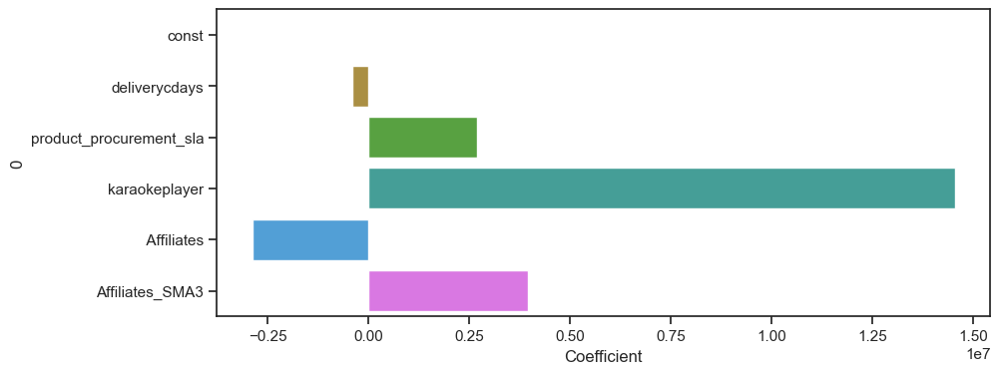

In [315]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 4))
sns.barplot(y=coef[0], x=coef['Coefficient'], palette='husl', estimator=np.sum)

### Linear Model  - Gaming_Accessory

In [316]:
X_train_gaming = train_gaming.drop('gmv', axis=1)
y_train_gaming = train_gaming['gmv']
X_test_gaming = test_gaming.drop('gmv', axis=1)
y_test_gaming = test_gaming['gmv']

In [317]:
X_train_gaming.describe()

,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,gamecontrolmount,gamepad,gamingaccessorykit,gamingadapter,gamingchargingstation,gamingheadset,gamingkeyboard,gamingmemorycard,gamingmouse,gamingmousepad,gamingspeaker,joystickgamingwheel,motioncontroller,tvoutcableaccessory,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3
count,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00,34.00
mean,1.04,1.22,5.61,2.50,44.07,947.88,49.45,1159.23,0.03,1019.32,168.26,60.71,1.00,1139.62,111.00,101.24,610.74,63.71,8.44,50.88,20.65,130.38,16.85,0.91,0.54,7.71,0.15,3.89,1.23,1.73,0.06,0.63,26.76,1.45,0.88,12.25,0.23,6.14,1.95,2.77,0.99,16.82,0.91,0.57,7.63,0.15,3.83,1.22,1.78,0.06,0.66,17.37,6.51,11.96,7.43,1.39,2.69,0.25,2.94,0.23,0.74,0.82,0.85,4724667.26
std,1.64,1.91,0.73,0.20,3.79,830.95,3.88,79.89,0.17,360.91,62.68,27.45,1.61,717.71,50.47,121.73,316.23,28.34,9.72,53.45,11.09,50.78,10.22,0.66,0.69,6.00,0.20,1.81,0.55,1.70,0.12,1.43,14.97,1.00,0.95,8.67,0.29,2.86,0.87,2.36,1.89,9.18,0.60,0.61,5.31,0.18,1.78,0.55,1.50,0.09,1.11,8.86,8.30,8.46,6.75,2.28,3.26,0.72,3.25,0.66,0.45,0.39,0.36,1429828.44
min,0.00,0.00,2.00,2.14,36.99,0.00,44.40,1015.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.01,0.00,0.09,0.21,0.00,0.03,0.01,0.50,0.00,0.00,1.62,0.00,0.25,0.34,0.00,0.04,0.02,0.80,0.00,1.01,0.00,0.15,0.21,0.00,0.03,0.01,0.50,0.00,0.00,-2.83,-11.67,-7.27,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1229.00
25%,0.00,0.00,5.56,2.40,41.21,568.25,46.93,1101.00,0.00,924.25,141.75,45.50,0.00,565.25,83.25,29.75,481.00,42.50,1.00,17.00,14.00,108.50,10.71,0.31,0.23,2.86,0.01,3.91,1.26,1.05,0.00,0.00,17.66,0.67,0.41,4.69,0.02,6.26,2.02,1.69,0.00,12.10,0.38,0.26,3.54,0.03,3.96,1.26,1.06,0.00,0.00,11.19,-0.62,5.81,0.61,0.00,0.19,0.00,0.39,0.00,0.25,1.00,1.00,4330913.50
50%,0.00,0.00,5.75,2.51,44.45,703.00,49.02,1194.00,0.00,1050.00,178.00,57.00,0.00,1062.00,103.50,56.50,581.50,68.50,5.50,27.00,18.50,137.00,14.53,0.86,0.34,6.26,0.12,4.35,1.39,1.26,0.00,0.00,24.82,1.45,0.56,10.08,0.17,7.29,2.28,2.01,0.00,15.61,0.97,0.39,6.31,0.11,4.51,1.42,1.26,0.00,0.00,17.43,6.00,11.41,6.59,0.00,1.56,0.00,2.30,0.00,1.00,1.00,1.00,5002669.50
75%,2.82,3.30,5.89,2.59,46.78,903.25,51.22,1226.50,0.00,1116.50,205.00,79.00,2.00,1581.25,137.25,91.25,686.75,78.00,11.00,65.75,27.75,160.25,24.77,1.34,0.53,13.23,0.16,4.91,1.60,1.51,0.00,0.00,37.82,2.11,0.90,16.45,0.26,7.90,2.50,2.48,1.45,22.40,1.30,0.58,10.23,0.17,4.82,1.57,1.61,0.13,1.00,24.56,14.41,20.19,12.19,2.41,3.88,0.00,4.19,0.00,1.00,1.00,1.00,5519527.92
max,3.90,4.58,6.43,3.25,51.32,3681.00,59.99,1242.00,1.00,1889.00,317.00,122.00,6.00,2546.00,217.00,591.00,1598.00,121.00,35.00,185.00,49.00,252.00,42.54,2.33,3.16,21.17,0.86,6.09,1.74,7.98,0.54,5.42,68.06,3.72,5.05,33.87,1.38,9.75,2.79,12.77,6.38,42.54,2.33,3.16,21.17,0.86,6.09,1.74,7.98,0.36,3.99,31.70,18.70,24.57,25.27,6.57,12.80,2.67,12.80,2.67,1.00,1.00,1.00,7364604.00


In [318]:
#Applying Standard scaler on DF
scaler  = StandardScaler()

scale_cols = X_train_gaming.columns

X_train_gaming[scale_cols] = scaler.fit_transform(X_train_gaming[scale_cols])
X_test_gaming[scale_cols] = scaler.transform(X_test_gaming[scale_cols])


In [319]:
lr  = LinearRegression()

lr.fit(X_train_gaming,y_train_gaming)

#Predicting Vars
y_train_pred_gaming = lr.predict(X_train_gaming)
y_test_pred_gaming = lr.predict(X_test_gaming)

print('r2 score of train data',r2_score(y_true= y_train_gaming, y_pred = y_train_pred_gaming))
print('r2 score of test data',r2_score(y_true= y_test_gaming, y_pred = y_test_pred_gaming))


r2 score of train data 1.0
r2 score of test data 0.9042835652586577


# Using RFE for feature Elemination

In [320]:
lr = LinearRegression()

rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_gaming, y_train_gaming)


RFE(estimator=LinearRegression(), n_features_to_select=10)

In [321]:
rfe.ranking_

array([31, 12, 36, 22, 49,  5, 19, 20, 46,  2,  1, 40, 26,  1, 50, 11,  4,
        1,  7,  3,  1, 16, 53, 51,  9, 48,  1, 24, 29, 17, 28, 55,  1, 44,
        1, 32, 23,  1,  1, 13, 10,  1, 35, 39, 25, 54, 37, 41, 34, 45, 27,
       38, 42, 52, 18,  8, 43, 15, 30, 14, 21, 33, 47,  6])

In [322]:
X_train_gaming.columns[rfe.support_]

Index(['gamingaccessorykit', 'gamingheadset', 'gamingmousepad',
       'motioncontroller', 'Content Marketing', 'TI_adstock',
       'Digital_adstock', 'Online_marketing_adstock', 'Affiliates_adstock',
       'TI_SMA3'],
      dtype='object')


* Let us try RFECV for Feature elimination


In [323]:
lr  = LinearRegression()
rfecv = RFECV(estimator=lr, cv=4)

In [324]:

%%time
rfecv.fit(X_train_gaming, y_train_gaming)

CPU times: total: 1.98 s
Wall time: 863 ms


RFECV(cv=4, estimator=LinearRegression())

In [325]:
rfecv.ranking_


array([ 3,  1,  8,  1, 21,  1,  1,  1, 18,  1,  1, 12,  1,  1, 22,  1,  1,
        1,  1,  1,  1,  1, 25, 23,  1, 20,  1,  1,  1,  1,  1, 27,  1, 16,
        1,  4,  1,  1,  1,  1,  1,  1,  7, 11,  1, 26,  9, 13,  6, 17,  1,
       10, 14, 24,  1,  1, 15,  1,  2,  1,  1,  5, 19,  1])

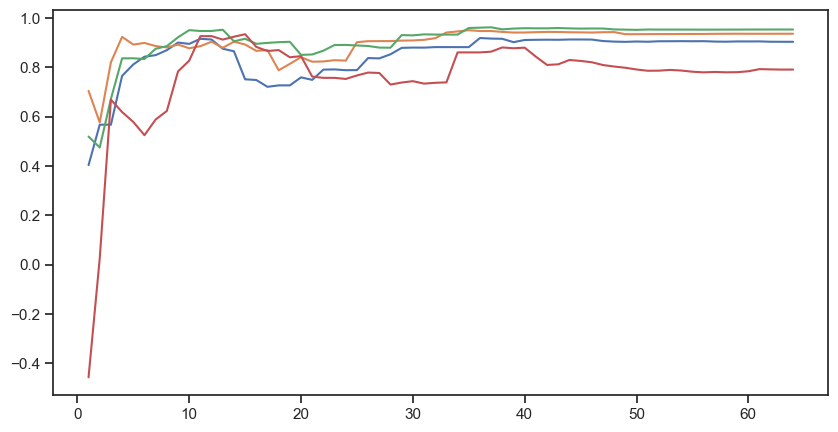

In [326]:
plt.figure(figsize=[10, 5])
plt.plot(range(1, X_train_gaming.shape[1]+1), rfecv.grid_scores_)
plt.show()

In [327]:
rfecv.n_features_

38

In [328]:
rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_gaming, y_train_gaming)

RFE(estimator=LinearRegression(), n_features_to_select=10)

In [329]:
col = X_train_gaming.columns[rfe.support_]
X_train1 =X_train_gaming[col]
X_test1 = X_test_gaming[col]

In [330]:
X_test1.head()

,gamingaccessorykit,gamingheadset,gamingmousepad,motioncontroller,Content Marketing,TI_adstock,Digital_adstock,Online_marketing_adstock,Affiliates_adstock,TI_SMA3
15,1.99,3.08,6.28,0.40,3.59,2.80,4.45,1.28,0.98,2.84
48,1.05,0.18,-0.13,-0.15,-0.67,-0.45,-0.46,-0.47,-0.51,-0.31
50,0.68,0.14,0.12,2.05,-0.67,-0.65,-0.33,-1.05,-0.98,-0.68
47,0.58,0.87,-1.28,3.97,0.06,-0.12,-0.67,0.51,0.26,-0.13
19,0.97,0.01,-0.46,-0.88,-0.56,-0.70,-0.50,0.04,0.19,-0.73


In [331]:

X_train_gaming_lm = model(X_train1,y_train_gaming)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     99.28
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           1.75e-16
Time:                        23:19:55   Log-Likelihood:                -456.89
No. Observations:                  34   AIC:                             935.8
Df Residuals:                      23   BIC:                             952.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [332]:
VIF(X_train_gaming_lm)

,Features,VIF
8,Online_marketing_adstock,128.38
9,Affiliates_adstock,96.20
10,TI_SMA3,17.17
6,TI_adstock,16.38
5,Content Marketing,11.34
7,Digital_adstock,8.29
3,gamingmousepad,4.16
2,gamingheadset,3.89
1,gamingaccessorykit,2.99
4,motioncontroller,2.57


In [333]:
X = X_train_gaming_lm.drop('TI_adstock', axis = 1)

In [334]:
X_train_gaming_lm = model(X,y_train_gaming)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     90.60
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           2.53e-16
Time:                        23:19:55   Log-Likelihood:                -460.86
No. Observations:                  34   AIC:                             941.7
Df Residuals:                      24   BIC:                             957.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [335]:
VIF(X_train_gaming_lm)

,Features,VIF
7,Online_marketing_adstock,127.17
8,Affiliates_adstock,94.19
9,TI_SMA3,9.10
5,Content Marketing,9.05
6,Digital_adstock,8.24
3,gamingmousepad,3.72
2,gamingheadset,3.64
1,gamingaccessorykit,2.75
4,motioncontroller,2.37
0,const,1.00


In [336]:
X = X.drop('Digital_adstock',axis =1)

In [337]:

X_train_gaming_lm = model(X,y_train_gaming)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     89.48
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           1.84e-16
Time:                        23:19:55   Log-Likelihood:                -463.68
No. Observations:                  34   AIC:                             945.4
Df Residuals:                      25   BIC:                             959.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [338]:
VIF(X_train_gaming_lm)

,Features,VIF
6,Online_marketing_adstock,104.46
7,Affiliates_adstock,87.62
8,TI_SMA3,4.80
3,gamingmousepad,3.68
2,gamingheadset,3.40
5,Content Marketing,3.36
1,gamingaccessorykit,2.75
4,motioncontroller,2.08
0,const,1.00


In [339]:
X = X.drop('Content Marketing',axis =1)

In [340]:
X_train_gaming_lm = model(X,y_train_gaming)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.963
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     96.31
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           5.86e-17
Time:                        23:19:55   Log-Likelihood:                -465.30
No. Observations:                  34   AIC:                             946.6
Df Residuals:                      26   BIC:                             958.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [341]:
VIF(X_train_gaming_lm)

,Features,VIF
5,Online_marketing_adstock,58.17
6,Affiliates_adstock,50.13
7,TI_SMA3,4.32
3,gamingmousepad,3.68
2,gamingheadset,3.35
1,gamingaccessorykit,2.69
4,motioncontroller,2.04
0,const,1.00


In [342]:
X = X.drop('Online_marketing_adstock',axis =1)

In [343]:
X_train_gaming_lm = model(X,y_train_gaming)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     72.50
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           2.25e-15
Time:                        23:19:55   Log-Likelihood:                -473.01
No. Observations:                  34   AIC:                             960.0
Df Residuals:                      27   BIC:                             970.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               2.987e+06   5.13

In [344]:
VIF(X_train_gaming_lm)

,Features,VIF
5,Affiliates_adstock,4.91
3,gamingmousepad,3.67
6,TI_SMA3,3.59
2,gamingheadset,3.31
1,gamingaccessorykit,2.69
4,motioncontroller,2.03
0,const,1.00


In [345]:
X = X.drop('Affiliates_adstock',axis =1)

In [346]:
X_train_gaming_lm = model(X,y_train_gaming)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     89.50
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           2.48e-16
Time:                        23:19:55   Log-Likelihood:                -473.14
No. Observations:                  34   AIC:                             958.3
Df Residuals:                      28   BIC:                             967.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               2.987e+06   5.06

In [347]:
VIF(X_train_gaming_lm)

,Features,VIF
3,gamingmousepad,3.35
2,gamingheadset,2.81
1,gamingaccessorykit,2.68
4,motioncontroller,1.99
5,TI_SMA3,1.38
0,const,1.00


* Let us keep Top 5 vars as we are more looking for Top contributers rather than accuracy

### Residual Analysis

In [348]:
Linear_model3 = LinearRegression()
Linear_model3.fit(X_train1,y_train_gaming)


y_train_pred = Linear_model3.predict(X_train1)


Text(0.5, 0, 'Errors')

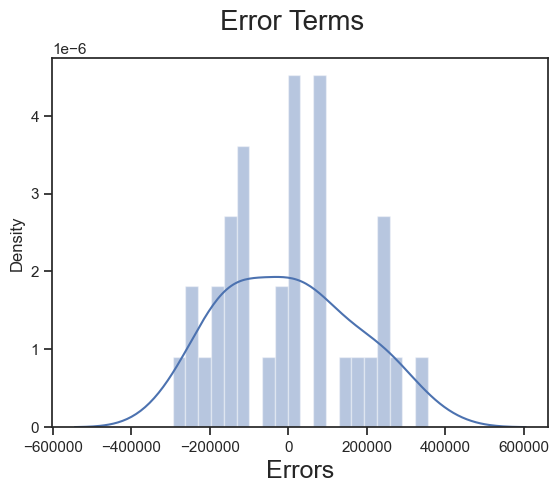

In [349]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train_gaming - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

* Error terms are  around 0

In [350]:
y_test_pred = Linear_model1.predict(X_test1)

Text(0, 0.5, 'y_pred')

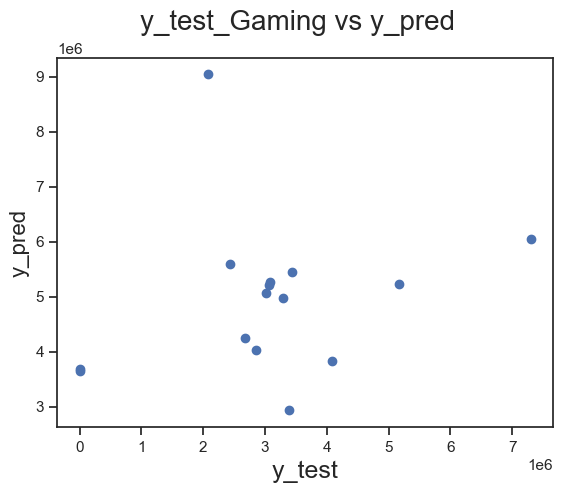

In [351]:
fig = plt.figure()
plt.scatter(y_test_gaming, y_test_pred)
fig.suptitle('y_test_Gaming vs y_pred', fontsize = 20)              
plt.xlabel('y_test', fontsize = 18)                      
plt.ylabel('y_pred', fontsize = 16)   


In [352]:
r2_score(y_true= y_test_gaming, y_pred = y_test_pred)


-1.5303001348794707

In [353]:
print('r2 score of train data',r2_score(y_true= y_train_gaming, y_pred = y_train_pred))
print('Mean squared error on train data:',mean_squared_error(y_train_gaming,y_train_pred))
print('r2 score of test data',r2_score(y_true= y_test_gaming, y_pred = y_test_pred))
print('Mean sqaured error on Test data:',mean_squared_error(y_test_gaming,y_test_pred))


r2 score of train data 0.9773583045274947
Mean squared error on train data: 27517812680.623917
r2 score of test data -1.5303001348794707
Mean sqaured error on Test data: 7428535680723.1875


In [354]:
model3= LinearRegression().fit(X_train_gaming_lm, y_train_gaming)


In [355]:
coef = pd.DataFrame(X_train_gaming_lm.columns)
coef['Coefficient'] = pd.Series(model3.coef_)
coef

,0,Coefficient
0,const,0.00
1,gamingaccessorykit,403429.82
2,gamingheadset,262718.95
3,gamingmousepad,292091.53
4,motioncontroller,301698.35
5,TI_SMA3,8547.86


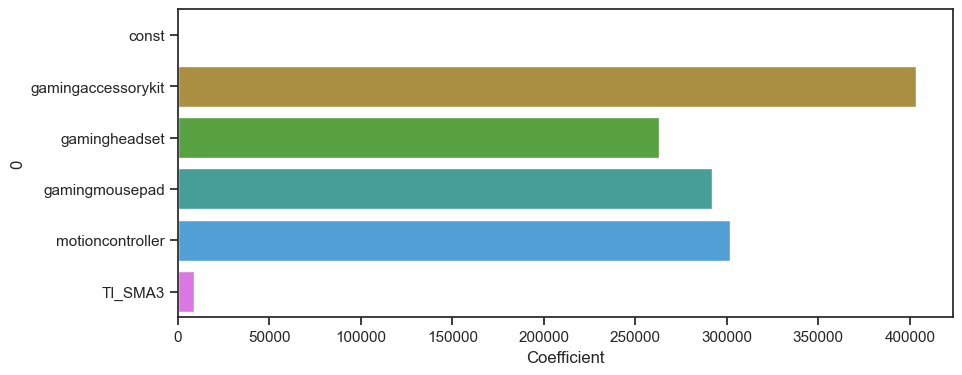

In [356]:
plt.figure(figsize=(10, 4))
sns.barplot(y=coef[0], x=coef['Coefficient'], palette='husl', estimator=np.sum)

plt.show()

### MultipliCative Model 

In [357]:
gaming_accessory.columns

Index(['gmv', 'deliverybdays', 'deliverycdays', 'sla',
       'product_procurement_sla', 'discount', 'order_payment_type_prepaid',
       'NPS', 'Stock Index', 'gamecontrolmount', 'gamepad',
       'gamingaccessorykit', 'gamingadapter', 'gamingchargingstation',
       'gamingheadset', 'gamingkeyboard', 'gamingmemorycard', 'gamingmouse',
       'gamingmousepad', 'gamingspeaker', 'joystickgamingwheel',
       'motioncontroller', 'tvoutcableaccessory', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM', 'Radio', 'Other', 'TI_adstock', 'TV_adstock',
       'Digital_adstock', 'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Other_adstock', 'TI_SMA3', 'TV_SMA3', 'Digital_SMA3',
       'Sponsorship_SMA3', 'ContentMarketing_SMA3', 'Onlinemarketing_SMA3',
       'Affiliates_SMA3', 'SEM_SMA3', 'Radio_SMA3', 'Other_SMA3', 'Max Temp',
     

In [358]:
#LEt us Remove repeated cols and keep only need ones

camera_df = camera_accessory[['gmv', 'deliverybdays', 'deliverycdays', 'sla',
       'product_procurement_sla', 'discount', 'order_payment_type_prepaid',
       'NPS', 'Stock Index', 'cameraaccessory', 'camerabag', 'camerabattery',
       'camerabatterycharger', 'camerabatterygrip', 'cameraeyecup',
       'camerafilmrolls', 'camerahousing', 'cameraledlight',
       'cameramicrophone', 'cameramount', 'cameraremotecontrol',
       'cameratripod', 'extensiontube', 'filter', 'flash', 'flashshoeadapter',
       'lens', 'reflectorumbrella', 'softbox', 'strap', 'teleconverter',
       'telescope', 'TI_adstock', 'TV_adstock', 'Digital_adstock',
       'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Other_adstock', 'TI_SMA3', 'TV_SMA3', 'Digital_SMA3',
       'Sponsorship_SMA3', 'ContentMarketing_SMA3', 'Onlinemarketing_SMA3',
       'Affiliates_SMA3', 'SEM_SMA3', 'Radio_SMA3', 'Other_SMA3', 'Max Temp',
       'Min Temp', 'Mean Temp', ' Heat Deg Days', 'Cool Deg Days',
       'Total Rain', 'Total Snow', 'Total Precip', 'Snow on Grnd', 'sale_week',
       'payday_week', 'holiday_week', 'listing_price_SMA3', 'RPI']]

home_df = home_audio[['gmv', 'deliverybdays', 'deliverycdays', 'sla',
       'product_procurement_sla', 'discount', 'order_payment_type_prepaid',
       'NPS', 'Stock Index', 'djcontroller', 'dock', 'dockingstation',
       'fmradio', 'hifisystem', 'homeaudiospeaker', 'karaokeplayer',
       'slingbox', 'soundmixer', 'voicerecorder', 'TI_adstock', 'TV_adstock',
       'Digital_adstock', 'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Other_adstock', 'TI_SMA3', 'TV_SMA3', 'Digital_SMA3',
       'Sponsorship_SMA3', 'ContentMarketing_SMA3', 'Onlinemarketing_SMA3',
       'Affiliates_SMA3', 'SEM_SMA3', 'Radio_SMA3', 'Other_SMA3', 'Max Temp',
       'Min Temp', 'Mean Temp', ' Heat Deg Days', 'Cool Deg Days',
       'Total Rain', 'Total Snow', 'Total Precip', 'Snow on Grnd', 'sale_week',
       'payday_week', 'holiday_week', 'listing_price_SMA3', 'RPI']]

gaming_df = gaming_accessory[['gmv', 'deliverybdays', 'deliverycdays', 'sla',
       'product_procurement_sla', 'discount', 'order_payment_type_prepaid',
       'NPS', 'Stock Index', 'gamecontrolmount', 'gamepad',
       'gamingaccessorykit', 'gamingadapter', 'gamingchargingstation',
       'gamingheadset', 'gamingkeyboard', 'gamingmemorycard', 'gamingmouse',
       'gamingmousepad', 'gamingspeaker', 'joystickgamingwheel',
       'motioncontroller', 'tvoutcableaccessory', 'TI_adstock', 'TV_adstock',
       'Digital_adstock', 'Sponsorship_adstock', 'Content_Marketing_adstock',
       'Online_marketing_adstock', 'Affiliates_adstock', 'SEM_adstock',
       'Other_adstock', 'TI_SMA3', 'TV_SMA3', 'Digital_SMA3',
       'Sponsorship_SMA3', 'ContentMarketing_SMA3', 'Onlinemarketing_SMA3',
       'Affiliates_SMA3', 'SEM_SMA3', 'Radio_SMA3', 'Other_SMA3', 'Max Temp',
       'Min Temp', 'Mean Temp', ' Heat Deg Days', 'Cool Deg Days',
       'Total Rain', 'Total Snow', 'Total Precip', 'Snow on Grnd', 'sale_week',
       'payday_week', 'holiday_week', 'listing_price_SMA3']]

In [359]:
camera_df.head()

,gmv,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
2,4311420.00,0.00,0.00,6.40,2.76,44.27,1045.00,54.60,1177.00,36,356.00,752.00,225.00,9,0,0,0,0,0,11,142.00,495.00,0,186.00,27.00,0,526.00,0,0,24,0,22,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,28.75,17.58,23.18,0.00,5.18,1.40,0.00,1.40,0.00,0,0,1,2700807.33,0.58
3,4243833.00,0.00,0.00,6.41,2.80,43.51,990.00,54.60,1177.00,48,295.00,773.00,267.00,12,0,0,0,0,0,7,108.00,465.00,0,186.00,31.00,0,573.00,0,0,23,0,30,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,29.50,16.60,23.06,0.00,5.06,1.08,0.00,1.08,0.00,1,1,1,4083817.33,0.02
4,2756563.00,0.00,0.00,6.37,2.78,42.82,608.00,54.60,1177.03,45,185.00,484.00,180.00,11,0,0,0,0,0,2,84.00,360.00,1,109.00,28.00,0,331.00,0,0,23,0,13,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00,31.58,17.50,24.57,0.00,6.57,4.63,0.00,4.63,0.00,1,1,1,3715564.00,-0.27
5,2198.00,0.00,0.00,9.00,4.00,12.95,3.00,59.99,1206.00,0,0.00,3.00,0.00,0,0,0,0,0,0,0,0.00,1.00,0,0.00,0.00,0,0.00,0,0,0,0,0,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,2.10,0.02,0.38,0.76,0.00,0.13,0.06,0.75,0.00,0.00,27.25,16.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00,1,1,0,2295396.00,-1.00
6,299.00,0.00,0.00,6.00,1.00,84.97,0.00,59.99,1206.00,0,0.00,0.00,0.00,0,0,0,0,0,0,0,0.00,1.00,0,0.00,0.00,0,0.00,0,0,0,0,0,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,29.62,18.25,23.95,0.00,5.95,2.90,0.00,2.90,0.00,0,0,1,907242.00,-1.00


In [360]:
gaming_df.head()

,gmv,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,gamecontrolmount,gamepad,gamingaccessorykit,gamingadapter,gamingchargingstation,gamingheadset,gamingkeyboard,gamingmemorycard,gamingmouse,gamingmousepad,gamingspeaker,joystickgamingwheel,motioncontroller,tvoutcableaccessory,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3
2,2270363.36,0.00,0.00,5.33,2.65,42.23,635.00,54.60,1177.00,0,1552.00,131.00,45,0,202.00,173.00,36.00,381.00,47,0,14,16,97,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,28.75,17.58,23.18,0.00,5.18,1.40,0.00,1.40,0.00,0,0,1,2700807.33
3,2588844.50,0.00,0.00,5.42,2.51,36.99,567.00,54.60,1177.00,0,1044.00,165.00,38,0,292.00,188.00,29.00,484.00,68,0,17,21,94,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,29.50,16.60,23.06,0.00,5.06,1.08,0.00,1.08,0.00,1,1,1,4083817.33
4,1900937.00,0.01,0.01,5.67,2.71,42.72,359.00,54.60,1177.02,0,668.00,101.00,32,0,448.00,84.00,13.00,247.00,37,1,27,14,77,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00,31.58,17.50,24.57,0.00,6.57,4.63,0.00,4.63,0.00,1,1,1,3715564.00
5,2295.00,0.00,0.00,7.25,2.25,62.94,1.00,59.99,1206.00,0,2.00,0.00,0,0,1.00,0.00,0.00,0.00,0,0,0,0,1,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,2.10,0.02,0.38,0.76,0.00,0.13,0.06,0.75,0.00,0.00,27.25,16.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00,1,1,0,2295396.00
6,4875.00,1.25,1.50,6.00,2.50,38.60,1.00,59.99,1206.00,0,3.00,0.00,0,0,1.00,0.00,0.00,0.00,0,0,0,0,0,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,1.01,0.00,0.26,0.21,0.00,0.03,0.01,0.50,0.00,0.00,29.62,18.25,23.95,0.00,5.95,2.90,0.00,2.90,0.00,1,1,1,907242.00


In [361]:
home_df.head()

,gmv,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,djcontroller,dock,dockingstation,fmradio,hifisystem,homeaudiospeaker,karaokeplayer,slingbox,soundmixer,voicerecorder,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
2,5368024.00,0.00,0.00,6.98,2.75,32.94,576.00,54.60,1177.00,7,50,1,574.00,42,1623.00,0,0,0,69,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,28.75,17.58,23.18,0.00,5.18,1.40,0.00,1.40,0.00,0,0,1,2700807.33,0.98
3,4678337.00,0.00,0.00,7.07,2.86,32.35,472.00,54.60,1177.00,4,56,0,577.00,36,1430.00,0,0,0,46,6.82,0.09,1.01,2.97,0.00,0.53,0.22,2.01,0.00,4.27,0.05,0.63,1.85,0.00,0.33,0.14,1.26,0.00,0.00,29.50,16.60,23.06,0.00,5.06,1.08,0.00,1.08,0.00,1,1,1,4083817.33,0.14
4,3451151.00,0.00,0.00,7.20,2.73,32.21,355.00,54.60,1177.00,2,43,0,420.00,20,1025.00,0,0,0,44,3.57,0.03,0.64,1.32,0.00,0.22,0.10,1.26,0.00,3.18,0.04,0.51,1.31,0.00,0.23,0.10,1.00,0.00,0.00,31.58,17.50,24.57,0.00,6.57,4.63,0.00,4.63,0.00,1,1,1,3715564.00,-0.08
5,2599.00,0.00,0.00,9.00,2.00,16.13,1.00,59.99,1206.00,0,0,0,0.00,0,1.00,0,0,0,0,1.62,0.00,0.41,0.34,0.00,0.04,0.02,0.80,0.00,2.10,0.02,0.38,0.76,0.00,0.13,0.06,0.75,0.00,0.00,27.25,16.00,21.65,0.00,3.65,0.35,0.00,0.35,0.00,1,1,0,2295396.00,-1.00
6,3875305.00,0.00,0.00,5.60,2.79,35.96,444.00,46.98,1101.45,5,48,1,525.00,36,1108.00,0,0,0,66,24.67,0.97,0.49,15.82,0.15,4.11,1.27,1.85,0.00,8.70,0.32,0.28,5.37,0.05,1.38,0.43,0.85,0.00,0.00,30.20,18.70,24.46,0.00,6.46,12.12,0.00,12.12,0.00,1,1,1,907242.00,3.25


In [362]:
### Applying Log for the datasets
camera_df=np.log(camera_df)

camera_df = camera_df.fillna(0)
camera_df = camera_df.replace([np.inf, -np.inf], 0)


home_df=np.log(home_df)

home_df = home_df.fillna(0)
home_df = home_df.replace([np.inf, -np.inf], 0)

gaming_df=np.log(gaming_df)

gaming_df = gaming_df.fillna(0)
gaming_df = gaming_df.replace([np.inf, -np.inf], 0)

In [363]:
camera_df.head()

,gmv,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,cameraaccessory,camerabag,camerabattery,camerabatterycharger,camerabatterygrip,cameraeyecup,camerafilmrolls,camerahousing,cameraledlight,cameramicrophone,cameramount,cameraremotecontrol,cameratripod,extensiontube,filter,flash,flashshoeadapter,lens,reflectorumbrella,softbox,strap,teleconverter,telescope,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
2,15.28,0.00,0.00,1.86,1.01,3.79,6.95,4.00,7.07,3.58,5.87,6.62,5.42,2.20,0.00,0.00,0.00,0.00,0.00,2.40,4.96,6.20,0.00,5.23,3.30,0.00,6.27,0.00,0.00,3.18,0.00,3.09,1.92,-2.45,0.01,1.09,-7.89,-0.63,-1.52,0.70,0.00,1.45,-2.92,-0.46,0.62,-8.36,-1.10,-1.99,0.23,0.00,0.00,3.36,2.87,3.14,0.00,1.65,0.34,0.00,0.34,0.00,0.00,0.00,0.00,14.81,-0.55
3,15.26,-5.94,-5.72,1.86,1.03,3.77,6.90,4.00,7.07,3.87,5.69,6.65,5.59,2.48,0.00,0.00,0.00,0.00,0.00,1.95,4.68,6.14,0.00,5.23,3.43,0.00,6.35,0.00,0.00,3.13,0.00,3.40,1.92,-2.45,0.01,1.09,-7.89,-0.63,-1.52,0.70,0.00,1.45,-2.92,-0.46,0.62,-8.36,-1.10,-1.99,0.23,0.00,0.00,3.38,2.81,3.14,0.00,1.62,0.08,0.00,0.08,0.00,0.00,0.00,0.00,15.22,-3.92
4,14.83,0.00,0.00,1.85,1.02,3.76,6.41,4.00,7.07,3.81,5.22,6.18,5.19,2.40,0.00,0.00,0.00,0.00,0.00,0.69,4.43,5.89,0.00,4.69,3.33,0.00,5.80,0.00,0.00,3.13,0.00,2.56,1.27,-3.39,-0.45,0.28,-8.87,-1.49,-2.33,0.23,0.00,1.16,-3.32,-0.68,0.27,-8.77,-1.47,-2.34,0.00,0.00,0.00,3.45,2.86,3.20,0.00,1.88,1.53,0.00,1.53,0.00,0.00,0.00,0.00,15.13,0.00
5,7.70,0.00,0.00,2.20,1.39,2.56,1.10,4.09,7.10,0.00,0.00,1.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.48,-6.18,-0.89,-1.08,-13.11,-3.19,-3.75,-0.22,0.00,0.74,-3.97,-0.96,-0.27,-9.45,-2.06,-2.89,-0.28,0.00,0.00,3.31,2.77,3.08,0.00,1.29,-1.05,0.00,-1.05,0.00,0.00,0.00,0.00,14.65,0.00
6,5.70,0.00,0.00,1.79,0.00,4.44,0.00,4.09,7.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.48,-6.18,-0.89,-1.08,-13.11,-3.19,-3.75,-0.22,0.00,0.01,-6.65,-1.36,-1.55,-13.58,-3.66,-4.22,-0.69,0.00,0.00,3.39,2.90,3.18,0.00,1.78,1.06,0.00,1.06,0.00,0.00,0.00,0.00,13.72,0.00


In [364]:
gaming_df.head()

,gmv,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,gamecontrolmount,gamepad,gamingaccessorykit,gamingadapter,gamingchargingstation,gamingheadset,gamingkeyboard,gamingmemorycard,gamingmouse,gamingmousepad,gamingspeaker,joystickgamingwheel,motioncontroller,tvoutcableaccessory,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3
2,14.64,0.00,0.00,1.67,0.97,3.74,6.45,4.00,7.07,0.00,7.35,4.88,3.81,0.00,5.31,5.15,3.58,5.94,3.85,0.00,2.64,2.77,4.57,1.92,-2.45,0.01,1.09,-7.89,-0.63,-1.52,0.70,0.00,1.45,-2.92,-0.46,0.62,-8.36,-1.10,-1.99,0.23,0.00,0.00,3.36,2.87,3.14,0.00,1.65,0.34,0.00,0.34,0.00,0.00,0.00,0.00,14.81
3,14.77,0.00,0.00,1.69,0.92,3.61,6.34,4.00,7.07,0.00,6.95,5.11,3.64,0.00,5.68,5.24,3.37,6.18,4.22,0.00,2.83,3.04,4.54,1.92,-2.45,0.01,1.09,-7.89,-0.63,-1.52,0.70,0.00,1.45,-2.92,-0.46,0.62,-8.36,-1.10,-1.99,0.23,0.00,0.00,3.38,2.81,3.14,0.00,1.62,0.08,0.00,0.08,0.00,0.00,0.00,0.00,15.22
4,14.46,-4.76,-4.58,1.74,1.00,3.75,5.88,4.00,7.07,0.00,6.50,4.62,3.46,0.00,6.10,4.43,2.56,5.51,3.61,0.00,3.29,2.64,4.34,1.27,-3.39,-0.45,0.28,-8.87,-1.49,-2.33,0.23,0.00,1.16,-3.32,-0.68,0.27,-8.77,-1.47,-2.34,0.00,0.00,0.00,3.45,2.86,3.20,0.00,1.88,1.53,0.00,1.53,0.00,0.00,0.00,0.00,15.13
5,7.74,0.00,0.00,1.98,0.81,4.14,0.00,4.09,7.10,0.00,0.69,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.48,-6.18,-0.89,-1.08,-13.11,-3.19,-3.75,-0.22,0.00,0.74,-3.97,-0.96,-0.27,-9.45,-2.06,-2.89,-0.28,0.00,0.00,3.31,2.77,3.08,0.00,1.29,-1.05,0.00,-1.05,0.00,0.00,0.00,0.00,14.65
6,8.49,0.22,0.41,1.79,0.92,3.65,0.00,4.09,7.10,0.00,1.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.48,-6.18,-0.89,-1.08,-13.11,-3.19,-3.75,-0.22,0.00,0.01,-6.65,-1.36,-1.55,-13.58,-3.66,-4.22,-0.69,0.00,0.00,3.39,2.90,3.18,0.00,1.78,1.06,0.00,1.06,0.00,0.00,0.00,0.00,13.72


In [365]:
home_df.head()

,gmv,deliverybdays,deliverycdays,sla,product_procurement_sla,discount,order_payment_type_prepaid,NPS,Stock Index,djcontroller,dock,dockingstation,fmradio,hifisystem,homeaudiospeaker,karaokeplayer,slingbox,soundmixer,voicerecorder,TI_adstock,TV_adstock,Digital_adstock,Sponsorship_adstock,Content_Marketing_adstock,Online_marketing_adstock,Affiliates_adstock,SEM_adstock,Other_adstock,TI_SMA3,TV_SMA3,Digital_SMA3,Sponsorship_SMA3,ContentMarketing_SMA3,Onlinemarketing_SMA3,Affiliates_SMA3,SEM_SMA3,Radio_SMA3,Other_SMA3,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain,Total Snow,Total Precip,Snow on Grnd,sale_week,payday_week,holiday_week,listing_price_SMA3,RPI
2,15.50,0.00,0.00,1.94,1.01,3.49,6.36,4.00,7.07,1.95,3.91,0.00,6.35,3.74,7.39,0.00,0.00,0.00,4.23,1.92,-2.45,0.01,1.09,-7.89,-0.63,-1.52,0.70,0.00,1.45,-2.92,-0.46,0.62,-8.36,-1.10,-1.99,0.23,0.00,0.00,3.36,2.87,3.14,0.00,1.65,0.34,0.00,0.34,0.00,0.00,0.00,0.00,14.81,-0.02
3,15.36,0.00,0.00,1.96,1.05,3.48,6.16,4.00,7.07,1.39,4.02,0.00,6.36,3.58,7.27,0.00,0.00,0.00,3.83,1.92,-2.45,0.01,1.09,-7.89,-0.63,-1.52,0.70,0.00,1.45,-2.92,-0.46,0.62,-8.36,-1.10,-1.99,0.23,0.00,0.00,3.38,2.81,3.14,0.00,1.62,0.08,0.00,0.08,0.00,0.00,0.00,0.00,15.22,-1.97
4,15.05,0.00,0.00,1.97,1.01,3.47,5.87,4.00,7.07,0.69,3.76,0.00,6.04,3.00,6.93,0.00,0.00,0.00,3.79,1.27,-3.39,-0.45,0.28,-8.87,-1.49,-2.33,0.23,0.00,1.16,-3.32,-0.68,0.27,-8.77,-1.47,-2.34,0.00,0.00,0.00,3.45,2.86,3.20,0.00,1.88,1.53,0.00,1.53,0.00,0.00,0.00,0.00,15.13,0.00
5,7.86,0.00,0.00,2.20,0.69,2.78,0.00,4.09,7.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.48,-6.18,-0.89,-1.08,-13.11,-3.19,-3.75,-0.22,0.00,0.74,-3.97,-0.96,-0.27,-9.45,-2.06,-2.89,-0.28,0.00,0.00,3.31,2.77,3.08,0.00,1.29,-1.05,0.00,-1.05,0.00,0.00,0.00,0.00,14.65,0.00
6,15.17,0.00,0.00,1.72,1.03,3.58,6.10,3.85,7.00,1.61,3.87,0.00,6.26,3.58,7.01,0.00,0.00,0.00,4.19,3.21,-0.03,-0.71,2.76,-1.88,1.41,0.24,0.62,0.00,2.16,-1.13,-1.26,1.68,-2.98,0.32,-0.84,-0.16,0.00,0.00,3.41,2.93,3.20,0.00,1.87,2.49,0.00,2.49,0.00,0.00,0.00,0.00,13.72,1.18


## Multiplicative Model 

In [366]:
train_camera, test_camera = train_test_split(camera_df, test_size=0.3, random_state=42)
train_home, test_home = train_test_split(home_df, test_size=0.3, random_state=42)
train_gaming, test_gaming = train_test_split(gaming_df, test_size=0.3, random_state=42)

In [367]:
print('shape of train_camera',train_camera.shape)
print('shape of train_home',train_home.shape)
print('shape of train_gaming',train_gaming.shape)

print('shape of test_Camera',test_Camera.shape)
print('shape of test_home',test_home.shape)
print('shape of test_gaming',test_gaming.shape)



shape of train_camera (33, 65)
shape of train_home (32, 52)
shape of train_gaming (34, 55)
shape of test_Camera (15, 75)
shape of test_home (14, 52)
shape of test_gaming (15, 55)


In [368]:
X_train_camera = train_camera.drop('gmv', axis=1)
y_train_camera = train_camera['gmv']
X_test_camera = test_camera.drop('gmv', axis=1)
y_test_camera = test_camera['gmv']

X_train_home = train_home.drop('gmv', axis=1)
y_train_home = train_home['gmv']
X_test_home = test_home.drop('gmv', axis=1)
y_test_home = test_home['gmv']


X_train_gaming = train_gaming.drop('gmv', axis=1)
y_train_gaming = train_gaming['gmv']
X_test_gaming = test_gaming.drop('gmv', axis=1)
y_test_gaming = test_gaming['gmv']


## camera Accessory

In [369]:
#Applying Standard scaler on DF
scaler  = StandardScaler()


scale_cols = X_train_camera.columns

X_train_camera[scale_cols] = scaler.fit_transform(X_train_camera[scale_cols])
X_test_camera[scale_cols] = scaler.transform(X_test_camera[scale_cols])



In [370]:
#Applying simple Linear model on whole data set

lr  = LinearRegression()

lr.fit(X_train_camera,y_train_camera)

#Predicting Vars
y_train_pred_camera = lr.predict(X_train_camera)
y_test_pred_camera = lr.predict(X_test_camera)

print('r2 score of train data',r2_score(y_true= y_train_camera, y_pred = y_train_pred_camera))
print('r2 score of test data',r2_score(y_true= y_test_camera, y_pred = y_test_pred_camera))



r2 score of train data 1.0
r2 score of test data 0.9599117442349735


* This Model shows good r2 score on both test and Training dataset

-- Let us check the Top features that could contribute for increasing revenuw

### Feature selection using RFE

In [371]:
lr = LinearRegression()

rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_camera, y_train_camera)


RFE(estimator=LinearRegression(), n_features_to_select=10)

In [372]:
rfe.ranking_


array([44, 37, 14, 32, 16, 23, 21, 39,  1, 18,  1, 10, 22,  6, 30, 26, 53,
        1, 12,  5,  1, 11, 20, 24, 50,  1, 49,  3, 15, 51, 36, 29,  1, 48,
       43,  1, 42, 34, 19, 41, 25,  7,  9,  1, 31, 46, 47,  8, 40, 17, 45,
        1,  2,  1, 27, 35, 38,  4, 13, 52, 54, 55, 28, 33])

In [373]:
X_train_camera.columns[rfe.support_]

Index(['cameraaccessory', 'camerabattery', 'cameramicrophone', 'cameratripod',
       'lens', 'TV_adstock', 'Content_Marketing_adstock', 'Sponsorship_SMA3',
       'Min Temp', ' Heat Deg Days'],
      dtype='object')

* Let us try RFECV for Feature elimination

In [374]:

lr  = LinearRegression()
rfecv = RFECV(estimator=lr, cv=4)


In [375]:

%%time
rfecv.fit(X_train_camera, y_train_camera)


CPU times: total: 1.47 s
Wall time: 717 ms


RFECV(cv=4, estimator=LinearRegression())

In [376]:
rfecv.ranking_


array([50, 43, 20, 38, 22, 29, 27, 45,  3, 24,  1, 16, 28, 12, 36, 32, 59,
        6, 18, 11,  1, 17, 26, 30, 56,  1, 55,  9, 21, 57, 42, 35,  2, 54,
       49,  1, 48, 40, 25, 47, 31, 13, 15,  7, 37, 52, 53, 14, 46, 23, 51,
        5,  8,  4, 33, 41, 44, 10, 19, 58, 60, 61, 34, 39])

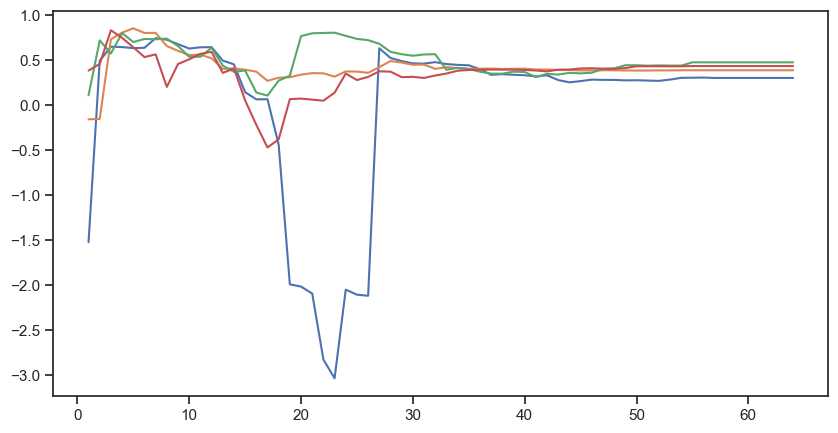

In [377]:
plt.figure(figsize=[10, 5])
plt.plot(range(1, X_train_camera.shape[1]+1), rfecv.grid_scores_)
plt.show()

In [378]:
rfecv.n_features_

4

* RFECV assumes top 4 columns would be the best contributors for Modelling Camera Accessory Data
* Let us assume 5 best and fit the model again

In [379]:
rfe = RFE(estimator=lr, n_features_to_select=5)
rfe.fit(X_train_camera, y_train_camera)


RFE(estimator=LinearRegression(), n_features_to_select=5)

In [380]:
col = X_train_camera.columns[rfe.support_]
X_train1 =X_train_camera[col]
X_test1 = X_test_camera[col]



In [381]:
X_test1.head()

,camerabattery,cameratripod,lens,TV_adstock,Content_Marketing_adstock
30,0.42,0.15,0.13,0.18,0.52
43,0.22,0.25,0.38,-0.47,0.52
29,0.07,-0.20,0.19,0.30,0.56
46,0.27,0.05,0.83,-0.47,0.52
26,0.01,0.42,0.21,0.30,0.56


### Checking features using Stats Model

In [382]:

X_train_camera_lm = model(X_train1,y_train_camera)

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     1527.
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           3.26e-32
Time:                        23:19:58   Log-Likelihood:                 34.368
No. Observations:                  33   AIC:                            -56.74
Df Residuals:                      27   BIC:                            -47.76
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [383]:
VIF(X_train_camera_lm)

,Features,VIF
1,camerabattery,19.38
3,lens,12.47
2,cameratripod,8.13
4,TV_adstock,5.33
5,Content_Marketing_adstock,5.05
0,const,1.00


### Residual Analysis

In [384]:
multi_model1 = LinearRegression()
multi_model1.fit(X_train1,y_train_camera)


y_train_pred = multi_model1.predict(X_train1)



Text(0.5, 0, 'Errors')

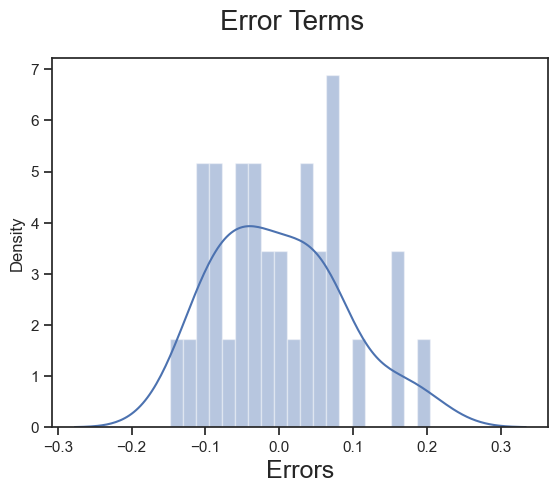

In [385]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train_camera - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 



* Error terms are distributed along 0

In [386]:
y_test_pred = multi_model1.predict(X_test1)

Text(0, 0.5, 'y_pred')

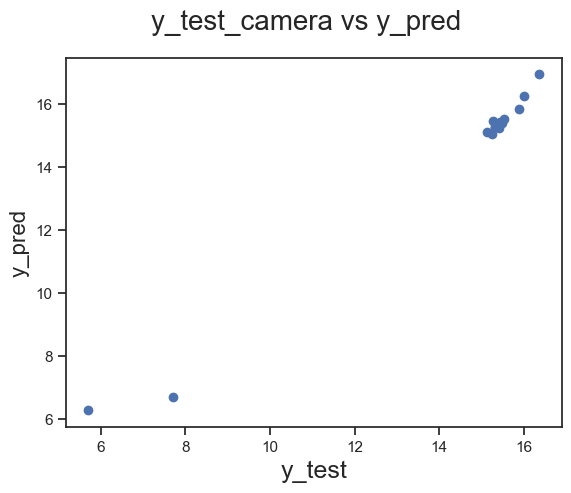

In [387]:
fig = plt.figure()
plt.scatter(y_test_camera, y_test_pred)
fig.suptitle('y_test_camera vs y_pred', fontsize = 20)              
plt.xlabel('y_test', fontsize = 18)                      
plt.ylabel('y_pred', fontsize = 16)   


In [388]:
print('r2 score of train data',r2_score(y_true= y_train_camera, y_pred = y_train_pred))
print('Mean squared error on train data:',mean_squared_error(y_train_camera,y_train_pred))
print('r2 score of test data',r2_score(y_true= y_test_camera, y_pred = y_test_pred))
print('Mean squared error on Test data:',mean_squared_error(y_test_camera,y_test_pred))


r2 score of train data 0.9964757499180964
Mean squared error on train data: 0.007293240531492189
r2 score of test data 0.9868555048474846
Mean squared error on Test data: 0.12151702573492064


In [389]:
cross_val_score(multi_model1, X_train1, y_train_camera, cv=5, n_jobs=-1, scoring="r2")

array([0.78160538, 0.90005591, 0.61245232, 0.29654746, 0.82893464])

* Some Fetures has high VIF and P vals but our motive is to find best contributors for revenue more than finding accuracy
* Top 10 features are 'cameraaccessory', 'camerabattery', 'cameramicrophone', 'cameratripod','lens', 'TV_adstock', 'Content_Marketing_adstock', 'Sponsorship_SMA3',
  'Min Temp', ' Heat Deg Days'
       


In [390]:
model_1= LinearRegression().fit(X_train_camera_lm, y_train_camera)

coef = pd.DataFrame(X_train_camera_lm.columns)
coef['Coefficient'] = pd.Series(model_1.coef_)
coef

,0,Coefficient
0,const,0.00
1,camerabattery,0.46
2,cameratripod,0.27
3,lens,0.75
4,TV_adstock,0.05
5,Content_Marketing_adstock,-0.06


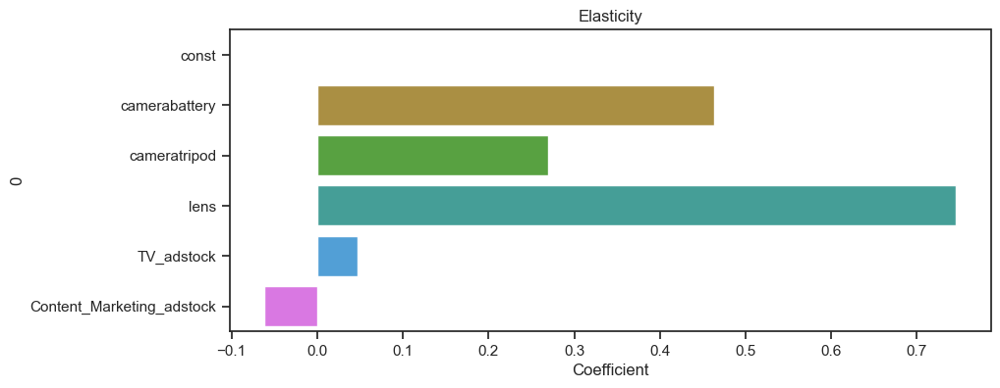

In [391]:
plt.figure(figsize=(10, 4))
sns.barplot(y=coef[0], x=coef['Coefficient'], palette='husl', estimator=np.sum)
plt.title('Elasticity')


plt.show()

### Modelling - home_audio


In [392]:
#Applying Standard scaler on DF
scaler  = StandardScaler()

scale_cols = X_train_home.columns

X_train_home[scale_cols] = scaler.fit_transform(X_train_home[scale_cols])
X_test_home[scale_cols] = scaler.transform(X_test_home[scale_cols])



In [393]:

lr  = LinearRegression()

lr.fit(X_train_gaming,y_train_gaming)

#Predicting Vars
y_train_pred_gaming = lr.predict(X_train_gaming)
y_test_pred_gaming = lr.predict(X_test_gaming)

print('r2 score of train data',r2_score(y_true= y_train_gaming, y_pred = y_train_pred_gaming))
print('r2 score of test data',r2_score(y_true= y_test_gaming, y_pred = y_test_pred_gaming))


r2 score of train data 1.0
r2 score of test data 0.9783224569724879


### RFE

In [394]:
lr = LinearRegression()

rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_home, y_train_home)



RFE(estimator=LinearRegression(), n_features_to_select=10)

In [395]:
print(rfe.ranking_)

X_train_home.columns[rfe.support_]



[36 35  9 22 34  1  3 25 11  1 28  1  8  1 39 18 29  2  1 33 12  1 14  1
  1 23  7 37 10 16 17  1 13 26 19  6  1 27 38 15 20 24 30 31 21 32 40 41
 42  5  4]


Index(['order_payment_type_prepaid', 'dock', 'fmradio', 'homeaudiospeaker',
       'TI_adstock', 'Sponsorship_adstock', 'Online_marketing_adstock',
       'Affiliates_adstock', 'ContentMarketing_SMA3', 'Other_SMA3'],
      dtype='object')

* Let us try RFECV for Feature elimination


In [396]:
lr  = LinearRegression()
rfecv = RFECV(estimator=lr, cv=4)


rfecv.fit(X_train_home, y_train_home)


RFECV(cv=4, estimator=LinearRegression())

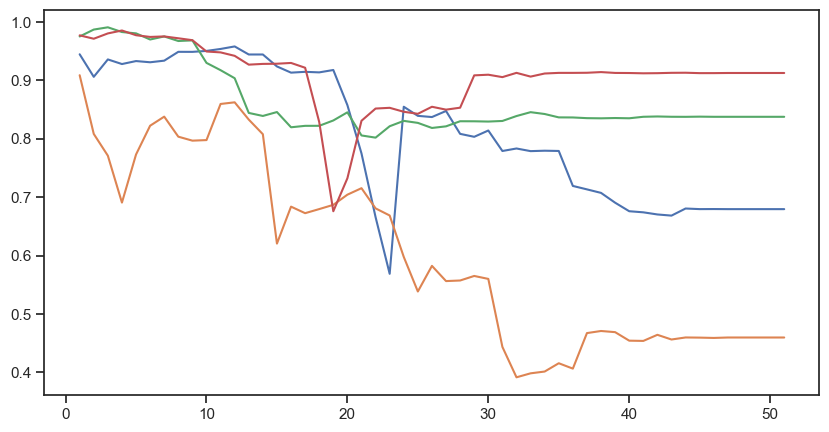

In [397]:
plt.figure(figsize=[10, 5])
plt.plot(range(1, X_train_home.shape[1]+1), rfecv.grid_scores_)
plt.show()

In [398]:
rfecv.n_features_

1

In [399]:
lr = LinearRegression()

rfe = RFE(estimator=lr, n_features_to_select=5)
rfe.fit(X_train_home, y_train_home)


RFE(estimator=LinearRegression(), n_features_to_select=5)

In [400]:
col = X_train_home.columns[rfe.support_]
X_train1 =X_train_home[col]
X_test1 = X_test_home[col]

In [401]:
X_test1.head()


,homeaudiospeaker,TI_adstock,Online_marketing_adstock,Affiliates_adstock,Other_SMA3
42,-0.62,0.06,0.40,0.28,-0.24
28,1.16,-0.22,0.42,0.46,1.96
29,0.15,-0.35,0.46,0.50,0.77
47,-0.89,-0.53,-0.58,-0.57,-0.24
38,-1.34,-0.09,0.25,0.34,-0.24


Checking features using stats Model

In [402]:
X_train_home_lm = model(X_train1,y_train_home)


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     528.4
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           2.86e-25
Time:                        23:20:00   Log-Likelihood:                 59.224
No. Observations:                  32   AIC:                            -106.4
Df Residuals:                      26   BIC:                            -97.65
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [403]:
VIF(X_train_home_lm)

,Features,VIF
3,Online_marketing_adstock,464.92
4,Affiliates_adstock,422.88
2,TI_adstock,5.15
5,Other_SMA3,1.41
1,homeaudiospeaker,1.13
0,const,1.00


* Top 5 features are homeaudiospeaker,TI_adstock,Online_marketing_adstock,Affiliates_adstock,Other_SMA3

## Residual Analysis

In [404]:
multi_model2 = LinearRegression()
multi_model2.fit(X_train1,y_train_home)


y_train_pred = multi_model2.predict(X_train1)

Text(0.5, 0, 'Errors')

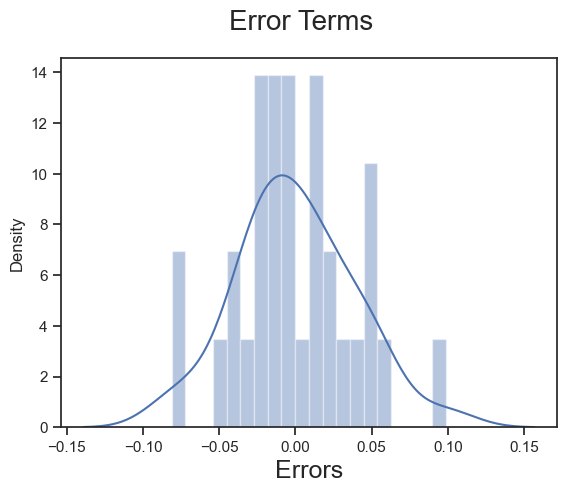

In [405]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train_home - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 


* Error terms are distributed around 0

In [406]:
y_test_pred = multi_model2.predict(X_test1)

Text(0, 0.5, 'y_pred')

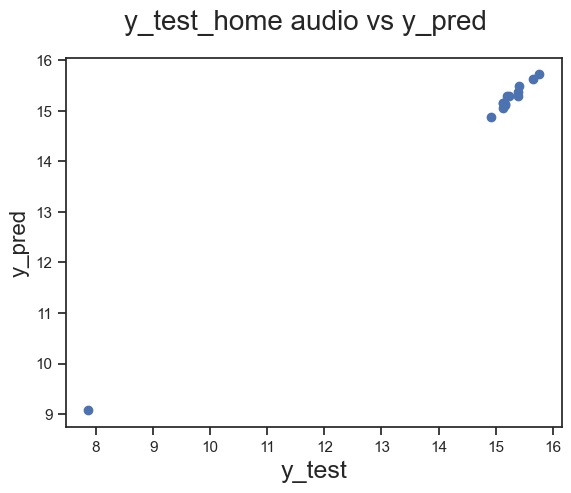

In [407]:
fig = plt.figure()
plt.scatter(y_test_home, y_test_pred)
fig.suptitle('y_test_home audio vs y_pred', fontsize = 20)              
plt.xlabel('y_test', fontsize = 18)                      
plt.ylabel('y_pred', fontsize = 16) 

In [408]:
print('r2 score of train data',r2_score(y_true= y_train_home, y_pred = y_train_pred))
print('Mean squared error on train data:',mean_squared_error(y_train_home,y_train_pred))
print('r2 score of test data',r2_score(y_true= y_test_home, y_pred = y_test_pred))
print('Mean squared error on Test data:',mean_squared_error(y_test_home,y_test_pred))


r2 score of train data 0.990254012909584
Mean squared error on train data: 0.0014454147366863407
r2 score of test data 0.9710111113597678
Mean squared error on Test data: 0.10716940481101847


In [409]:
cross_val_score(multi_model2, X_train1, y_train_home, cv=5, n_jobs=-1, scoring="r2")

array([0.97480934, 0.9603626 , 0.92039312, 0.9877782 , 0.95978622])

In [410]:
model_1= LinearRegression().fit(X_train_home_lm, y_train_home)

coef = pd.DataFrame(X_train_home_lm.columns)
coef['Coefficient'] = pd.Series(model_1.coef_)
coef


,0,Coefficient
0,const,0.00
1,homeaudiospeaker,0.38
2,TI_adstock,0.08
3,Online_marketing_adstock,-0.23
4,Affiliates_adstock,0.16
5,Other_SMA3,-0.04


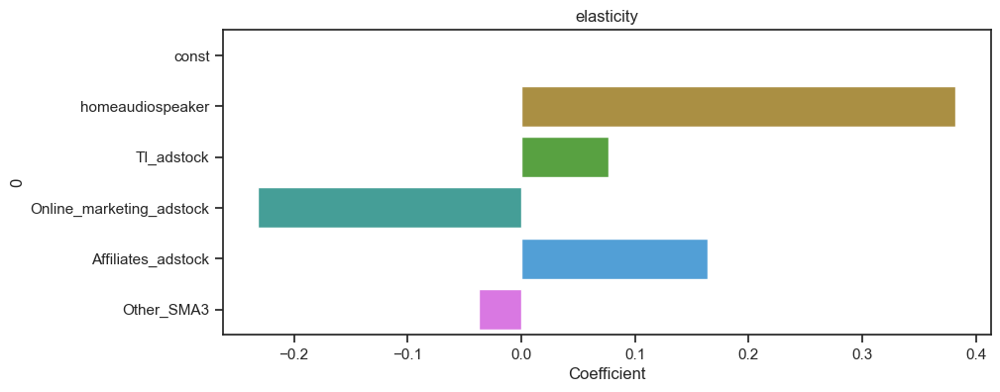

In [411]:
plt.figure(figsize=(10, 4))
sns.barplot(y=coef[0], x=coef['Coefficient'], palette='husl', estimator=np.sum)
plt.title('elasticity')


# display the plot
plt.show()

### Gaming Accessory

In [412]:
#Applying Standard scaler on DF
scaler  = StandardScaler()

scale_cols = X_train_gaming.columns

X_train_gaming[scale_cols] = scaler.fit_transform(X_train_gaming[scale_cols])
X_test_gaming[scale_cols] = scaler.transform(X_test_gaming[scale_cols])



In [413]:
lr  = LinearRegression()

lr.fit(X_train_gaming,y_train_gaming)

#Predicting Vars
y_train_pred_gaming = lr.predict(X_train_gaming)
y_test_pred_gaming = lr.predict(X_test_gaming)


In [414]:
print('r2 score of train data',r2_score(y_true= y_train_gaming, y_pred = y_train_pred_gaming))
print('r2 score of test data',r2_score(y_true= y_test_gaming, y_pred = y_test_pred_gaming))


r2 score of train data 1.0
r2 score of test data 0.9677680707881628


In [415]:
lr = LinearRegression()

rfe = RFE(estimator=lr, n_features_to_select=10)
rfe.fit(X_train_gaming, y_train_gaming)


RFE(estimator=LinearRegression(), n_features_to_select=10)

In [416]:

rfe.ranking_

X_train_gaming.columns[rfe.support_]



Index(['deliverybdays', 'gamepad', 'gamingaccessorykit', 'gamingkeyboard',
       'gamingmemorycard', 'gamingmouse', 'Digital_adstock',
       'Sponsorship_adstock', 'ContentMarketing_SMA3', 'listing_price_SMA3'],
      dtype='object')

* Let us try RFECV for Feature elimination


In [417]:
lr  = LinearRegression()
rfecv = RFECV(estimator=lr, cv=4)



In [418]:

%%time
rfecv.fit(X_train_gaming, y_train_gaming)


CPU times: total: 1.08 s
Wall time: 611 ms


RFECV(cv=4, estimator=LinearRegression())

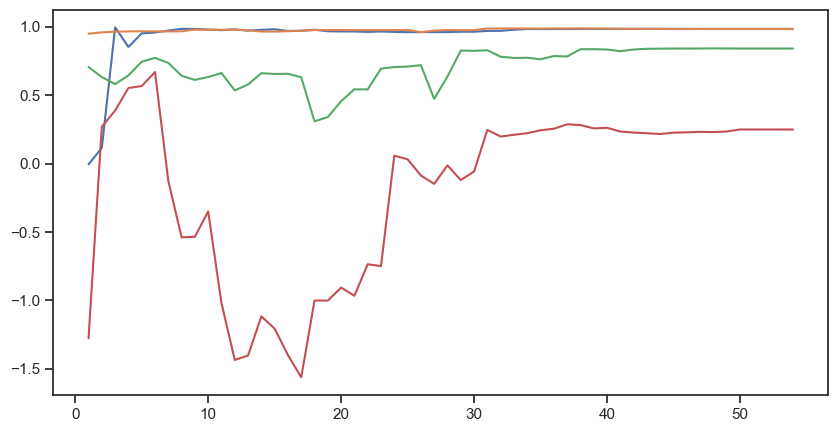

In [419]:
plt.figure(figsize=[10, 5])
plt.plot(range(1, X_train_gaming.shape[1]+1), rfecv.grid_scores_)
plt.show()


In [420]:
rfecv.n_features_

6

In [421]:
rfe = RFE(estimator=lr, n_features_to_select=6)
rfe.fit(X_train_gaming, y_train_gaming)


RFE(estimator=LinearRegression(), n_features_to_select=6)

In [422]:
col = X_train_gaming.columns[rfe.support_]
X_train1 =X_train_gaming[col]
X_test1 = X_test_gaming[col]




In [423]:
X_train_gaming_lm = model(X_train1,y_train_gaming)


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     1341.
Date:                Tue, 07 Feb 2023   Prob (F-statistic):           4.25e-32
Time:                        23:20:02   Log-Likelihood:                 27.279
No. Observations:                  34   AIC:                            -40.56
Df Residuals:                      27   BIC:                            -29.87
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    14.47

In [424]:

VIF(X_train_gaming_lm)

,Features,VIF
1,gamepad,51.78
2,gamingaccessorykit,35.89
4,gamingmouse,34.62
3,gamingkeyboard,26.03
5,ContentMarketing_SMA3,6.74
6,listing_price_SMA3,3.82
0,const,1.00


### Residual Analysis

In [425]:
multi_model3 = LinearRegression()
multi_model3.fit(X_train1,y_train_gaming)


y_train_pred = multi_model3.predict(X_train1)



Text(0.5, 0, 'Errors')

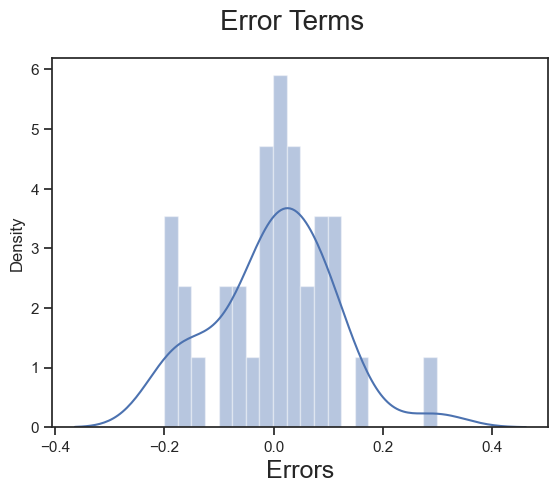

In [426]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train_gaming - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

* Error terms are distributed around 0

In [427]:
y_test_pred = multi_model3.predict(X_test1)

Text(0, 0.5, 'y_pred')

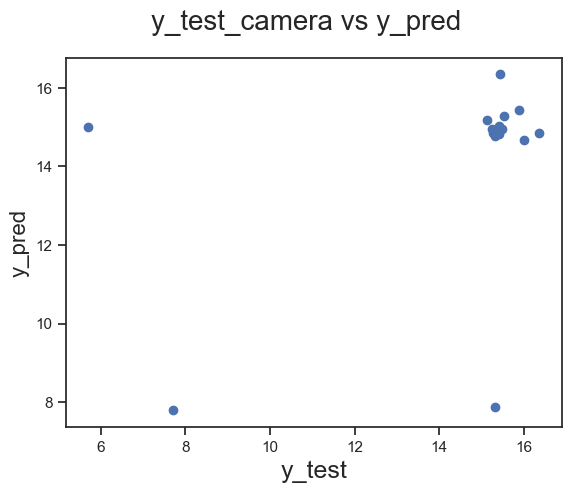

In [428]:
fig = plt.figure()
plt.scatter(y_test_camera, y_test_pred)
fig.suptitle('y_test_camera vs y_pred', fontsize = 20)              
plt.xlabel('y_test', fontsize = 18)                      
plt.ylabel('y_pred', fontsize = 16) 

In [429]:
print('r2 score of train data',r2_score(y_true= y_train_gaming, y_pred = y_train_pred))
print('Mean squared error on train data:',mean_squared_error(y_train_gaming,y_train_pred))
print('r2 score of test data',r2_score(y_true= y_test_gaming, y_pred = y_test_pred))
print('Mean squared error on Test data:',mean_squared_error(y_test_gaming,y_test_pred))

r2 score of train data 0.9966545388956052
Mean squared error on train data: 0.011766123173594574
r2 score of test data 0.9887077514241147
Mean squared error on Test data: 0.06342773777337556


In [430]:
cross_val_score(multi_model3, X_train1, y_train_gaming, cv=5, n_jobs=-1, scoring="r2")

array([0.97512136, 0.96967711, 0.43443105, 0.86624787, 0.83240558])

In [431]:

model_1= LinearRegression().fit(X_train_gaming_lm, y_train_gaming)

coef = pd.DataFrame(X_train_gaming_lm.columns)
coef['Coefficient'] = pd.Series(model_1.coef_)
coef

,0,Coefficient
0,const,0.00
1,gamepad,0.51
2,gamingaccessorykit,0.43
3,gamingkeyboard,0.42
4,gamingmouse,0.29
5,ContentMarketing_SMA3,0.07
6,listing_price_SMA3,0.22


<AxesSubplot:xlabel='Coefficient', ylabel='0'>

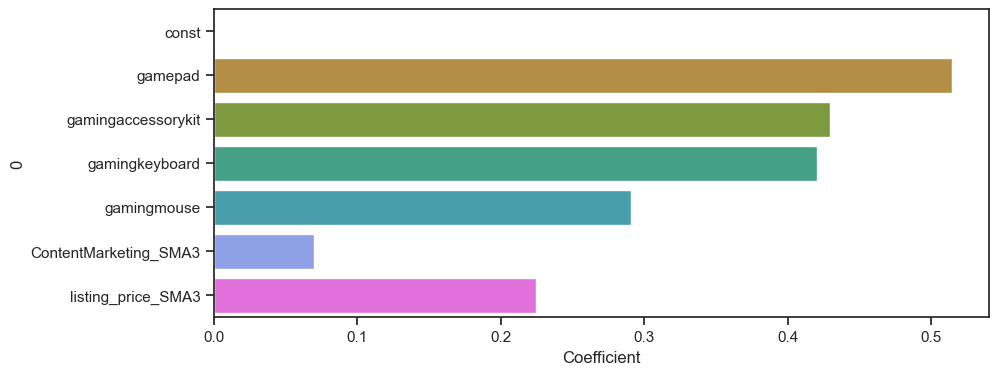

In [432]:
plt.figure(figsize=(10, 4))
sns.barplot(y=coef[0], x=coef['Coefficient'], palette='husl', estimator=np.sum)

## Summary

* Dataset 'ConsumerElectronics' have 1648824 rows and 20 cols
* Understanding Data : The target variable, in this case is decided as 'gmv' Which is Gross merchandise value
* Data Preparation: After data cleaning, Removing NUlls and Outliers total rows retained from Datset are 1465066 which is  88%
  - Imputed null values in few col with 0 and dropped rest of the rows which has NAN vals
  - Converted few Features from Categorical cols to Flot vars
  - Treated Outliers of few cols and replaced with 0,99 percentile
  
* Feature Engineering: Derived New KPIs whic are needed for MMM
       - Derived New col week from Date col
      - A - KPIs replated to Advertisement
           * Generated Adstock values from the Adverisement spends
      - P - KPI's related to price
          * listing_price =  gmv/total_units
          * replaced MRP with listing price where listing price more than MRP
      - D - KPI's related to discount
          * Discount%  =  mrp-listprice/mrp
      - Q -  KPI's Related to Product assortment and Quality
            * Order_payment_type
            * Generating new coulumn weather product is premium or not
             * NPS score from the customers
      - T - KPI's related to industry trend, Seasonality Etc
           * SpeciAl Sale Calender
           * Holiday list
           * payday

After feature selection, Aggregated the Complete Dataset to weekly level and Seggregated the Data to three Categories
- Camera accessoried
- Home audio
- Gaming Accessory

Used Linear Regression Additive Model and Multiplicative Model on all three Datasets
- Below are few observations based on the Modellng
       Additive Model Scores:
       Camera Accessary  -  R2 Score on Test Data - 0.8014843753292288, on Train data - 0.9751149715897107
       Home Audio -  R2 Score on Test Data - 0.14963637297420018, on Train data - 0.14963637297420018
       Gaming Accessary-  R2 Score on Test Data - -1.5303001348794707, on Train data - 0.9773583045274947
       Multiplicative Model: 
       Camera Accessary  -  R2 Score on Test Data -- 0.9868555048474846, on Train data - 0.990254012909584
       Home Audio -  R2 Score on Test Data -- 0.990254012909584, on Train data - 0.990254012909584
       Gaming Accessary -  R2 Score on Test Data -- 0.9887077514241147, on Train data - 0.9966545388956052
       
        
Overall Multiplicative Model has the best fit on the dataset

Best Fit line of All three Multiplicative Models are as below

    revenue(Camera Accessary) =  Const + 0.46 * Other_SMA3 + 0,27 * cameratripod + 0.75 * lens + 0.05 * Tv_Adstock – 0.06 * Content_Marketing_adstock

Revenue(Home Audio) = Const + 0.38 * homeaudiospeaker + homeaudiospeaker * homeaudiospeaker - 0.23*Online_marketing_adstock + 0.16 * Online_marketing_adstock - 0.04 * Other_SMA3

Revenue(Gaming Accessory): Const + 0.51 * gamepad + 0.43* gamingaccessorykit + 0.42 * gamingkeyboard + gamingkeyboard + gamingkeyboard + ContentMarketing_SMA3 * ContentMarketing_SMA3  +  0.22* listing_price_SMA3


Recommendations:
Camera Accessary:
* Concentrate More on products like camerabattery, lens and Cameratripod
* These Items yeild more revenue 
* TV is the best advertising Media of all. Invest in the TV advertising and Content marketing can be skipped

Home Audio:
Concentrate on 
* Concentrate more on products game pad, gaming accessory kit, keyboard and mouse
* Content marketing is the best marketing statergy fpr Home Audio products


Gaming Accessary:
* Concentrate more on products game pad, gaming accessory kit, keyboard and mouse
* Content marketing is the best marketing statergy fpr Home Audio products


